In [5]:
# Importing libraries
import numpy as np
import matplotlib.pyplot as plt
import torch
import torch.nn as nn
import torch.optim as optim
import random
from matplotlib.ticker import LogLocator
from matplotlib.ticker import LogLocator, FormatStrFormatter

# 1

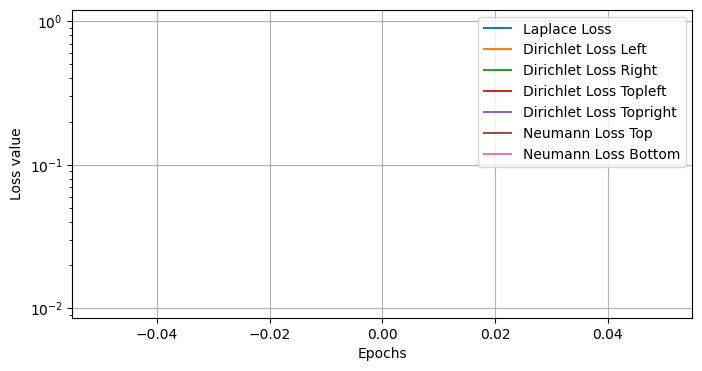

Epoch 0, Loss: 999.7322998046875


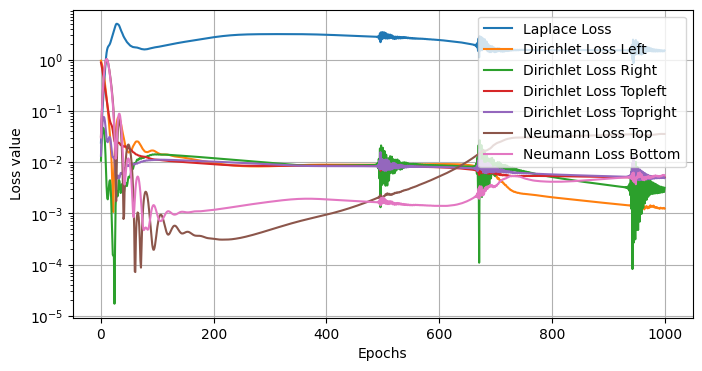

Epoch 1000, Loss: 17.62928009033203


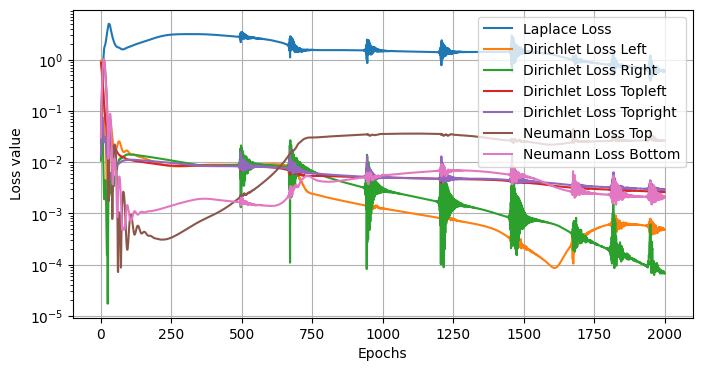

Epoch 2000, Loss: 9.665314674377441


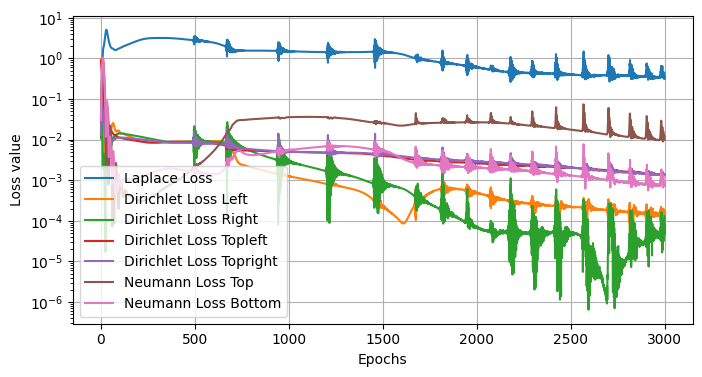

Epoch 3000, Loss: 4.459850311279297


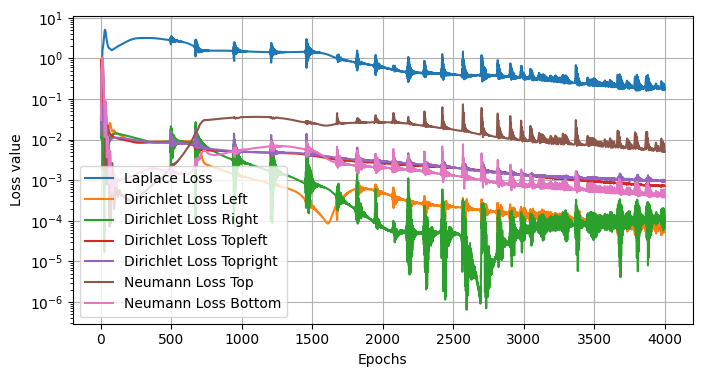

Epoch 4000, Loss: 2.612597703933716


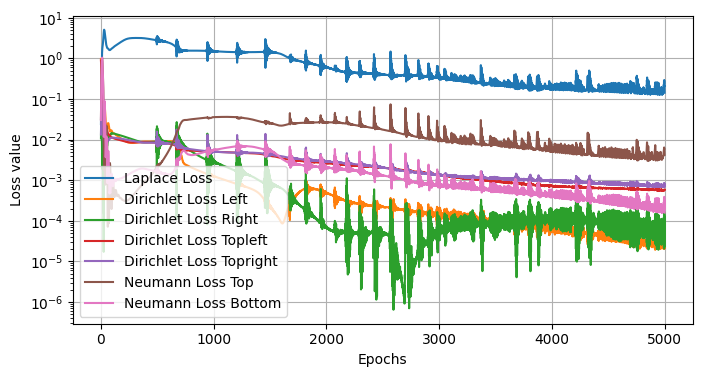

Epoch 5000, Loss: 2.0798895359039307


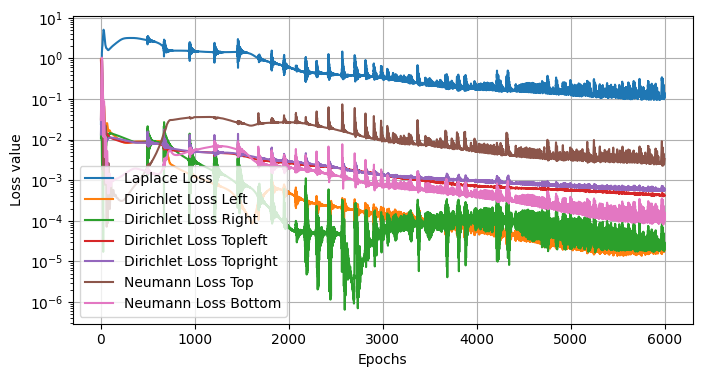

Epoch 6000, Loss: 1.5993425846099854


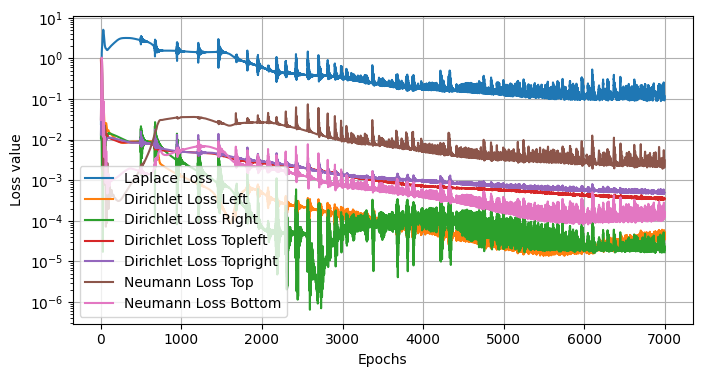

Epoch 7000, Loss: 1.3969227075576782


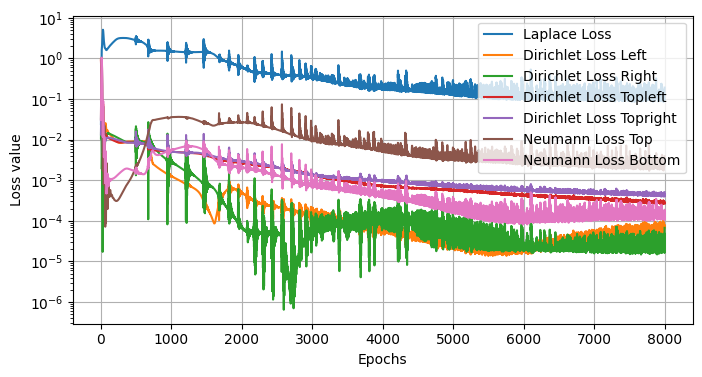

Epoch 8000, Loss: 1.5733067989349365


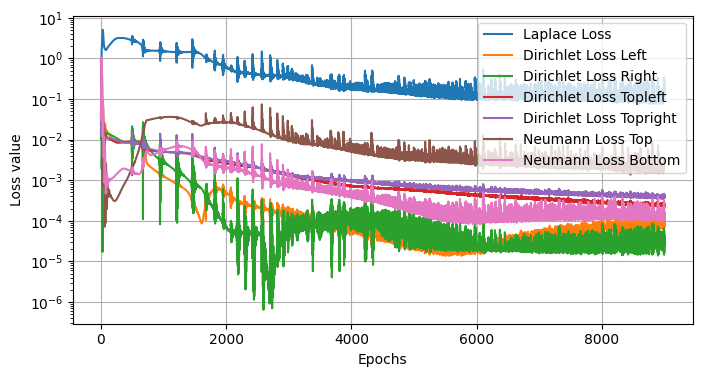

Epoch 9000, Loss: 1.5679587125778198


In [ ]:
def set_seed(seed=42):
    random.seed(seed)  # Python random module
    np.random.seed(seed)  # Numpy random module
    torch.manual_seed(seed)  # PyTorch CPU
    torch.cuda.manual_seed(seed)  # PyTorch GPU
    torch.cuda.manual_seed_all(seed)  # All GPUs (if multiple)

# Set the seed
set_seed(123)

# Define the neural network for the Physics-Informed Neural Network (PINN)
class pinn(nn.Module):
    def __init__(self, hidden_size=20, hidden_layers=3):
        super(pinn, self).__init__()
        layers = [nn.Linear(2, hidden_size), nn.Tanh()]  # Change Tanh to GeLU
        for _ in range(hidden_layers):
            layers.append(nn.Linear(hidden_size, hidden_size))
            layers.append(nn.Tanh())  # Change Tanh to GeLU
        layers.append(nn.Linear(hidden_size, 1))
        self.network = nn.Sequential(*layers)
        
    def forward(self, x):
        return self.network(x)

def laplace_residual(model, coords):
    u = model(coords)
    grads = torch.autograd.grad(u, coords, grad_outputs=torch.ones_like(u), create_graph=True)[0]
    u_xx = torch.autograd.grad(grads[:, 0], coords, grad_outputs=torch.ones_like(grads[:, 0]), create_graph=True)[0][:, 0]
    u_yy = torch.autograd.grad(grads[:, 1], coords, grad_outputs=torch.ones_like(grads[:, 1]), create_graph=True)[0][:, 1]
    return torch.mean((u_xx + u_yy) ** 2)

#Boundary conditions:
def loss_dirichlet_boundary(model,boundary_points,boundary_target):
    u_pred = model(boundary_points)
    boundary_residual= u_pred-boundary_target
    return torch.mean((boundary_residual)**2)

def loss_neumann_boundary(model,boundary_points,axis='horizontal'):
    u_pred = model(boundary_points)
    u_grad= torch.autograd.grad(u_pred,boundary_points,grad_outputs=torch.ones_like(u_pred),create_graph=True)[0] #This is the gradient of u 
    if axis=='vertical':
        u_x = u_grad[:,0] # This is the x-component of the gradient of u
        return torch.mean((u_x)**2)
    elif axis=='horizontal':
        u_y = u_grad[:,1] # This is the y-component of the gradient of u
        return torch.mean((u_y)**2)

# Function to create boundary points
def create_boundary_points(axis, place, start, end, num_points, head=None):
    line_points = torch.full((num_points, 1), place)
    place_points = start + (end - start) * torch.rand(num_points, 1)
    
    if axis == 'vertical':
        boundary_points = torch.cat([line_points, place_points], dim=1)
    elif axis == 'horizontal':
        boundary_points = torch.cat([place_points, line_points], dim=1)

    # Only return targets if head value is provided (for Dirichlet conditions)
    if head is not None:
        boundary_targets = torch.full((num_points, 1), head, dtype=torch.float)
        return boundary_points, boundary_targets
    else:
        return boundary_points

def plot_losses(epochs, losses_dict):
    plt.figure(figsize=(8, 4))
    
    for loss_name, loss_values in losses_dict.items():
        plt.plot(epochs, loss_values, label=loss_name)
    plt.gca().yaxis.set_major_locator(LogLocator(base=10.0))
    plt.gca().yaxis.set_major_formatter(FormatStrFormatter('%.1f'))

    plt.yscale('log')
    plt.xlabel("Epochs")
    plt.ylabel("Loss value")
    plt.grid()
    plt.legend()
    plt.show()


def closure():
    # Compute individual loss terms
    loss_laplace = laplace_residual(model, train_points)
    loss_d_l = loss_dirichlet_boundary(model, boundary_points_dirichlet_left, target_points_dirichlet_left)
    loss_d_r = loss_dirichlet_boundary(model, boundary_points_dirichlet_right, target_points_dirichlet_right)
    loss_d_tl = loss_dirichlet_boundary(model, boundary_points_dirichlet_topleft, target_points_dirichlet_topleft)
    loss_d_tr = loss_dirichlet_boundary(model, boundary_points_dirichlet_topright, target_points_dirichlet_topright)
    loss_n_t = loss_neumann_boundary(model, boundary_points_neumann_top, axis='horizontal')
    loss_n_b = loss_neumann_boundary(model, boundary_points_neumann_bottom, axis='horizontal')
    
    # Combine losses using the updated weights
    loss = (
        loss_weights[0] * loss_laplace +
        loss_weights[1] * loss_d_l +
        loss_weights[2] * loss_d_r +
        loss_weights[3] * loss_d_tl +
        loss_weights[4] * loss_d_tr +
        loss_weights[5] * loss_n_t +
        loss_weights[6] * loss_n_b
    )
    
    # Record losses and weights
    laplace_losses.append(loss_laplace.item())
    dirichlet_losses_left.append(loss_d_l.item())
    dirichlet_losses_right.append(loss_d_r.item())
    dirichlet_losses_topleft.append(loss_d_tl.item())
    dirichlet_losses_topright.append(loss_d_tr.item())
    neumann_losses_top.append(loss_n_t.item())
    neumann_losses_bottom.append(loss_n_b.item())
    epochs_recorded.append(epoch)

    return loss

#_____________________________________________________________________________________________________________

#Domain size:
left, right, bottom, top = 0, 1, 0, 0.2

left_dirichlet,target_left_dirichlet = create_boundary_points('vertical', left, 0, top, 1000, 1)  # Left boundary
boundary_points_dirichlet_left=torch.cat([left_dirichlet],dim=0).requires_grad_(True)  # Concatenate Dirichlet boundary points
target_points_dirichlet_left=torch.cat([target_left_dirichlet],dim=0).requires_grad_(True) # Concatenate Dirichlet boundary targets

right_dirichlet, target_right_dirichlet = create_boundary_points('vertical', right, 0, top, 1000, 0) # Right boundary
boundary_points_dirichlet_right=torch.cat([right_dirichlet],dim=0).requires_grad_(True) # Concatenate Dirichlet boundary points
target_points_dirichlet_right=torch.cat([target_right_dirichlet],dim=0).requires_grad_(True) # Concatenate Dirichlet boundary targets

topleft_dirichlet, target_topleft_dirichlet= create_boundary_points('horizontal', top, 0, 0.3*right, 3000, 1)
boundary_points_dirichlet_topleft=torch.cat([topleft_dirichlet],dim=0).requires_grad_(True)
target_points_dirichlet_topleft=torch.cat([target_topleft_dirichlet],dim=0).requires_grad_(True)

topright_dirichlet,target_topright_dirichlet = create_boundary_points('horizontal', top, 0.7*right, 1*right, 3000, 0)
boundary_points_dirichlet_topright=torch.cat([topright_dirichlet],dim=0).requires_grad_(True)
target_points_dirichlet_topright=torch.cat([target_topright_dirichlet],dim=0).requires_grad_(True)

top_neumann=create_boundary_points('horizontal', top, 0.3*right, 0.7*right, 3000)
boundary_points_neumann_top=torch.cat([top_neumann],dim=0).requires_grad_(True)

bottom_neumann=create_boundary_points('horizontal', bottom, 0, right, 1000)
boundary_points_neumann_bottom=torch.cat([bottom_neumann],dim=0).requires_grad_(True)


# Creating domain points
num_domain_points=10000
x_points = torch.rand(num_domain_points,1) 
x = (x_points*right).requires_grad_(True)
y_points = torch.rand(num_domain_points,1)
y=(y_points*top).requires_grad_(True)
train_points=torch.cat([x,y],dim=1) 

# Initialize lists to store losses and plot
laplace_losses = []
dirichlet_losses_left = []
dirichlet_losses_right = []
dirichlet_losses_topleft = []
dirichlet_losses_topright = []
neumann_losses_top = []
neumann_losses_bottom = []
epochs_recorded = []


#Defining hyperparameters:
model=pinn(hidden_size=20, hidden_layers=8) 

epochs=10000

# Initialize the loss weights
lambda_laplace, y_d_l, y_d_r, y_d_tl, y_d_tr, y_n_t, y_n_b = 2,100,100,1000,1000,100,100
loss_weights = (torch.tensor([lambda_laplace, y_d_l, y_d_r, y_d_tl, y_d_tr, y_n_t, y_n_b], 
                            dtype=torch.float, requires_grad=False))

adam_optimizer = torch.optim.Adam(model.parameters(), lr=0.001)

# Initialize the weights and biases of the model
def initialize_weights(m):
    if isinstance(m, nn.Linear):
        nn.init.xavier_normal_(m.weight)  # Use Xavier initialization
        nn.init.zeros_(m.bias)  # Initialize biases to zero
# Apply weight initialization
model.apply(initialize_weights)


#Training loop:
for epoch in range(epochs):
    adam_optimizer.zero_grad()
    loss=closure()
    loss.backward()
    adam_optimizer.step() # Update the weights and biases of the model

    # Logging
    if epoch % 1000 == 0:
        losses_dict = {
            "Laplace Loss": laplace_losses,
            "Dirichlet Loss Left": dirichlet_losses_left,
            "Dirichlet Loss Right": dirichlet_losses_right,
            "Dirichlet Loss Topleft": dirichlet_losses_topleft,
            "Dirichlet Loss Topright": dirichlet_losses_topright,
            "Neumann Loss Top": neumann_losses_top,
            "Neumann Loss Bottom": neumann_losses_bottom
        }

        plot_losses(epochs_recorded, losses_dict)
        print(f"Epoch {epoch}, Loss: {loss.item()}")

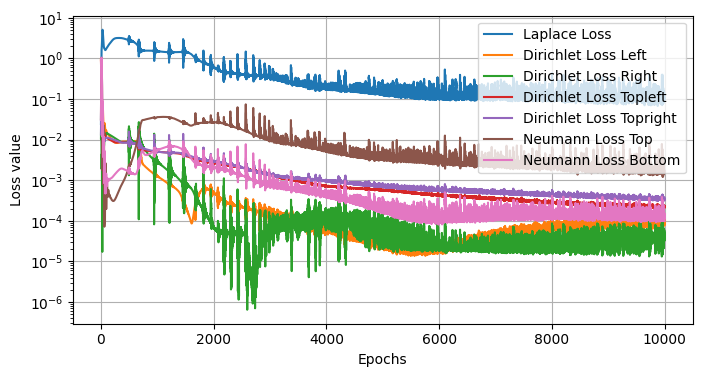

epoch 9999, Loss: 0.9754252433776855

30m 44.0s

In [10]:
# Assume `model` is your trained instance of the `pinn` class
model_path = "#1.1.pth"
torch.save(model.state_dict(), model_path)
print(f"Model's state dictionary saved to {model_path}")

Model's state dictionary saved to #1.1.pth


# 2 - SGD

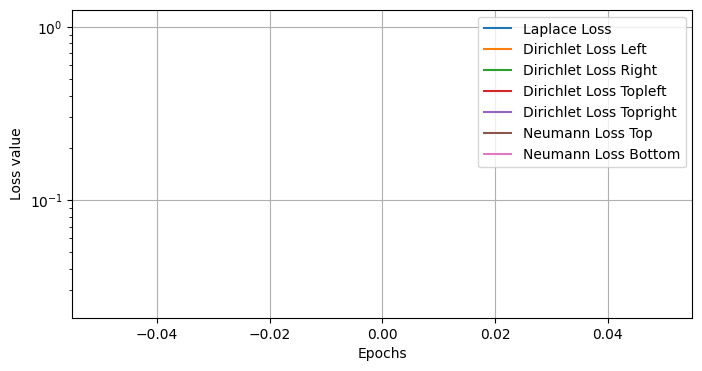

Epoch 0, Loss: 1135.4716796875


KeyboardInterrupt: 

In [ ]:
def set_seed(seed=42):
    random.seed(seed)  # Python random module
    np.random.seed(seed)  # Numpy random module
    torch.manual_seed(seed)  # PyTorch CPU
    torch.cuda.manual_seed(seed)  # PyTorch GPU
    torch.cuda.manual_seed_all(seed)  # All GPUs (if multiple)

# Set the seed
set_seed(123)

# Define the neural network for the Physics-Informed Neural Network (PINN)
class pinn(nn.Module):
    def __init__(self, hidden_size=20, hidden_layers=3):
        super(pinn, self).__init__()
        layers = [nn.Linear(2, hidden_size), nn.Tanh()]  # Change Tanh to GeLU
        for _ in range(hidden_layers):
            layers.append(nn.Linear(hidden_size, hidden_size))
            layers.append(nn.Tanh())  # Change Tanh to GeLU
        layers.append(nn.Linear(hidden_size, 1))
        self.network = nn.Sequential(*layers)
        
    def forward(self, x):
        return self.network(x)

def laplace_residual(model, coords):
    u = model(coords)
    grads = torch.autograd.grad(u, coords, grad_outputs=torch.ones_like(u), create_graph=True)[0]
    u_xx = torch.autograd.grad(grads[:, 0], coords, grad_outputs=torch.ones_like(grads[:, 0]), create_graph=True)[0][:, 0]
    u_yy = torch.autograd.grad(grads[:, 1], coords, grad_outputs=torch.ones_like(grads[:, 1]), create_graph=True)[0][:, 1]
    return torch.mean((u_xx + u_yy) ** 2)

#Boundary conditions:
def loss_dirichlet_boundary(model,boundary_points,boundary_target):
    u_pred = model(boundary_points)
    boundary_residual= u_pred-boundary_target
    return torch.mean((boundary_residual)**2)

def loss_neumann_boundary(model,boundary_points,axis='horizontal'):
    u_pred = model(boundary_points)
    u_grad= torch.autograd.grad(u_pred,boundary_points,grad_outputs=torch.ones_like(u_pred),create_graph=True)[0] #This is the gradient of u 
    if axis=='vertical':
        u_x = u_grad[:,0] # This is the x-component of the gradient of u
        return torch.mean((u_x)**2)
    elif axis=='horizontal':
        u_y = u_grad[:,1] # This is the y-component of the gradient of u
        return torch.mean((u_y)**2)

# Function to create boundary points
def create_boundary_points(axis, place, start, end, num_points, head=None):
    line_points = torch.full((num_points, 1), place)
    place_points = start + (end - start) * torch.rand(num_points, 1)
    
    if axis == 'vertical':
        boundary_points = torch.cat([line_points, place_points], dim=1)
    elif axis == 'horizontal':
        boundary_points = torch.cat([place_points, line_points], dim=1)

    # Only return targets if head value is provided (for Dirichlet conditions)
    if head is not None:
        boundary_targets = torch.full((num_points, 1), head, dtype=torch.float)
        return boundary_points, boundary_targets
    else:
        return boundary_points

def plot_losses(epochs, losses_dict):
    plt.figure(figsize=(8, 4))
    
    for loss_name, loss_values in losses_dict.items():
        plt.plot(epochs, loss_values, label=loss_name)
    plt.gca().yaxis.set_major_locator(LogLocator(base=10.0))
    plt.gca().yaxis.set_major_formatter(FormatStrFormatter('%.1f'))

    plt.yscale('log')
    plt.xlabel("Epochs")
    plt.ylabel("Loss value")
    plt.grid()
    plt.legend()
    plt.show()


def closure():
    # Compute individual loss terms
    loss_laplace = laplace_residual(model, train_points)
    loss_d_l = loss_dirichlet_boundary(model, boundary_points_dirichlet_left, target_points_dirichlet_left)
    loss_d_r = loss_dirichlet_boundary(model, boundary_points_dirichlet_right, target_points_dirichlet_right)
    loss_d_tl = loss_dirichlet_boundary(model, boundary_points_dirichlet_topleft, target_points_dirichlet_topleft)
    loss_d_tr = loss_dirichlet_boundary(model, boundary_points_dirichlet_topright, target_points_dirichlet_topright)
    loss_n_t = loss_neumann_boundary(model, boundary_points_neumann_top, axis='horizontal')
    loss_n_b = loss_neumann_boundary(model, boundary_points_neumann_bottom, axis='horizontal')
    
    # Combine losses using the updated weights
    loss = (
        loss_weights[0] * loss_laplace +
        loss_weights[1] * loss_d_l +
        loss_weights[2] * loss_d_r +
        loss_weights[3] * loss_d_tl +
        loss_weights[4] * loss_d_tr +
        loss_weights[5] * loss_n_t +
        loss_weights[6] * loss_n_b
    )
    
    # Record losses and weights
    laplace_losses.append(loss_laplace.item())
    dirichlet_losses_left.append(loss_d_l.item())
    dirichlet_losses_right.append(loss_d_r.item())
    dirichlet_losses_topleft.append(loss_d_tl.item())
    dirichlet_losses_topright.append(loss_d_tr.item())
    neumann_losses_top.append(loss_n_t.item())
    neumann_losses_bottom.append(loss_n_b.item())
    epochs_recorded.append(epoch)

    return loss

#_____________________________________________________________________________________________________________

#Domain size:
left, right, bottom, top = 0, 1, 0, 0.2

left_dirichlet,target_left_dirichlet = create_boundary_points('vertical', left, 0, top, 1000, 1)  # Left boundary
boundary_points_dirichlet_left=torch.cat([left_dirichlet],dim=0).requires_grad_(True)  # Concatenate Dirichlet boundary points
target_points_dirichlet_left=torch.cat([target_left_dirichlet],dim=0).requires_grad_(True) # Concatenate Dirichlet boundary targets

right_dirichlet, target_right_dirichlet = create_boundary_points('vertical', right, 0, top, 1000, 0) # Right boundary
boundary_points_dirichlet_right=torch.cat([right_dirichlet],dim=0).requires_grad_(True) # Concatenate Dirichlet boundary points
target_points_dirichlet_right=torch.cat([target_right_dirichlet],dim=0).requires_grad_(True) # Concatenate Dirichlet boundary targets

topleft_dirichlet, target_topleft_dirichlet= create_boundary_points('horizontal', top, 0, 0.3*right, 3000, 1)
boundary_points_dirichlet_topleft=torch.cat([topleft_dirichlet],dim=0).requires_grad_(True)
target_points_dirichlet_topleft=torch.cat([target_topleft_dirichlet],dim=0).requires_grad_(True)

topright_dirichlet,target_topright_dirichlet = create_boundary_points('horizontal', top, 0.7*right, 1*right, 3000, 0)
boundary_points_dirichlet_topright=torch.cat([topright_dirichlet],dim=0).requires_grad_(True)
target_points_dirichlet_topright=torch.cat([target_topright_dirichlet],dim=0).requires_grad_(True)

top_neumann=create_boundary_points('horizontal', top, 0.3*right, 0.7*right, 3000)
boundary_points_neumann_top=torch.cat([top_neumann],dim=0).requires_grad_(True)

bottom_neumann=create_boundary_points('horizontal', bottom, 0, right, 1000)
boundary_points_neumann_bottom=torch.cat([bottom_neumann],dim=0).requires_grad_(True)


# Creating domain points
num_domain_points=10000
x_points = torch.rand(num_domain_points,1) 
x = (x_points*right).requires_grad_(True)
y_points = torch.rand(num_domain_points,1)
y=(y_points*top).requires_grad_(True)
train_points=torch.cat([x,y],dim=1) 

# Initialize lists to store losses and plot
laplace_losses = []
dirichlet_losses_left = []
dirichlet_losses_right = []
dirichlet_losses_topleft = []
dirichlet_losses_topright = []
neumann_losses_top = []
neumann_losses_bottom = []
epochs_recorded = []


#Defining hyperparameters:
model=pinn(hidden_size=20, hidden_layers=8) 

epochs=10001

# Initialize the loss weights
lambda_laplace, y_d_l, y_d_r, y_d_tl, y_d_tr, y_n_t, y_n_b = 2,100,100,1000,1000,100,100
loss_weights = (torch.tensor([lambda_laplace, y_d_l, y_d_r, y_d_tl, y_d_tr, y_n_t, y_n_b], 
                            dtype=torch.float, requires_grad=False))

adam_optimizer = torch.optim.SGD(model.parameters(), lr=0.001)

# Initialize the weights and biases of the model
def initialize_weights(m):
    if isinstance(m, nn.Linear):
        nn.init.xavier_normal_(m.weight)  # Use Xavier initialization
        nn.init.zeros_(m.bias)  # Initialize biases to zero
# Apply weight initialization
model.apply(initialize_weights)


#Training loop:
for epoch in range(epochs):
    adam_optimizer.zero_grad()
    loss=closure()
    loss.backward()
    adam_optimizer.step() # Update the weights and biases of the model

    # Logging
    if epoch % 2000 == 0:
        losses_dict = {
            "Laplace Loss": laplace_losses,
            "Dirichlet Loss Left": dirichlet_losses_left,
            "Dirichlet Loss Right": dirichlet_losses_right,
            "Dirichlet Loss Topleft": dirichlet_losses_topleft,
            "Dirichlet Loss Topright": dirichlet_losses_topright,
            "Neumann Loss Top": neumann_losses_top,
            "Neumann Loss Bottom": neumann_losses_bottom
        }

        plot_losses(epochs_recorded, losses_dict)
        print(f"Epoch {epoch}, Loss: {loss.item()}")

In [27]:
# Assume `model` is your trained instance of the `pinn` class
model_path = "#1.2.pth"
torch.save(model.state_dict(), model_path)
print(f"Model's state dictionary saved to {model_path}")

Model's state dictionary saved to #1.2.pth


# 3 - lbfgs

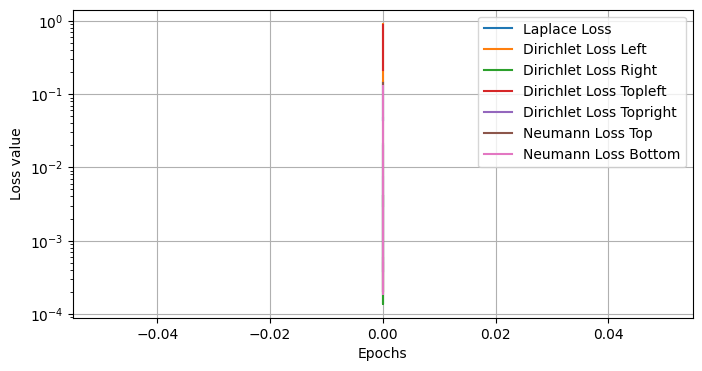

Epoch 0, Loss: 2.06958270072937


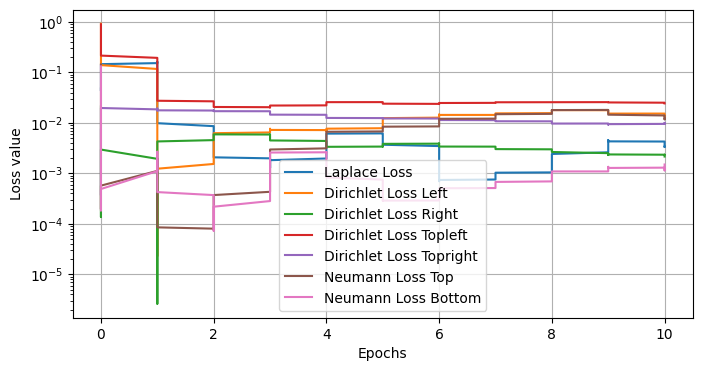

Epoch 10, Loss: 2.06958270072937


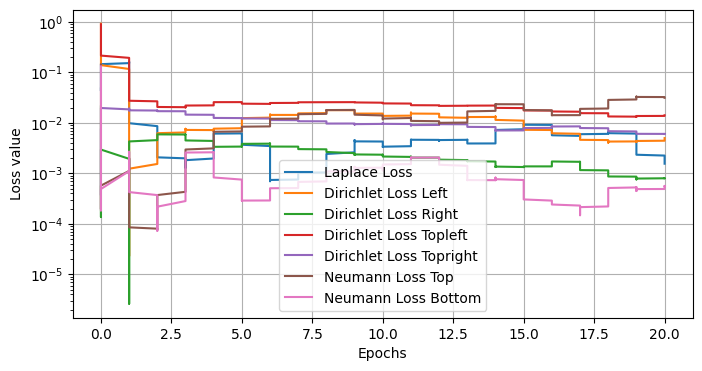

Epoch 20, Loss: 2.06958270072937


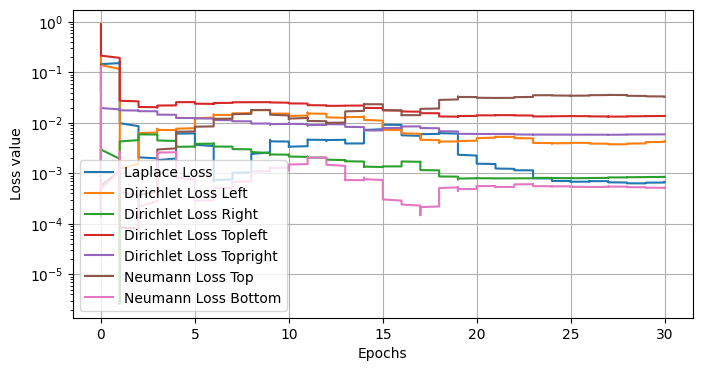

Epoch 30, Loss: 2.06958270072937


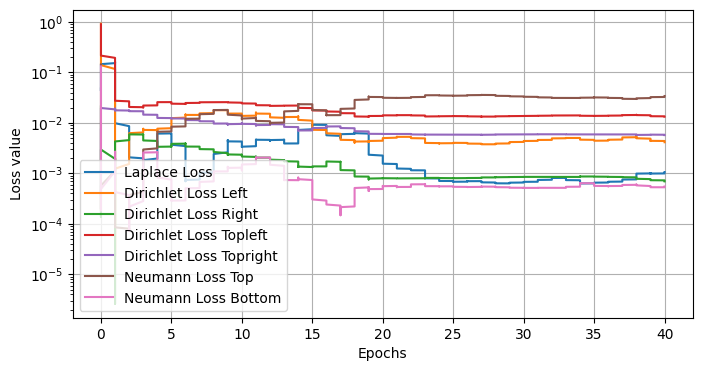

Epoch 40, Loss: 2.06958270072937


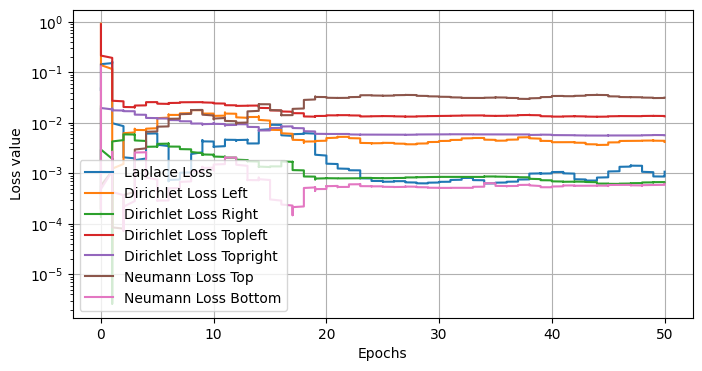

Epoch 50, Loss: 2.06958270072937


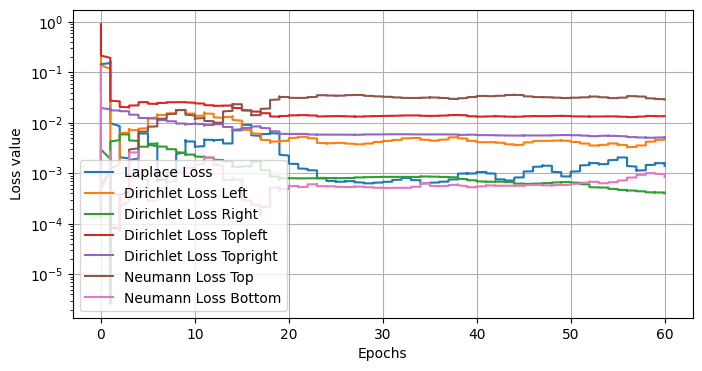

Epoch 60, Loss: 2.06958270072937


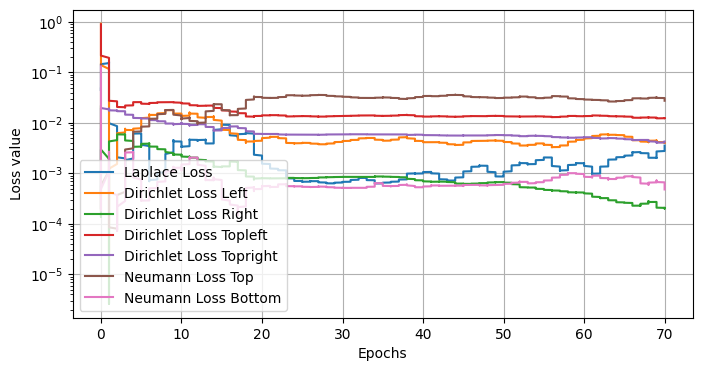

Epoch 70, Loss: 2.06958270072937


KeyboardInterrupt: 

In [86]:
def set_seed(seed=42):
    random.seed(seed)  # Python random module
    np.random.seed(seed)  # Numpy random module
    torch.manual_seed(seed)  # PyTorch CPU
    torch.cuda.manual_seed(seed)  # PyTorch GPU
    torch.cuda.manual_seed_all(seed)  # All GPUs (if multiple)

# Set the seed
set_seed(123)

# Define the neural network for the Physics-Informed Neural Network (PINN)
class pinn(nn.Module):
    def __init__(self, hidden_size=20, hidden_layers=3):
        super(pinn, self).__init__()
        layers = [nn.Linear(2, hidden_size), nn.Tanh()]  # Change Tanh to GeLU
        for _ in range(hidden_layers):
            layers.append(nn.Linear(hidden_size, hidden_size))
            layers.append(nn.Tanh())  # Change Tanh to GeLU
        layers.append(nn.Linear(hidden_size, 1))
        self.network = nn.Sequential(*layers)
        
    def forward(self, x):
        return self.network(x)

def laplace_residual(model, coords):
    u = model(coords)
    grads = torch.autograd.grad(u, coords, grad_outputs=torch.ones_like(u), create_graph=True)[0]
    u_xx = torch.autograd.grad(grads[:, 0], coords, grad_outputs=torch.ones_like(grads[:, 0]), create_graph=True)[0][:, 0]
    u_yy = torch.autograd.grad(grads[:, 1], coords, grad_outputs=torch.ones_like(grads[:, 1]), create_graph=True)[0][:, 1]
    return torch.mean((u_xx + u_yy) ** 2)

#Boundary conditions:
def loss_dirichlet_boundary(model,boundary_points,boundary_target):
    u_pred = model(boundary_points)
    boundary_residual= u_pred-boundary_target
    return torch.mean((boundary_residual)**2)

def loss_neumann_boundary(model,boundary_points,axis='horizontal'):
    u_pred = model(boundary_points)
    u_grad= torch.autograd.grad(u_pred,boundary_points,grad_outputs=torch.ones_like(u_pred),create_graph=True)[0] #This is the gradient of u 
    if axis=='vertical':
        u_x = u_grad[:,0] # This is the x-component of the gradient of u
        return torch.mean((u_x)**2)
    elif axis=='horizontal':
        u_y = u_grad[:,1] # This is the y-component of the gradient of u
        return torch.mean((u_y)**2)

# Function to create boundary points
def create_boundary_points(axis, place, start, end, num_points, head=None):
    line_points = torch.full((num_points, 1), place)
    place_points = start + (end - start) * torch.rand(num_points, 1)
    
    if axis == 'vertical':
        boundary_points = torch.cat([line_points, place_points], dim=1)
    elif axis == 'horizontal':
        boundary_points = torch.cat([place_points, line_points], dim=1)

    # Only return targets if head value is provided (for Dirichlet conditions)
    if head is not None:
        boundary_targets = torch.full((num_points, 1), head, dtype=torch.float)
        return boundary_points, boundary_targets
    else:
        return boundary_points

def plot_losses(epochs, losses_dict):
    plt.figure(figsize=(8, 4))
    
    for loss_name, loss_values in losses_dict.items():
        plt.plot(epochs, loss_values, label=loss_name)
    plt.gca().yaxis.set_major_locator(LogLocator(base=10.0))
    plt.gca().yaxis.set_major_formatter(FormatStrFormatter('%.1f'))

    plt.yscale('log')
    plt.xlabel("Epochs")
    plt.ylabel("Loss value")
    plt.grid()
    plt.legend()
    plt.show()


def closure():
    # Compute individual loss terms
    loss_laplace = laplace_residual(model, train_points)
    loss_d_l = loss_dirichlet_boundary(model, boundary_points_dirichlet_left, target_points_dirichlet_left)
    loss_d_r = loss_dirichlet_boundary(model, boundary_points_dirichlet_right, target_points_dirichlet_right)
    loss_d_tl = loss_dirichlet_boundary(model, boundary_points_dirichlet_topleft, target_points_dirichlet_topleft)
    loss_d_tr = loss_dirichlet_boundary(model, boundary_points_dirichlet_topright, target_points_dirichlet_topright)
    loss_n_t = loss_neumann_boundary(model, boundary_points_neumann_top, axis='horizontal')
    loss_n_b = loss_neumann_boundary(model, boundary_points_neumann_bottom, axis='horizontal')
    
    # Combine losses using the updated weights
    loss = (
        loss_weights[0] * loss_laplace +
        loss_weights[1] * loss_d_l +
        loss_weights[2] * loss_d_r +
        loss_weights[3] * loss_d_tl +
        loss_weights[4] * loss_d_tr +
        loss_weights[5] * loss_n_t +
        loss_weights[6] * loss_n_b
    )
    
    # Record losses and weights
    laplace_losses.append(loss_laplace.item())
    dirichlet_losses_left.append(loss_d_l.item())
    dirichlet_losses_right.append(loss_d_r.item())
    dirichlet_losses_topleft.append(loss_d_tl.item())
    dirichlet_losses_topright.append(loss_d_tr.item())
    neumann_losses_top.append(loss_n_t.item())
    neumann_losses_bottom.append(loss_n_b.item())
    epochs_recorded.append(epoch)

    return loss

#_____________________________________________________________________________________________________________

#Domain size:
left, right, bottom, top = 0, 1, 0, 0.2

left_dirichlet,target_left_dirichlet = create_boundary_points('vertical', left, 0, top, 1000, 1)  # Left boundary
boundary_points_dirichlet_left=torch.cat([left_dirichlet],dim=0).requires_grad_(True)  # Concatenate Dirichlet boundary points
target_points_dirichlet_left=torch.cat([target_left_dirichlet],dim=0).requires_grad_(True) # Concatenate Dirichlet boundary targets

right_dirichlet, target_right_dirichlet = create_boundary_points('vertical', right, 0, top, 1000, 0) # Right boundary
boundary_points_dirichlet_right=torch.cat([right_dirichlet],dim=0).requires_grad_(True) # Concatenate Dirichlet boundary points
target_points_dirichlet_right=torch.cat([target_right_dirichlet],dim=0).requires_grad_(True) # Concatenate Dirichlet boundary targets

topleft_dirichlet, target_topleft_dirichlet= create_boundary_points('horizontal', top, 0, 0.3*right, 3000, 1)
boundary_points_dirichlet_topleft=torch.cat([topleft_dirichlet],dim=0).requires_grad_(True)
target_points_dirichlet_topleft=torch.cat([target_topleft_dirichlet],dim=0).requires_grad_(True)

topright_dirichlet,target_topright_dirichlet = create_boundary_points('horizontal', top, 0.7*right, 1*right, 3000, 0)
boundary_points_dirichlet_topright=torch.cat([topright_dirichlet],dim=0).requires_grad_(True)
target_points_dirichlet_topright=torch.cat([target_topright_dirichlet],dim=0).requires_grad_(True)

top_neumann=create_boundary_points('horizontal', top, 0.3*right, 0.7*right, 3000)
boundary_points_neumann_top=torch.cat([top_neumann],dim=0).requires_grad_(True)

bottom_neumann=create_boundary_points('horizontal', bottom, 0, right, 1000)
boundary_points_neumann_bottom=torch.cat([bottom_neumann],dim=0).requires_grad_(True)


# Creating domain points
num_domain_points=6500
x_points = torch.rand(num_domain_points,1) 
x = (x_points*right).requires_grad_(True)
y_points = torch.rand(num_domain_points,1)
y=(y_points*top).requires_grad_(True)
train_points=torch.cat([x,y],dim=1) 

# Initialize lists to store losses and plot
laplace_losses = []
dirichlet_losses_left = []
dirichlet_losses_right = []
dirichlet_losses_topleft = []
dirichlet_losses_topright = []
neumann_losses_top = []
neumann_losses_bottom = []
epochs_recorded = []


#Defining hyperparameters:
model=pinn(hidden_size=20, hidden_layers=8) 

epochs=501

# Initialize the loss weights 0.3916, 0.1187, 1.4827, 0.6306, 1.9239, 0.2195, 0.9329
lambda_laplace, y_d_l, y_d_r, y_d_tl, y_d_tr, y_n_t, y_n_b = 0.3916, 0.1187, 1.4827, 0.6306, 1.9239, 0.2195, 0.9329
loss_weights = (torch.tensor([lambda_laplace, y_d_l, y_d_r, y_d_tl, y_d_tr, y_n_t, y_n_b], 
                            dtype=torch.float, requires_grad=False))

lbfgs_optimizer = torch.optim.LBFGS(model.parameters(), lr=0.1, max_iter=20)

# Initialize the weights and biases of the model
def initialize_weights(m):
    if isinstance(m, nn.Linear):
        nn.init.xavier_normal_(m.weight)  # Use Xavier initialization
        nn.init.zeros_(m.bias)  # Initialize biases to zero
# Apply weight initialization
model.apply(initialize_weights)


#Training loop:
for epoch in range(epochs):
    def closure_model():
        lbfgs_optimizer.zero_grad()
        loss=closure()
        loss.backward()
        return loss
    lbfgs_optimizer.step(closure_model) # Update the weights and biases of the model

    # Logging
    if epoch % 10 == 0:
        losses_dict = {
            "Laplace Loss": laplace_losses,
            "Dirichlet Loss Left": dirichlet_losses_left,
            "Dirichlet Loss Right": dirichlet_losses_right,
            "Dirichlet Loss Topleft": dirichlet_losses_topleft,
            "Dirichlet Loss Topright": dirichlet_losses_topright,
            "Neumann Loss Top": neumann_losses_top,
            "Neumann Loss Bottom": neumann_losses_bottom
        }

        plot_losses(epochs_recorded, losses_dict)
        print(f"Epoch {epoch}, Loss: {loss.item()}")

with 6500 points in domain:

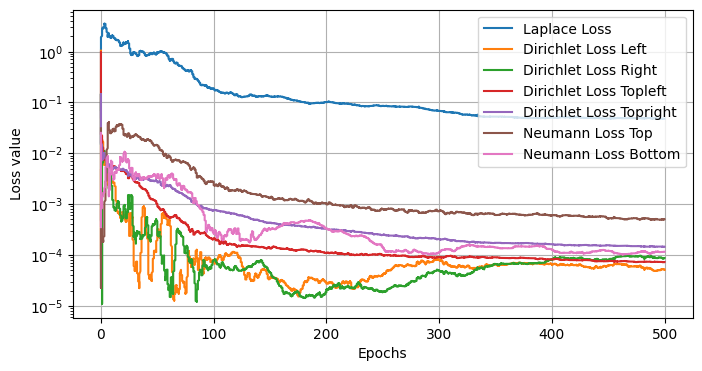

29m 9.7s

with 10000 points in the domain:

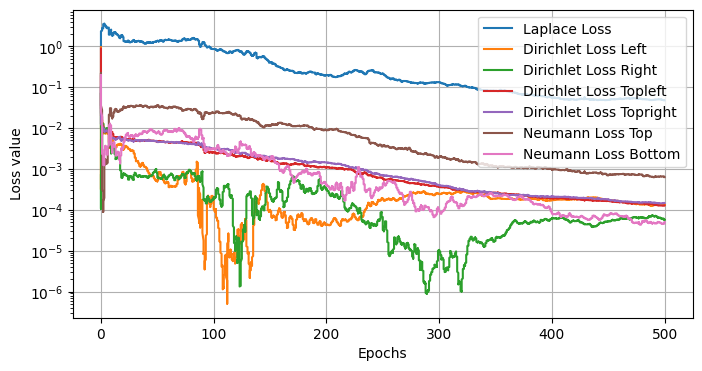

29m 27s

In [47]:
# Assume `model` is your trained instance of the `pinn` class
model_path = "#3.pth"
torch.save(model.state_dict(), model_path)
print(f"Model's state dictionary saved to {model_path}")

Model's state dictionary saved to #3.pth


# 4 Adam & LBFGS

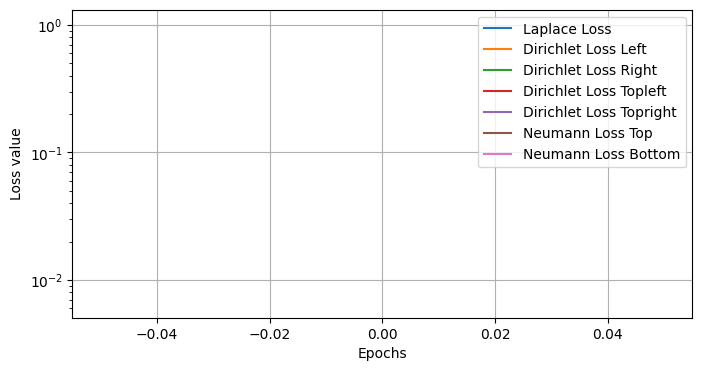

Epoch 0, Loss: 1141.5859375


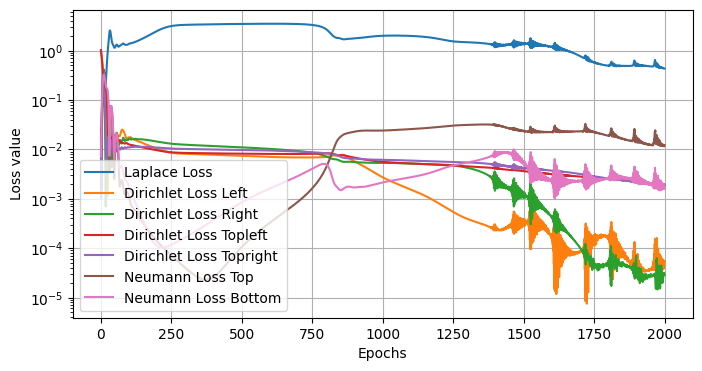

Epoch 2000, Loss: 6.029836177825928


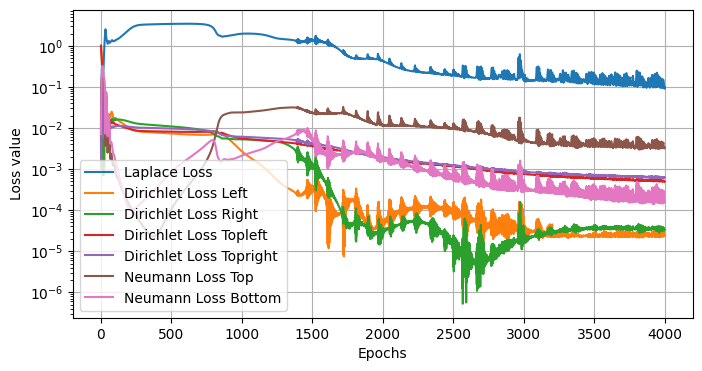

Epoch 4000, Loss: 1.67739999294281


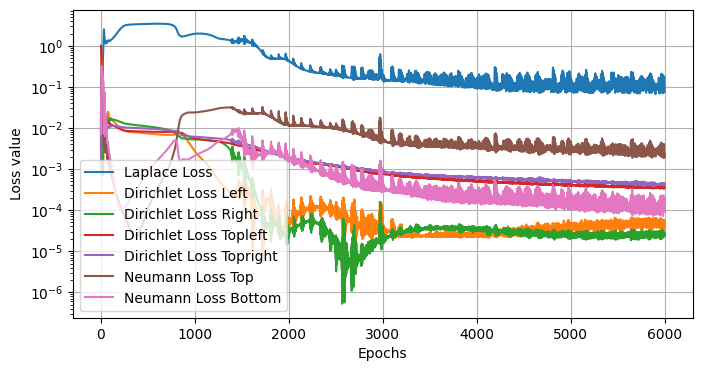

Epoch 6000, Loss: 1.1732757091522217


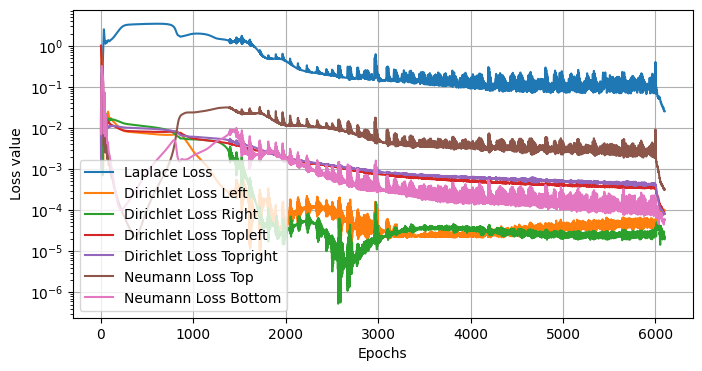

Epoch 6100, Loss: 0.2618449032306671


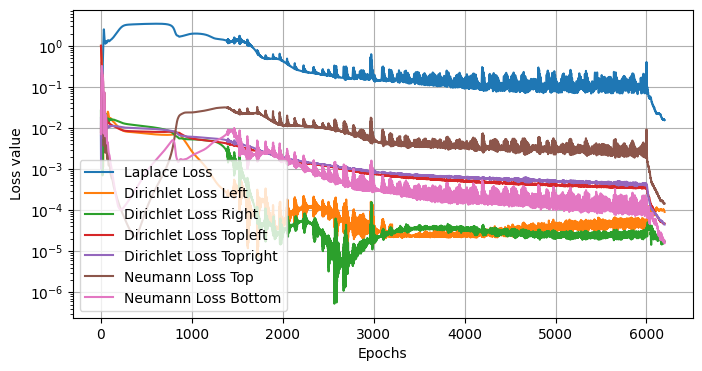

Epoch 6200, Loss: 0.14961205422878265


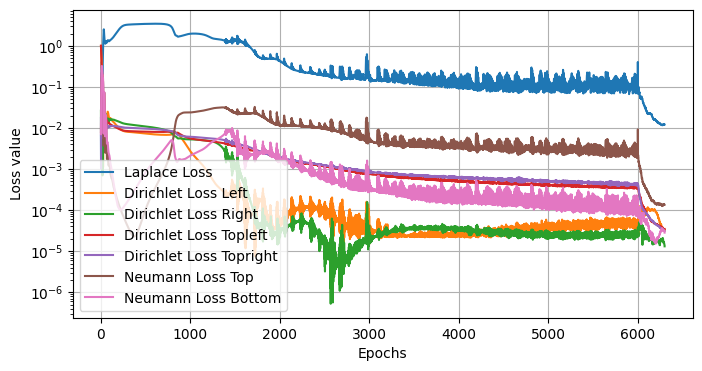

Epoch 6300, Loss: 0.1108526885509491


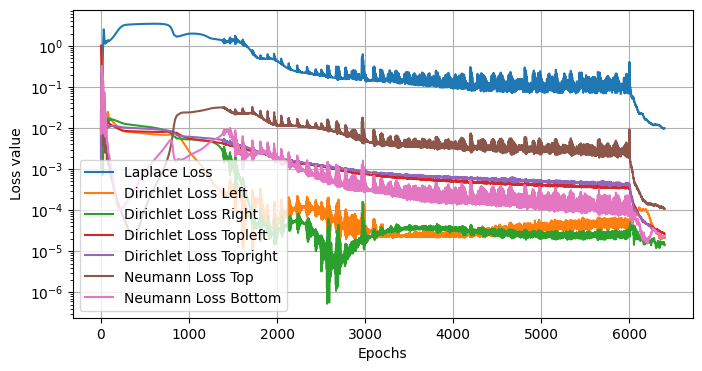

Epoch 6400, Loss: 0.08502566814422607


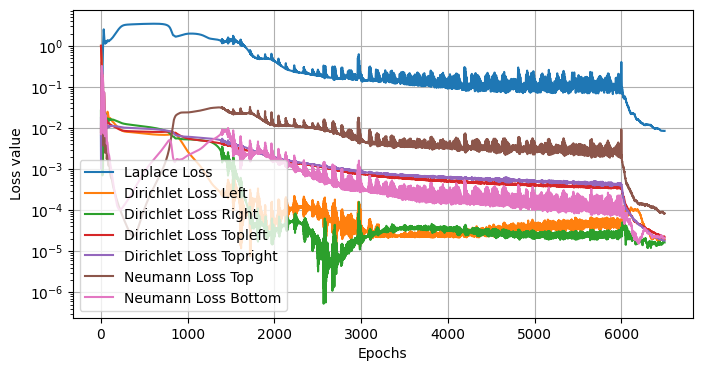

Epoch 6500, Loss: 0.07172022014856339


In [ ]:
def set_seed(seed=42):
    random.seed(seed)  # Python random module
    np.random.seed(seed)  # Numpy random module
    torch.manual_seed(seed)  # PyTorch CPU
    torch.cuda.manual_seed(seed)  # PyTorch GPU
    torch.cuda.manual_seed_all(seed)  # All GPUs (if multiple)

# Set the seed
set_seed(123)

# Define the neural network for the Physics-Informed Neural Network (PINN)
class pinn(nn.Module):
    def __init__(self, hidden_size=20, hidden_layers=3):
        super(pinn, self).__init__()
        layers = [nn.Linear(2, hidden_size), nn.Tanh()]  # Change Tanh to GeLU
        for _ in range(hidden_layers):
            layers.append(nn.Linear(hidden_size, hidden_size))
            layers.append(nn.Tanh())  # Change Tanh to GeLU
        layers.append(nn.Linear(hidden_size, 1))
        self.network = nn.Sequential(*layers)
        
    def forward(self, x):
        return self.network(x)

def laplace_residual(model, coords):
    u = model(coords)
    grads = torch.autograd.grad(u, coords, grad_outputs=torch.ones_like(u), create_graph=True)[0]
    u_xx = torch.autograd.grad(grads[:, 0], coords, grad_outputs=torch.ones_like(grads[:, 0]), create_graph=True)[0][:, 0]
    u_yy = torch.autograd.grad(grads[:, 1], coords, grad_outputs=torch.ones_like(grads[:, 1]), create_graph=True)[0][:, 1]
    return torch.mean((u_xx + u_yy) ** 2)

#Boundary conditions:
def loss_dirichlet_boundary(model,boundary_points,boundary_target):
    u_pred = model(boundary_points)
    boundary_residual= u_pred-boundary_target
    return torch.mean((boundary_residual)**2)

def loss_neumann_boundary(model,boundary_points,axis='horizontal'):
    u_pred = model(boundary_points)
    u_grad= torch.autograd.grad(u_pred,boundary_points,grad_outputs=torch.ones_like(u_pred),create_graph=True)[0] #This is the gradient of u 
    if axis=='vertical':
        u_x = u_grad[:,0] # This is the x-component of the gradient of u
        return torch.mean((u_x)**2)
    elif axis=='horizontal':
        u_y = u_grad[:,1] # This is the y-component of the gradient of u
        return torch.mean((u_y)**2)

# Function to create boundary points
def create_boundary_points(axis, place, start, end, num_points, head=None):
    line_points = torch.full((num_points, 1), place)
    place_points = start + (end - start) * torch.rand(num_points, 1)
    
    if axis == 'vertical':
        boundary_points = torch.cat([line_points, place_points], dim=1)
    elif axis == 'horizontal':
        boundary_points = torch.cat([place_points, line_points], dim=1)

    # Only return targets if head value is provided (for Dirichlet conditions)
    if head is not None:
        boundary_targets = torch.full((num_points, 1), head, dtype=torch.float)
        return boundary_points, boundary_targets
    else:
        return boundary_points

def plot_losses(epochs, losses_dict):
    plt.figure(figsize=(8, 4))
    
    for loss_name, loss_values in losses_dict.items():
        plt.plot(epochs, loss_values, label=loss_name)
    plt.gca().yaxis.set_major_locator(LogLocator(base=10.0))
    plt.gca().yaxis.set_major_formatter(FormatStrFormatter('%.1f'))

    plt.yscale('log')
    plt.xlabel("Epochs")
    plt.ylabel("Loss value")
    plt.grid()
    plt.legend()
    plt.show()


def closure():
    optimizer.zero_grad()

    # Compute individual loss terms
    loss_laplace = laplace_residual(model, train_points)
    loss_d_l = loss_dirichlet_boundary(model, boundary_points_dirichlet_left, target_points_dirichlet_left)
    loss_d_r = loss_dirichlet_boundary(model, boundary_points_dirichlet_right, target_points_dirichlet_right)
    loss_d_tl = loss_dirichlet_boundary(model, boundary_points_dirichlet_topleft, target_points_dirichlet_topleft)
    loss_d_tr = loss_dirichlet_boundary(model, boundary_points_dirichlet_topright, target_points_dirichlet_topright)
    loss_n_t = loss_neumann_boundary(model, boundary_points_neumann_top, axis='horizontal')
    loss_n_b = loss_neumann_boundary(model, boundary_points_neumann_bottom, axis='horizontal')
    
    # Combine losses using the updated weights
    loss = (
        loss_weights[0] * loss_laplace +
        loss_weights[1] * loss_d_l +
        loss_weights[2] * loss_d_r +
        loss_weights[3] * loss_d_tl +
        loss_weights[4] * loss_d_tr +
        loss_weights[5] * loss_n_t +
        loss_weights[6] * loss_n_b
    )

    loss.backward()
    
    # Record losses and weights
    laplace_losses.append(loss_laplace.item())
    dirichlet_losses_left.append(loss_d_l.item())
    dirichlet_losses_right.append(loss_d_r.item())
    dirichlet_losses_topleft.append(loss_d_tl.item())
    dirichlet_losses_topright.append(loss_d_tr.item())
    neumann_losses_top.append(loss_n_t.item())
    neumann_losses_bottom.append(loss_n_b.item())
    epochs_recorded.append(epoch)
    loss_recorded.append(loss.item())

    return loss

#_____________________________________________________________________________________________________________

#Domain size:
left, right, bottom, top = 0, 1, 0, 0.2

left_dirichlet,target_left_dirichlet = create_boundary_points('vertical', left, 0, top, 1000, 1)  # Left boundary
boundary_points_dirichlet_left=torch.cat([left_dirichlet],dim=0).requires_grad_(True)  # Concatenate Dirichlet boundary points
target_points_dirichlet_left=torch.cat([target_left_dirichlet],dim=0).requires_grad_(True) # Concatenate Dirichlet boundary targets

right_dirichlet, target_right_dirichlet = create_boundary_points('vertical', right, 0, top, 1000, 0) # Right boundary
boundary_points_dirichlet_right=torch.cat([right_dirichlet],dim=0).requires_grad_(True) # Concatenate Dirichlet boundary points
target_points_dirichlet_right=torch.cat([target_right_dirichlet],dim=0).requires_grad_(True) # Concatenate Dirichlet boundary targets

topleft_dirichlet, target_topleft_dirichlet= create_boundary_points('horizontal', top, 0, 0.3*right, 3000, 1)
boundary_points_dirichlet_topleft=torch.cat([topleft_dirichlet],dim=0).requires_grad_(True)
target_points_dirichlet_topleft=torch.cat([target_topleft_dirichlet],dim=0).requires_grad_(True)

topright_dirichlet,target_topright_dirichlet = create_boundary_points('horizontal', top, 0.7*right, 1*right, 3000, 0)
boundary_points_dirichlet_topright=torch.cat([topright_dirichlet],dim=0).requires_grad_(True)
target_points_dirichlet_topright=torch.cat([target_topright_dirichlet],dim=0).requires_grad_(True)

top_neumann=create_boundary_points('horizontal', top, 0.3*right, 0.7*right, 3000)
boundary_points_neumann_top=torch.cat([top_neumann],dim=0).requires_grad_(True)

bottom_neumann=create_boundary_points('horizontal', bottom, 0, right, 1000)
boundary_points_neumann_bottom=torch.cat([bottom_neumann],dim=0).requires_grad_(True)


# Creating domain points
num_domain_points=6501
x_points = torch.rand(num_domain_points,1) 
x = (x_points*right).requires_grad_(True)
y_points = torch.rand(num_domain_points,1)
y=(y_points*top).requires_grad_(True)
train_points=torch.cat([x,y],dim=1) 

# Initialize lists to store losses and plot
laplace_losses = []
dirichlet_losses_left = []
dirichlet_losses_right = []
dirichlet_losses_topleft = []
dirichlet_losses_topright = []
neumann_losses_top = []
neumann_losses_bottom = []
epochs_recorded = []
loss_recorded = []


#Defining hyperparameters:
model=pinn(hidden_size=20, hidden_layers=8) 

epochs=6501

# Initialize the loss weights
lambda_laplace, y_d_l, y_d_r, y_d_tl, y_d_tr, y_n_t, y_n_b = 2,100,100,1000,1000,100,100
loss_weights = (torch.tensor([lambda_laplace, y_d_l, y_d_r, y_d_tl, y_d_tr, y_n_t, y_n_b], 
                            dtype=torch.float, requires_grad=False))

adam_optimizer = torch.optim.Adam(model.parameters(), lr=0.001)
lbfgs_optimizer = torch.optim.LBFGS(model.parameters(), lr=0.1, max_iter=20)

# Initialize the weights and biases of the model
def initialize_weights(m):
    if isinstance(m, nn.Linear):
        nn.init.xavier_normal_(m.weight)  # Use Xavier initialization
        nn.init.zeros_(m.bias)  # Initialize biases to zero
# Apply weight initialization
model.apply(initialize_weights)


#Training loop:
for epoch in range(epochs):
    optimizer = adam_optimizer if epoch < 6001 else lbfgs_optimizer
    optimizer.step(closure) # Update the weights and biases of the model

    # Logging

    if epoch % 2000 == 0 and epoch <= 6000:
        losses_dict = {
            "Laplace Loss": laplace_losses,
            "Dirichlet Loss Left": dirichlet_losses_left,
            "Dirichlet Loss Right": dirichlet_losses_right,
            "Dirichlet Loss Topleft": dirichlet_losses_topleft,
            "Dirichlet Loss Topright": dirichlet_losses_topright,
            "Neumann Loss Top": neumann_losses_top,
            "Neumann Loss Bottom": neumann_losses_bottom
        }

        plot_losses(epochs_recorded, losses_dict)
        print(f"Epoch {epoch}, Loss: {loss_recorded[-1]}")
    
    if epoch % 100 == 0 and epoch > 6000:
        losses_dict = {
            "Laplace Loss": laplace_losses,
            "Dirichlet Loss Left": dirichlet_losses_left,
            "Dirichlet Loss Right": dirichlet_losses_right,
            "Dirichlet Loss Topleft": dirichlet_losses_topleft,
            "Dirichlet Loss Topright": dirichlet_losses_topright,
            "Neumann Loss Top": neumann_losses_top,
            "Neumann Loss Bottom": neumann_losses_bottom
        }

        plot_losses(epochs_recorded, losses_dict)
        print(f"Epoch {epoch}, Loss: {loss_recorded[-1]}")

In [43]:
# Assume `model` is your trained instance of the `pinn` class
model_path = "#4.pth"
torch.save(model.state_dict(), model_path)
print(f"Model's state dictionary saved to {model_path}")

Model's state dictionary saved to #4.pth


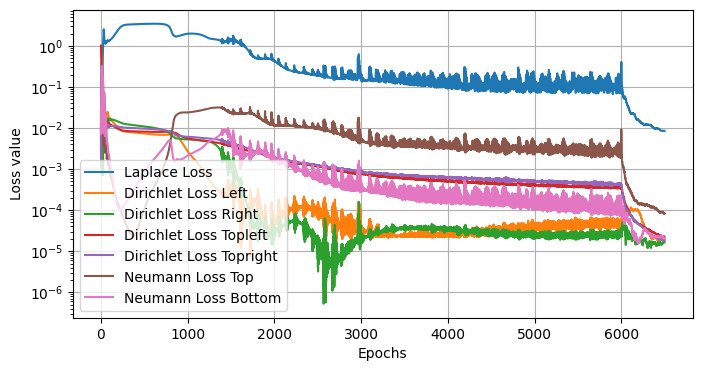

31m 20s

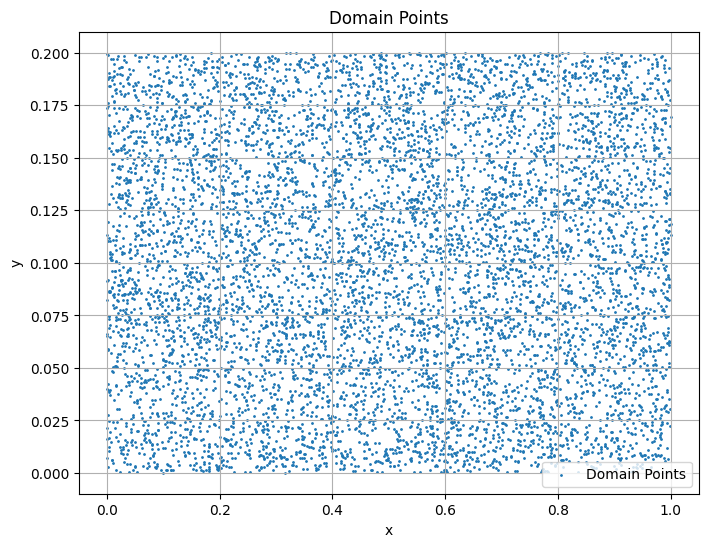

In [111]:
plt.figure(figsize=(8, 6))
plt.scatter(train_points[:, 0].detach().numpy(), train_points[:, 1].detach().numpy(), s=1, label='Domain Points')
plt.xlabel('x')
plt.ylabel('y')
plt.title('Domain Points')
plt.legend()
plt.grid(True)
plt.show()

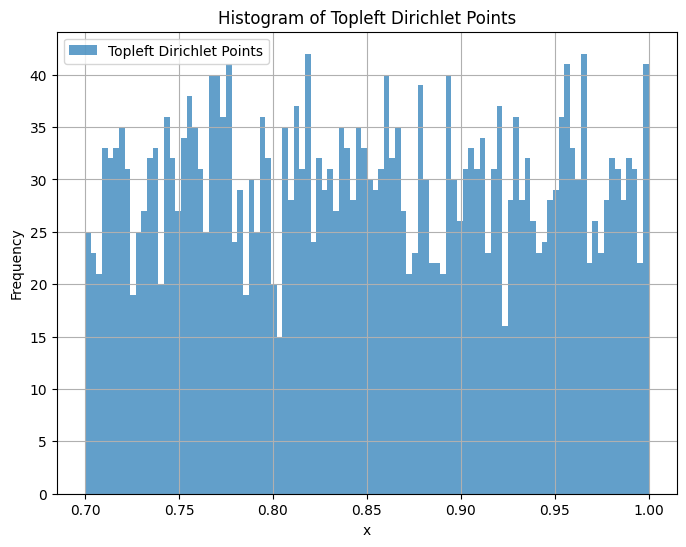

In [112]:
plt.figure(figsize=(8, 6))
plt.hist(topright_dirichlet[:, 0].detach().numpy(), bins=100, alpha=0.7, label='Topleft Dirichlet Points')
plt.xlabel('x')
plt.ylabel('Frequency')
plt.title('Histogram of Topleft Dirichlet Points')
plt.legend()
plt.grid(True)
plt.show()

# 5 
**Adaptive loss_weights**

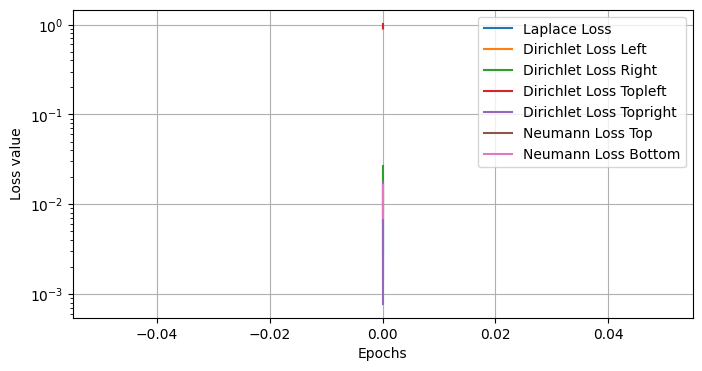

Epoch 0, Loss: 1.845473051071167
Loss Weights: tensor([2.0000, 2.0000, 2.0000, 2.0000, 2.0000, 2.0000, 2.0000],
       requires_grad=True)


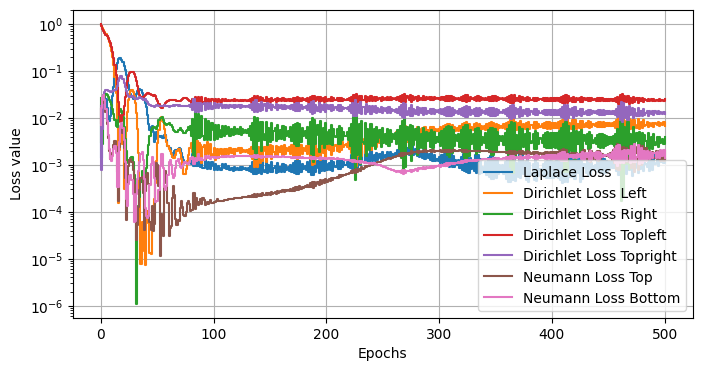

Epoch 500, Loss: 9.479493141174316
Loss Weights: tensor([ 60.1915,  40.6933, 300.9825, 120.8156, 354.5141, 204.6575, 192.4036],
       requires_grad=True)


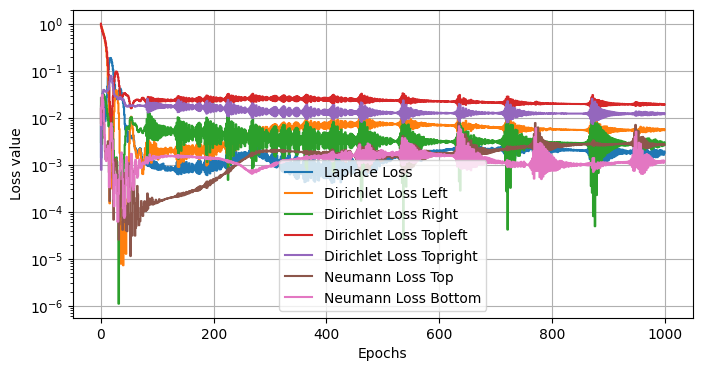

Epoch 1000, Loss: 19.769620895385742
Loss Weights: tensor([129.1233,  91.6846, 619.2458, 285.5948, 748.3155, 707.0166, 493.7437],
       requires_grad=True)


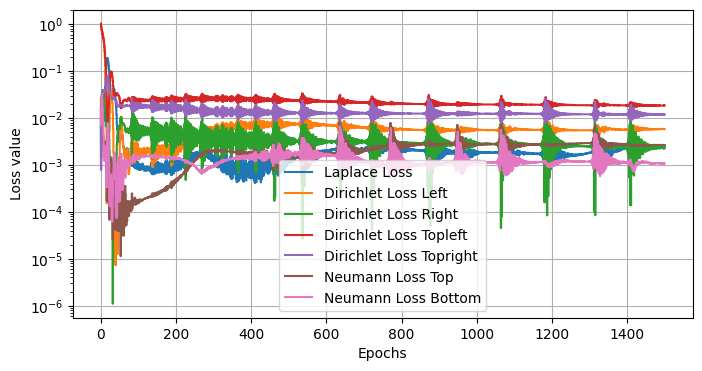

Epoch 1500, Loss: 31.04669761657715
Loss Weights: tensor([ 228.8081,  161.4218,  955.5901,  495.7181, 1178.7618, 1240.0959,
         826.0706], requires_grad=True)


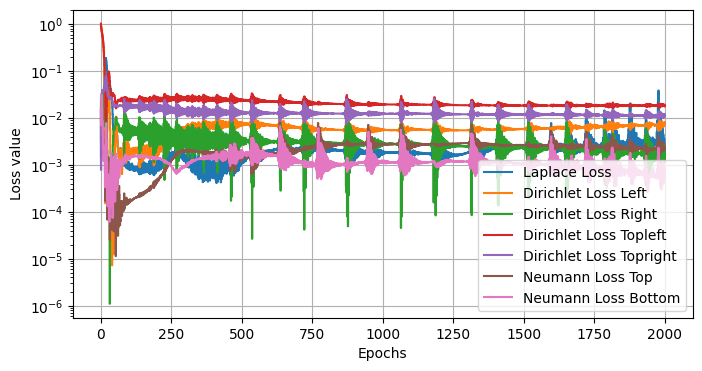

Epoch 2000, Loss: 41.729129791259766
Loss Weights: tensor([ 452.7188,  271.9827, 1266.4728,  758.0225, 1619.5201, 1709.1433,
        1122.5356], requires_grad=True)


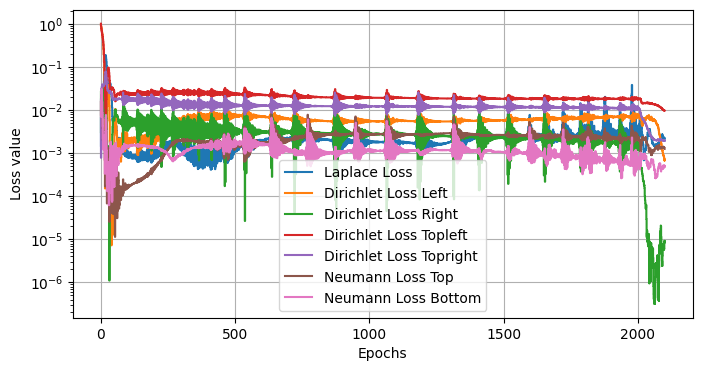

Epoch 2100, Loss: 15.009108543395996
Loss Weights: tensor([ 486.8231,  294.2012, 1277.7198,  804.9689, 1657.0990, 1772.3446,
        1166.8320], requires_grad=True)


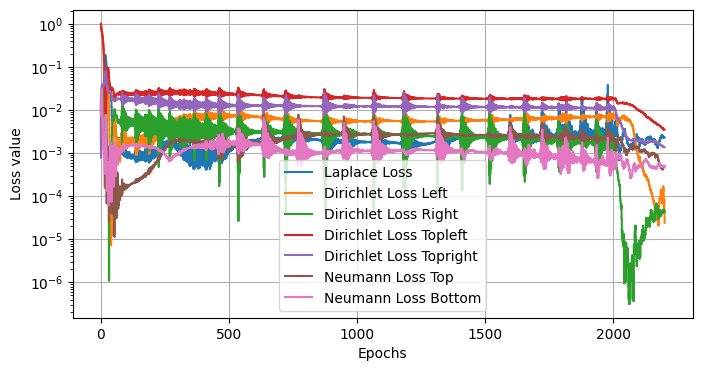

Epoch 2200, Loss: 7.932534217834473
Loss Weights: tensor([ 515.9471,  295.5988, 1278.6602,  827.6318, 1672.3271, 1811.2922,
        1207.8743], requires_grad=True)


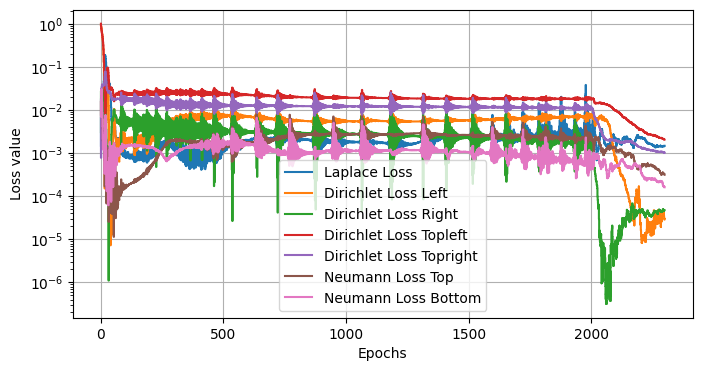

Epoch 2300, Loss: 5.14481782913208
Loss Weights: tensor([ 542.9084,  295.7231, 1280.1628,  837.7521, 1683.0459, 1831.9630,
        1230.2798], requires_grad=True)


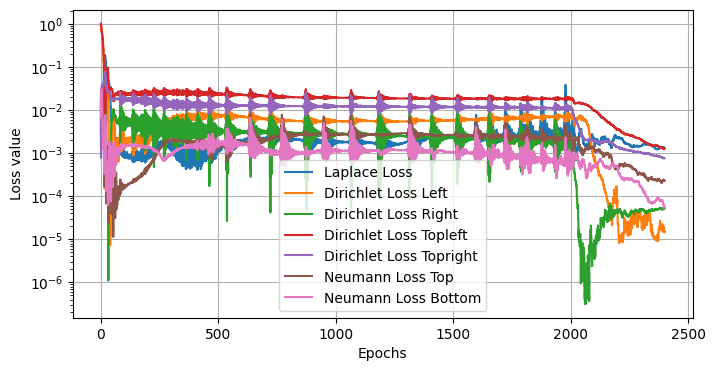

Epoch 2400, Loss: 3.685053825378418
Loss Weights: tensor([ 566.4918,  295.8281, 1281.9683,  843.9506, 1691.7473, 1844.1851,
        1238.7784], requires_grad=True)


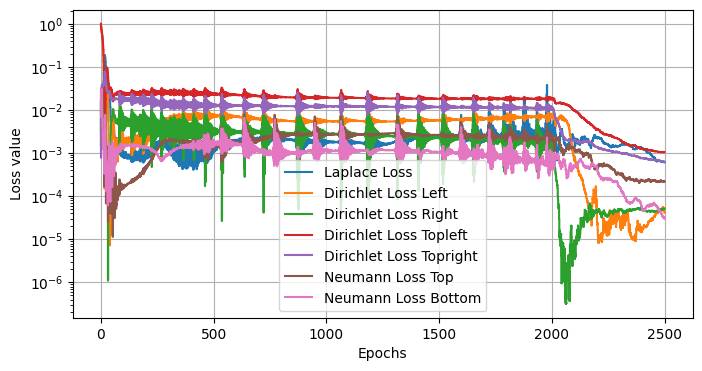

Epoch 2500, Loss: 2.8552637100219727
Loss Weights: tensor([ 582.1147,  295.9854, 1283.8436,  848.5898, 1698.8342, 1855.1732,
        1243.7999], requires_grad=True)


In [69]:
def set_seed(seed=42):
    random.seed(seed)  # Python random module
    np.random.seed(seed)  # Numpy random module
    torch.manual_seed(seed)  # PyTorch CPU
    torch.cuda.manual_seed(seed)  # PyTorch GPU
    torch.cuda.manual_seed_all(seed)  # All GPUs (if multiple)

# Set the seed
set_seed(123)

# Define the neural network for the Physics-Informed Neural Network (PINN)
class pinn(nn.Module):
    def __init__(self, hidden_size=20, hidden_layers=3):
        super(pinn, self).__init__()
        layers = [nn.Linear(2, hidden_size), nn.Tanh()]  # Change Tanh to GeLU
        for _ in range(hidden_layers):
            layers.append(nn.Linear(hidden_size, hidden_size))
            layers.append(nn.Tanh())  # Change Tanh to GeLU
        layers.append(nn.Linear(hidden_size, 1))
        self.network = nn.Sequential(*layers)
        
    def forward(self, x):
        return self.network(x)

def laplace_residual(model, coords):
    u = model(coords)
    grads = torch.autograd.grad(u, coords, grad_outputs=torch.ones_like(u), create_graph=True)[0]
    u_xx = torch.autograd.grad(grads[:, 0], coords, grad_outputs=torch.ones_like(grads[:, 0]), create_graph=True)[0][:, 0]
    u_yy = torch.autograd.grad(grads[:, 1], coords, grad_outputs=torch.ones_like(grads[:, 1]), create_graph=True)[0][:, 1]
    return torch.mean((u_xx + u_yy) ** 2)

#Boundary conditions:
def loss_dirichlet_boundary(model,boundary_points,boundary_target):
    u_pred = model(boundary_points)
    boundary_residual= u_pred-boundary_target
    return torch.mean((boundary_residual)**2)

def loss_neumann_boundary(model,boundary_points,axis='horizontal'):
    u_pred = model(boundary_points)
    u_grad= torch.autograd.grad(u_pred,boundary_points,grad_outputs=torch.ones_like(u_pred),create_graph=True)[0] #This is the gradient of u 
    if axis=='vertical':
        u_x = u_grad[:,0] # This is the x-component of the gradient of u
        return torch.mean((u_x)**2)
    elif axis=='horizontal':
        u_y = u_grad[:,1] # This is the y-component of the gradient of u
        return torch.mean((u_y)**2)

# Function to create boundary points
def create_boundary_points(axis, place, start, end, num_points, head=None):
    line_points = torch.full((num_points, 1), place)
    place_points = start + (end - start) * torch.rand(num_points, 1)
    
    if axis == 'vertical':
        boundary_points = torch.cat([line_points, place_points], dim=1)
    elif axis == 'horizontal':
        boundary_points = torch.cat([place_points, line_points], dim=1)

    # Only return targets if head value is provided (for Dirichlet conditions)
    if head is not None:
        boundary_targets = torch.full((num_points, 1), head, dtype=torch.float)
        return boundary_points, boundary_targets
    else:
        return boundary_points

def plot_losses(epochs, losses_dict):
    plt.figure(figsize=(8, 4))
    
    for loss_name, loss_values in losses_dict.items():
        plt.plot(epochs, loss_values, label=loss_name)
    plt.gca().yaxis.set_major_locator(LogLocator(base=10.0))
    plt.gca().yaxis.set_major_formatter(FormatStrFormatter('%.1f'))

    plt.yscale('log')
    plt.xlabel("Epochs")
    plt.ylabel("Loss value")
    plt.grid()
    plt.legend()
    plt.show()


def closure():
    
    # Compute individual loss terms
    loss_laplace = laplace_residual(model, train_points)
    loss_d_l = loss_dirichlet_boundary(model, boundary_points_dirichlet_left, target_points_dirichlet_left)
    loss_d_r = loss_dirichlet_boundary(model, boundary_points_dirichlet_right, target_points_dirichlet_right)
    loss_d_tl = loss_dirichlet_boundary(model, boundary_points_dirichlet_topleft, target_points_dirichlet_topleft)
    loss_d_tr = loss_dirichlet_boundary(model, boundary_points_dirichlet_topright, target_points_dirichlet_topright)
    loss_n_t = loss_neumann_boundary(model, boundary_points_neumann_top, axis='horizontal')
    loss_n_b = loss_neumann_boundary(model, boundary_points_neumann_bottom, axis='horizontal')
    
    # Combine losses using the updated weights
    loss = (
        loss_weights[0] * loss_laplace +
        loss_weights[1] * loss_d_l +
        loss_weights[2] * loss_d_r +
        loss_weights[3] * loss_d_tl +
        loss_weights[4] * loss_d_tr +
        loss_weights[5] * loss_n_t +
        loss_weights[6] * loss_n_b
    )
    
    # Record losses and weights
    laplace_losses.append(loss_laplace.item())
    dirichlet_losses_left.append(loss_d_l.item())
    dirichlet_losses_right.append(loss_d_r.item())
    dirichlet_losses_topleft.append(loss_d_tl.item())
    dirichlet_losses_topright.append(loss_d_tr.item())
    neumann_losses_top.append(loss_n_t.item())
    neumann_losses_bottom.append(loss_n_b.item())
    epochs_recorded.append(epoch)
    loss_recorded.append(loss.item())

    return loss

def closure_loss_weights():
    loss_weights_optimizer.zero_grad()  # Clear gradients for loss_weights
    # Reverse the gradient for maximization by negating the loss
    loss = -closure()  # Negate the loss to maximize
    loss.backward()  # Compute the gradients
    return loss

def closure_model():
    optimizer.zero_grad()  # Clear gradients for model
    loss = closure()  # Calculate loss
    loss.backward()  # Retain the graph for reuse
    return loss

#_____________________________________________________________________________________________________________

#Domain size:
left, right, bottom, top = 0, 1, 0, 0.2

left_dirichlet,target_left_dirichlet = create_boundary_points('vertical', left, 0, top, 1000, 1)  # Left boundary
boundary_points_dirichlet_left=torch.cat([left_dirichlet],dim=0).requires_grad_(True)  # Concatenate Dirichlet boundary points
target_points_dirichlet_left=torch.cat([target_left_dirichlet],dim=0).requires_grad_(True) # Concatenate Dirichlet boundary targets

right_dirichlet, target_right_dirichlet = create_boundary_points('vertical', right, 0, top, 1000, 0) # Right boundary
boundary_points_dirichlet_right=torch.cat([right_dirichlet],dim=0).requires_grad_(True) # Concatenate Dirichlet boundary points
target_points_dirichlet_right=torch.cat([target_right_dirichlet],dim=0).requires_grad_(True) # Concatenate Dirichlet boundary targets

topleft_dirichlet, target_topleft_dirichlet= create_boundary_points('horizontal', top, 0, 0.3*right, 3000, 1)
boundary_points_dirichlet_topleft=torch.cat([topleft_dirichlet],dim=0).requires_grad_(True)
target_points_dirichlet_topleft=torch.cat([target_topleft_dirichlet],dim=0).requires_grad_(True)

topright_dirichlet,target_topright_dirichlet = create_boundary_points('horizontal', top, 0.7*right, 1*right, 3000, 0)
boundary_points_dirichlet_topright=torch.cat([topright_dirichlet],dim=0).requires_grad_(True)
target_points_dirichlet_topright=torch.cat([target_topright_dirichlet],dim=0).requires_grad_(True)

top_neumann=create_boundary_points('horizontal', top, 0.3*right, 0.7*right, 3000)
boundary_points_neumann_top=torch.cat([top_neumann],dim=0).requires_grad_(True)

bottom_neumann=create_boundary_points('horizontal', bottom, 0, right, 1000)
boundary_points_neumann_bottom=torch.cat([bottom_neumann],dim=0).requires_grad_(True)


# Creating domain points
num_domain_points=6501
x_points = torch.rand(num_domain_points,1) 
x = (x_points*right).requires_grad_(True)
y_points = torch.rand(num_domain_points,1)
y=(y_points*top).requires_grad_(True)
train_points=torch.cat([x,y],dim=1) 

# Initialize lists to store losses and plot
laplace_losses = []
dirichlet_losses_left = []
dirichlet_losses_right = []
dirichlet_losses_topleft = []
dirichlet_losses_topright = []
neumann_losses_top = []
neumann_losses_bottom = []
epochs_recorded = []
loss_recorded = []


#Defining hyperparameters:
model=pinn(hidden_size=20, hidden_layers=8) 

epochs=2501

# Initialize the loss weights
lambda_laplace, y_d_l, y_d_r, y_d_tl, y_d_tr, y_n_t, y_n_b = 1,1,1,1,1,1,1
loss_weights = (torch.tensor([lambda_laplace, y_d_l, y_d_r, y_d_tl, y_d_tr, y_n_t, y_n_b], 
                            dtype=torch.float, requires_grad=True))

adam_optimizer = torch.optim.Adam(model.parameters(), lr=0.001)
lbfgs_optimizer = torch.optim.LBFGS(model.parameters(), lr=0.1, max_iter=20)
loss_weights_optimizer = torch.optim.Adam([loss_weights], lr=1)  # Smaller learning rate for stability

# Initialize the weights and biases of the model
def initialize_weights(m):
    if isinstance(m, nn.Linear):
        nn.init.xavier_normal_(m.weight)  # Use Xavier initialization
        nn.init.zeros_(m.bias)  # Initialize biases to zero
# Apply weight initialization
model.apply(initialize_weights)

#Training loop:
for epoch in range(epochs):
    optimizer = adam_optimizer if epoch < 2000 else lbfgs_optimizer

    optimizer.step(closure_model) # Update the weights and biases of the model
    loss_weights_optimizer.step(closure_loss_weights)

    # Logging

    if epoch % 500 == 0 and epoch <= 2000:
        losses_dict = {
            "Laplace Loss": laplace_losses,
            "Dirichlet Loss Left": dirichlet_losses_left,
            "Dirichlet Loss Right": dirichlet_losses_right,
            "Dirichlet Loss Topleft": dirichlet_losses_topleft,
            "Dirichlet Loss Topright": dirichlet_losses_topright,
            "Neumann Loss Top": neumann_losses_top,
            "Neumann Loss Bottom": neumann_losses_bottom
        }

        plot_losses(epochs_recorded, losses_dict)
        print(f"Epoch {epoch}, Loss: {loss_recorded[-1]}")
        print(f"Loss Weights: {loss_weights}")
    
    if epoch % 100 == 0 and epoch > 2000:
        losses_dict = {
            "Laplace Loss": laplace_losses,
            "Dirichlet Loss Left": dirichlet_losses_left,
            "Dirichlet Loss Right": dirichlet_losses_right,
            "Dirichlet Loss Topleft": dirichlet_losses_topleft,
            "Dirichlet Loss Topright": dirichlet_losses_topright,
            "Neumann Loss Top": neumann_losses_top,
            "Neumann Loss Bottom": neumann_losses_bottom
        }

        plot_losses(epochs_recorded, losses_dict)
        print(f"Epoch {epoch}, Loss: {loss_recorded[-1]}")
        print(f"Loss Weights: {loss_weights}")

In [70]:
# Assume `model` is your trained instance of the `pinn` class
model_path = "#5.pth"
torch.save(model.state_dict(), model_path)
print(f"Model's state dictionary saved to {model_path}")

Model's state dictionary saved to #5.pth


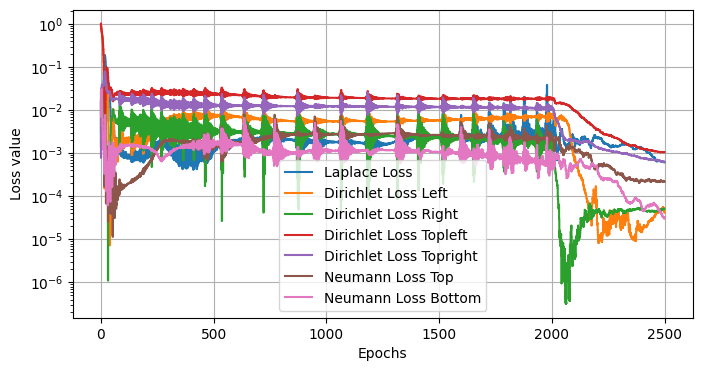

29m 52s

Epoch 2500, Loss: 2.8552637100219727
Loss Weights: tensor([ 582.1147,  295.9854, 1283.8436,  848.5898, 1698.8342, 1855.1732,
        1243.7999], requires_grad=True)

## 5.1

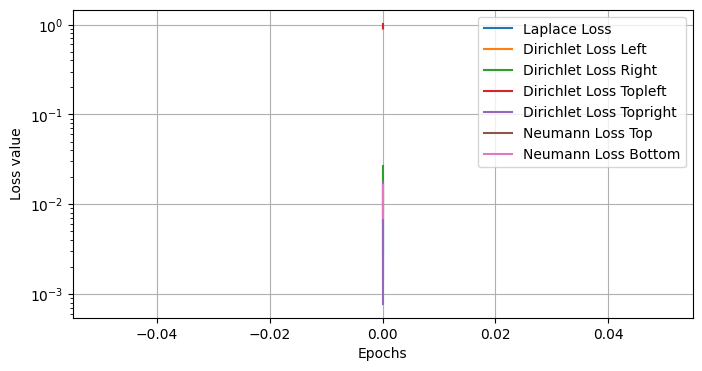

Epoch 0, Loss: 0.26363900303840637
Loss Weights: tensor([1.1429, 1.1429, 1.1429, 1.1429, 1.1428, 1.1429, 1.1429],
       requires_grad=True)


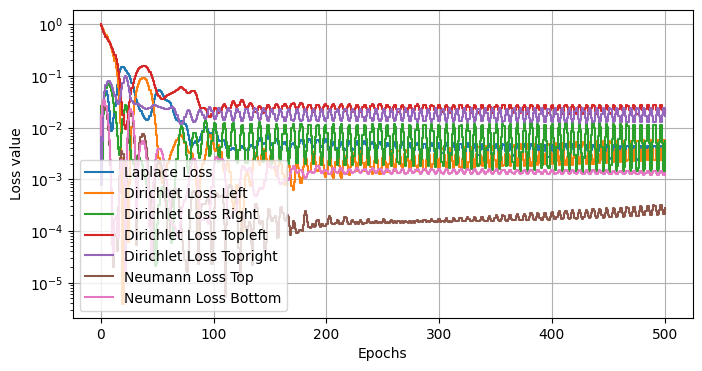

Epoch 500, Loss: 0.03362886235117912
Loss Weights: tensor([0.3916, 0.1187, 1.4827, 0.6306, 1.9239, 0.2195, 0.9329],
       requires_grad=True)


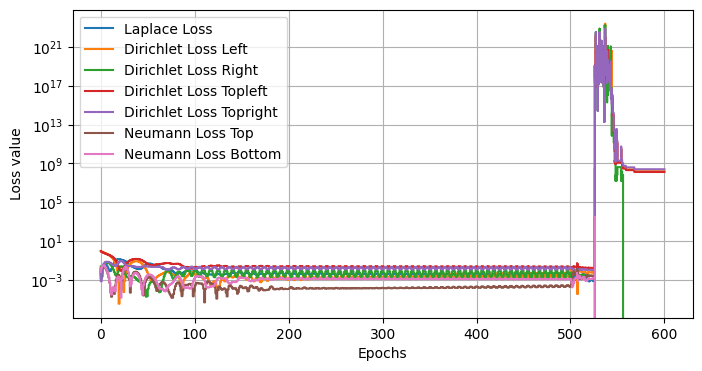

Epoch 600, Loss: 9173766144.0
Loss Weights: tensor([ 5.0705, 12.1081, 14.9153, 16.5210, 20.0278, 28.3930, 15.6333],
       requires_grad=True)


KeyboardInterrupt: 

In [ ]:
def set_seed(seed=42):
    random.seed(seed)  # Python random module
    np.random.seed(seed)  # Numpy random module
    torch.manual_seed(seed)  # PyTorch CPU
    torch.cuda.manual_seed(seed)  # PyTorch GPU
    torch.cuda.manual_seed_all(seed)  # All GPUs (if multiple)

# Set the seed
set_seed(123)

# Define the neural network for the Physics-Informed Neural Network (PINN)
class pinn(nn.Module):
    def __init__(self, hidden_size=20, hidden_layers=3):
        super(pinn, self).__init__()
        layers = [nn.Linear(2, hidden_size), nn.Tanh()]  # Change Tanh to GeLU
        for _ in range(hidden_layers):
            layers.append(nn.Linear(hidden_size, hidden_size))
            layers.append(nn.Tanh())  # Change Tanh to GeLU
        layers.append(nn.Linear(hidden_size, 1))
        self.network = nn.Sequential(*layers)
        
    def forward(self, x):
        return self.network(x)

def laplace_residual(model, coords):
    u = model(coords)
    grads = torch.autograd.grad(u, coords, grad_outputs=torch.ones_like(u), create_graph=True)[0]
    u_xx = torch.autograd.grad(grads[:, 0], coords, grad_outputs=torch.ones_like(grads[:, 0]), create_graph=True)[0][:, 0]
    u_yy = torch.autograd.grad(grads[:, 1], coords, grad_outputs=torch.ones_like(grads[:, 1]), create_graph=True)[0][:, 1]
    return torch.mean((u_xx + u_yy) ** 2)

#Boundary conditions:
def loss_dirichlet_boundary(model,boundary_points,boundary_target):
    u_pred = model(boundary_points)
    boundary_residual= u_pred-boundary_target
    return torch.mean((boundary_residual)**2)

def loss_neumann_boundary(model,boundary_points,axis='horizontal'):
    u_pred = model(boundary_points)
    u_grad= torch.autograd.grad(u_pred,boundary_points,grad_outputs=torch.ones_like(u_pred),create_graph=True)[0] #This is the gradient of u 
    if axis=='vertical':
        u_x = u_grad[:,0] # This is the x-component of the gradient of u
        return torch.mean((u_x)**2)
    elif axis=='horizontal':
        u_y = u_grad[:,1] # This is the y-component of the gradient of u
        return torch.mean((u_y)**2)

# Function to create boundary points
def create_boundary_points(axis, place, start, end, num_points, head=None):
    line_points = torch.full((num_points, 1), place)
    place_points = start + (end - start) * torch.rand(num_points, 1)
    
    if axis == 'vertical':
        boundary_points = torch.cat([line_points, place_points], dim=1)
    elif axis == 'horizontal':
        boundary_points = torch.cat([place_points, line_points], dim=1)

    # Only return targets if head value is provided (for Dirichlet conditions)
    if head is not None:
        boundary_targets = torch.full((num_points, 1), head, dtype=torch.float)
        return boundary_points, boundary_targets
    else:
        return boundary_points

def plot_losses(epochs, losses_dict):
    plt.figure(figsize=(8, 4))
    
    for loss_name, loss_values in losses_dict.items():
        plt.plot(epochs, loss_values, label=loss_name)
    plt.gca().yaxis.set_major_locator(LogLocator(base=10.0))
    plt.gca().yaxis.set_major_formatter(FormatStrFormatter('%.1f'))

    plt.yscale('log')
    plt.xlabel("Epochs")
    plt.ylabel("Loss value")
    plt.grid()
    plt.legend()
    plt.show()


def closure():
    
    # Compute individual loss terms
    loss_laplace = laplace_residual(model, train_points)
    loss_d_l = loss_dirichlet_boundary(model, boundary_points_dirichlet_left, target_points_dirichlet_left)
    loss_d_r = loss_dirichlet_boundary(model, boundary_points_dirichlet_right, target_points_dirichlet_right)
    loss_d_tl = loss_dirichlet_boundary(model, boundary_points_dirichlet_topleft, target_points_dirichlet_topleft)
    loss_d_tr = loss_dirichlet_boundary(model, boundary_points_dirichlet_topright, target_points_dirichlet_topright)
    loss_n_t = loss_neumann_boundary(model, boundary_points_neumann_top, axis='horizontal')
    loss_n_b = loss_neumann_boundary(model, boundary_points_neumann_bottom, axis='horizontal')
    
    # Combine losses using the updated weights
    loss = (
        loss_weights[0] * loss_laplace +
        loss_weights[1] * loss_d_l +
        loss_weights[2] * loss_d_r +
        loss_weights[3] * loss_d_tl +
        loss_weights[4] * loss_d_tr +
        loss_weights[5] * loss_n_t +
        loss_weights[6] * loss_n_b
    )
    
    # Record losses and weights
    laplace_losses.append(loss_laplace.item())
    dirichlet_losses_left.append(loss_d_l.item())
    dirichlet_losses_right.append(loss_d_r.item())
    dirichlet_losses_topleft.append(loss_d_tl.item())
    dirichlet_losses_topright.append(loss_d_tr.item())
    neumann_losses_top.append(loss_n_t.item())
    neumann_losses_bottom.append(loss_n_b.item())
    epochs_recorded.append(epoch)
    loss_recorded.append(loss.item())

    return loss

#_____________________________________________________________________________________________________________

#Domain size:
left, right, bottom, top = 0, 1, 0, 0.2

left_dirichlet,target_left_dirichlet = create_boundary_points('vertical', left, 0, top, 1000, 1)  # Left boundary
boundary_points_dirichlet_left=torch.cat([left_dirichlet],dim=0).requires_grad_(True)  # Concatenate Dirichlet boundary points
target_points_dirichlet_left=torch.cat([target_left_dirichlet],dim=0).requires_grad_(True) # Concatenate Dirichlet boundary targets

right_dirichlet, target_right_dirichlet = create_boundary_points('vertical', right, 0, top, 1000, 0) # Right boundary
boundary_points_dirichlet_right=torch.cat([right_dirichlet],dim=0).requires_grad_(True) # Concatenate Dirichlet boundary points
target_points_dirichlet_right=torch.cat([target_right_dirichlet],dim=0).requires_grad_(True) # Concatenate Dirichlet boundary targets

topleft_dirichlet, target_topleft_dirichlet= create_boundary_points('horizontal', top, 0, 0.3*right, 3000, 1)
boundary_points_dirichlet_topleft=torch.cat([topleft_dirichlet],dim=0).requires_grad_(True)
target_points_dirichlet_topleft=torch.cat([target_topleft_dirichlet],dim=0).requires_grad_(True)

topright_dirichlet,target_topright_dirichlet = create_boundary_points('horizontal', top, 0.7*right, 1*right, 3000, 0)
boundary_points_dirichlet_topright=torch.cat([topright_dirichlet],dim=0).requires_grad_(True)
target_points_dirichlet_topright=torch.cat([target_topright_dirichlet],dim=0).requires_grad_(True)

top_neumann=create_boundary_points('horizontal', top, 0.3*right, 0.7*right, 3000)
boundary_points_neumann_top=torch.cat([top_neumann],dim=0).requires_grad_(True)

bottom_neumann=create_boundary_points('horizontal', bottom, 0, right, 1000)
boundary_points_neumann_bottom=torch.cat([bottom_neumann],dim=0).requires_grad_(True)


# Creating domain points
num_domain_points=6501
x_points = torch.rand(num_domain_points,1) 
x = (x_points*right).requires_grad_(True)
y_points = torch.rand(num_domain_points,1)
y=(y_points*top).requires_grad_(True)
train_points=torch.cat([x,y],dim=1) 

# Initialize lists to store losses and plot
laplace_losses = []
dirichlet_losses_left = []
dirichlet_losses_right = []
dirichlet_losses_topleft = []
dirichlet_losses_topright = []
neumann_losses_top = []
neumann_losses_bottom = []
epochs_recorded = []
loss_recorded = []


#Defining hyperparameters:
model=pinn(hidden_size=20, hidden_layers=8) 

epochs=1001

# Initialize the loss weights
lambda_laplace, y_d_l, y_d_r, y_d_tl, y_d_tr, y_n_t, y_n_b = 1,1,1,1,1,1,1
loss_weights = (torch.tensor([lambda_laplace, y_d_l, y_d_r, y_d_tl, y_d_tr, y_n_t, y_n_b], 
                            dtype=torch.float, requires_grad=True))

adam_optimizer = torch.optim.Adam(model.parameters(), lr=0.001)
lbfgs_optimizer = torch.optim.LBFGS(model.parameters(), lr=0.1, max_iter=20)
loss_weights_optimizer = torch.optim.Adam([loss_weights], lr=1)  # Smaller learning rate for stability

# Initialize the weights and biases of the model
def initialize_weights(m):
    if isinstance(m, nn.Linear):
        nn.init.xavier_normal_(m.weight)  # Use Xavier initialization
        nn.init.zeros_(m.bias)  # Initialize biases to zero
# Apply weight initialization
model.apply(initialize_weights)

#Training loop:
for epoch in range(epochs):
    optimizer = adam_optimizer if epoch < 500 else lbfgs_optimizer

    # Use the shared_closure to compute the loss
    def closure_model():
        optimizer.zero_grad()  # Clear gradients for model parameters
        loss = closure()  # Compute the loss
        loss.backward()  # Compute gradients for the model parameters
        return loss  # Return the loss for LBFGS or Adam
    
    # Step with optimizer
    optimizer.step(closure_model)  # Pass the closure function to step()

    # Update loss weights
    loss_weights_optimizer.zero_grad()  # Clear gradients for loss_weights
    if optimizer == adam_optimizer:
        with torch.no_grad():
            loss_weights /= loss_weights.sum()
    (-closure()).backward()  # Compute gradients for loss_weights
    loss_weights_optimizer.step()  # Update loss weights

    # Logging

    if epoch % 500 == 0 and epoch <= 500:
        losses_dict = {
            "Laplace Loss": laplace_losses,
            "Dirichlet Loss Left": dirichlet_losses_left,
            "Dirichlet Loss Right": dirichlet_losses_right,
            "Dirichlet Loss Topleft": dirichlet_losses_topleft,
            "Dirichlet Loss Topright": dirichlet_losses_topright,
            "Neumann Loss Top": neumann_losses_top,
            "Neumann Loss Bottom": neumann_losses_bottom
        }

        plot_losses(epochs_recorded, losses_dict)
        print(f"Epoch {epoch}, Loss: {loss_recorded[-1]}")
        print(f"Loss Weights: {loss_weights}")
    
    if epoch % 100 == 0 and epoch > 500:
        losses_dict = {
            "Laplace Loss": laplace_losses,
            "Dirichlet Loss Left": dirichlet_losses_left,
            "Dirichlet Loss Right": dirichlet_losses_right,
            "Dirichlet Loss Topleft": dirichlet_losses_topleft,
            "Dirichlet Loss Topright": dirichlet_losses_topright,
            "Neumann Loss Top": neumann_losses_top,
            "Neumann Loss Bottom": neumann_losses_bottom
        }

        plot_losses(epochs_recorded, losses_dict)
        print(f"Epoch {epoch}, Loss: {loss_recorded[-1]}")
        print(f"Loss Weights: {loss_weights}")

When switching to lbfgs after weights look like this:

Loss Weights: tensor([0.3916, 0.1187, 1.4827, 0.6306, 1.9239, 0.2195, 0.9329])

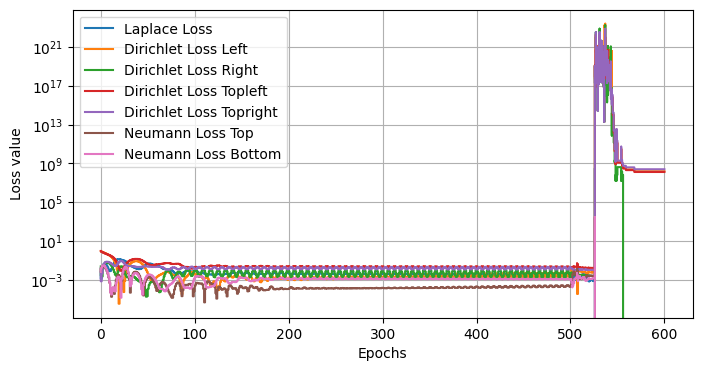

# 7 adding points where large errors

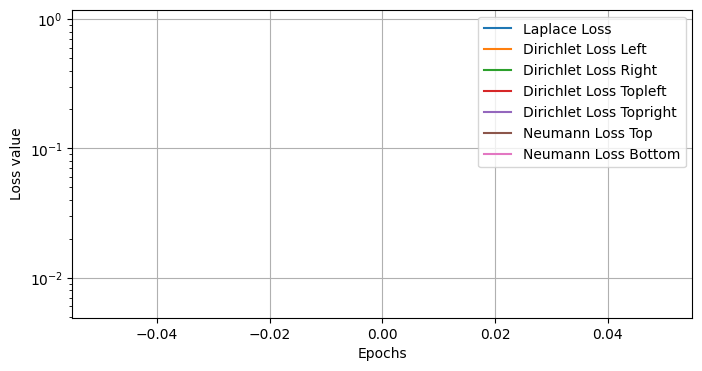

Epoch 0, Loss: 1034.0804443359375


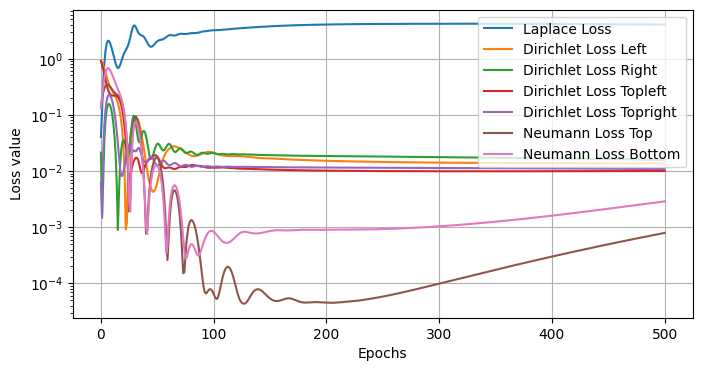

Epoch 500, Loss: 32.15236282348633


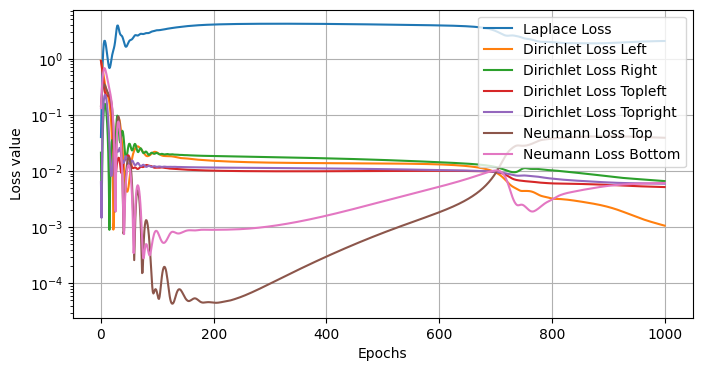

Epoch 1000, Loss: 20.498865127563477


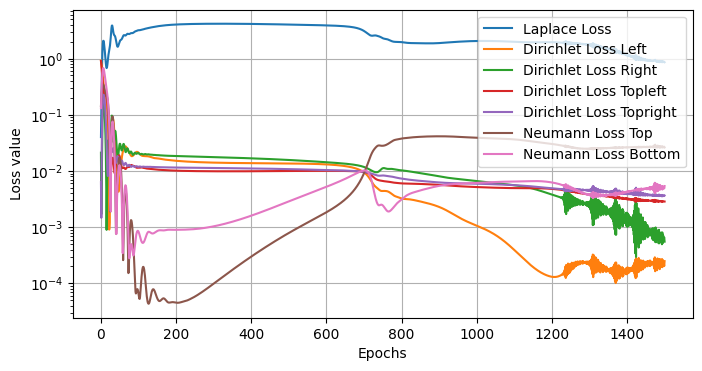

Epoch 1500, Loss: 11.488035202026367


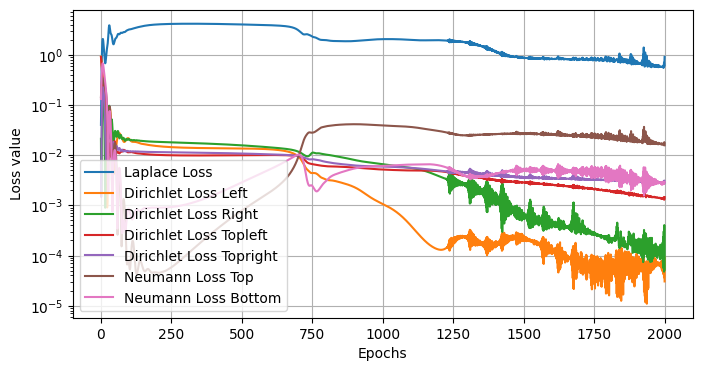

Epoch 2000, Loss: 7.984593391418457


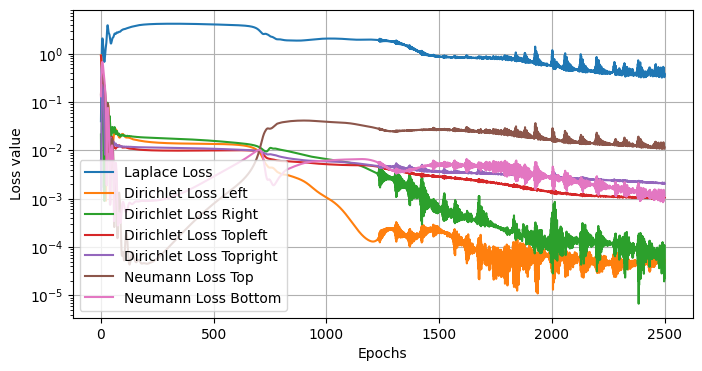

Epoch 2500, Loss: 5.1063313484191895


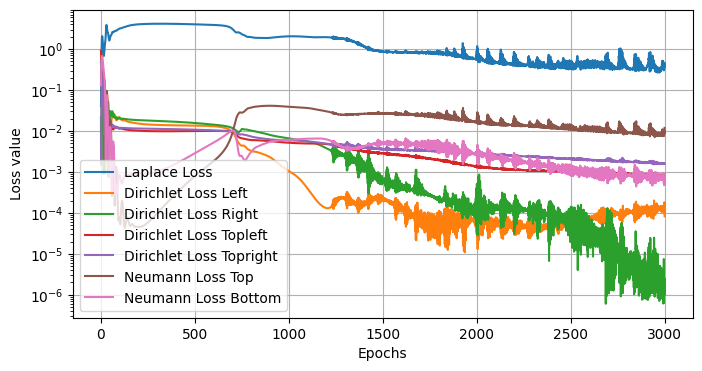

Epoch 3000, Loss: 4.462674140930176


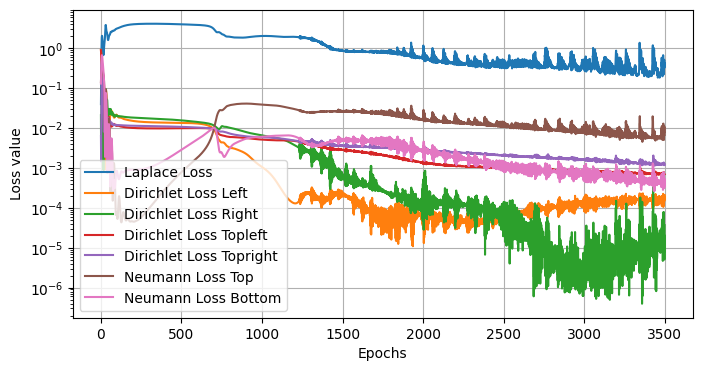

Epoch 3500, Loss: 3.494377374649048


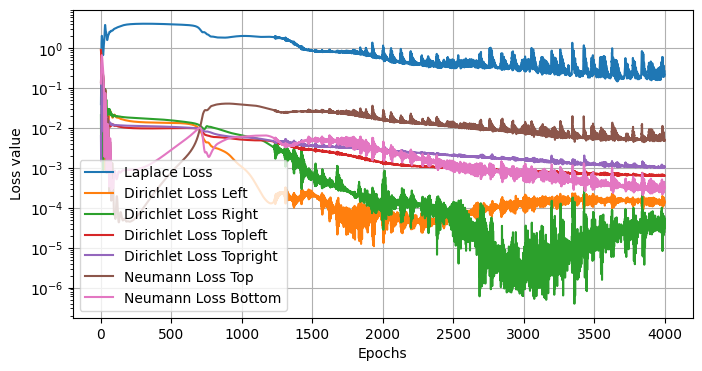

Epoch 4000, Loss: 2.8058788776397705


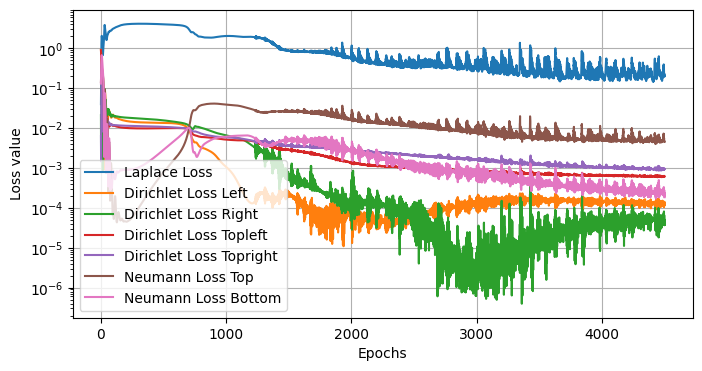

Epoch 4500, Loss: 2.4605093002319336


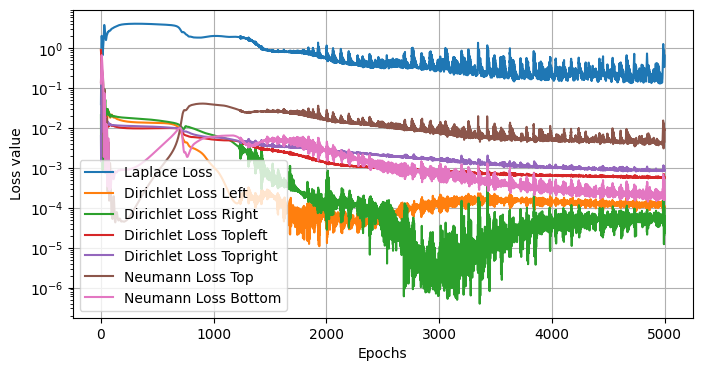

Epoch 5000, Loss: 3.7061359882354736


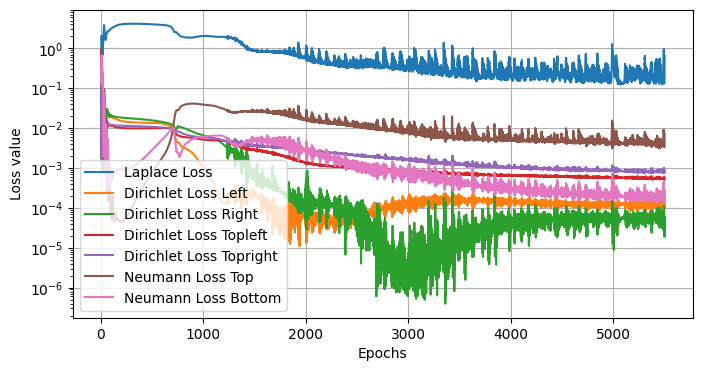

Epoch 5500, Loss: 3.3504128456115723


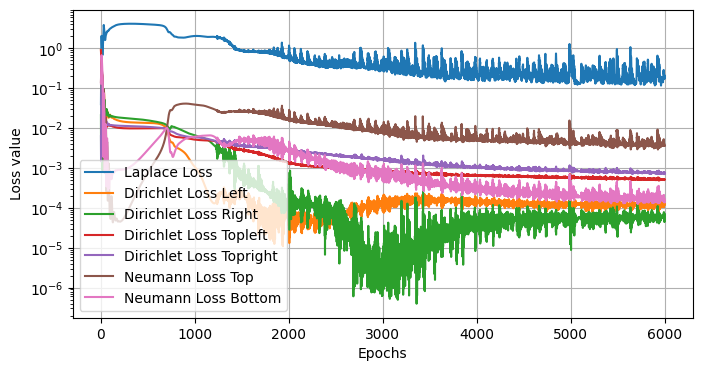

Epoch 6000, Loss: 2.0204458236694336


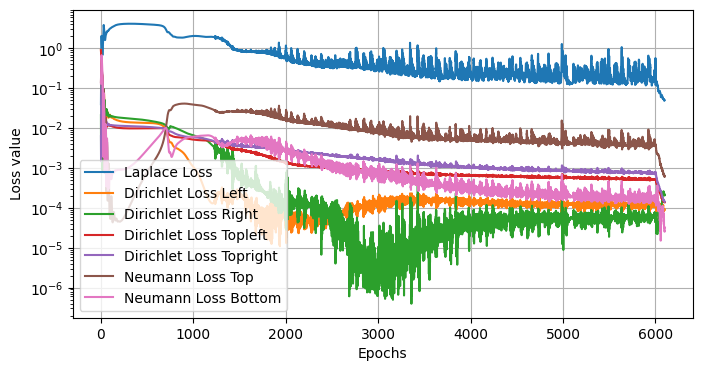

Epoch 6100, Loss: 0.4753974974155426


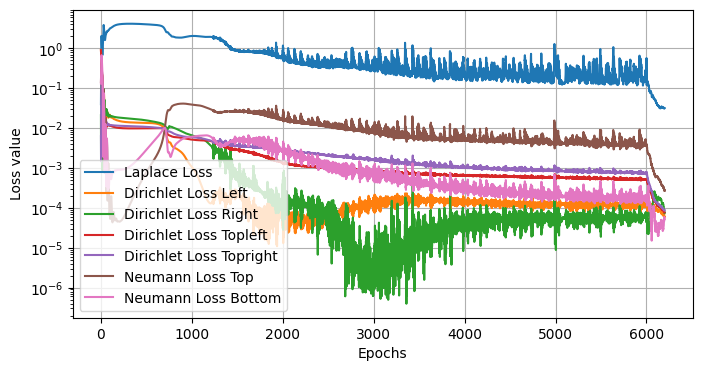

Epoch 6200, Loss: 0.2731475234031677


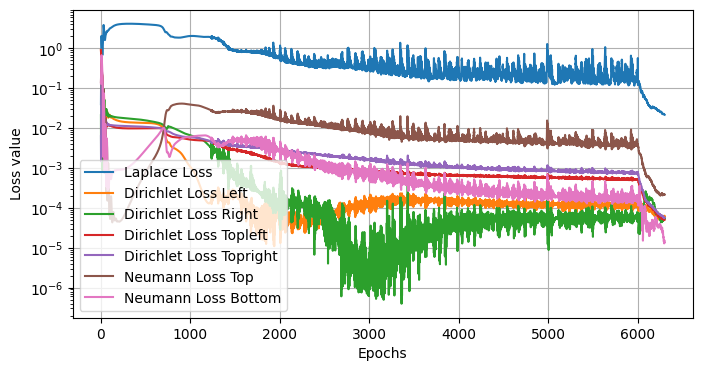

Epoch 6300, Loss: 0.1839662492275238


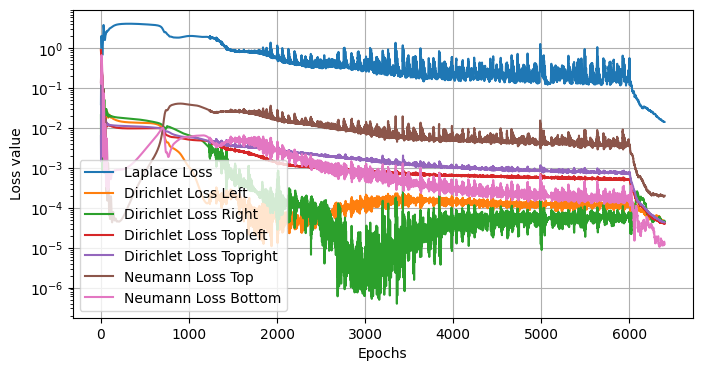

Epoch 6400, Loss: 0.14273931086063385


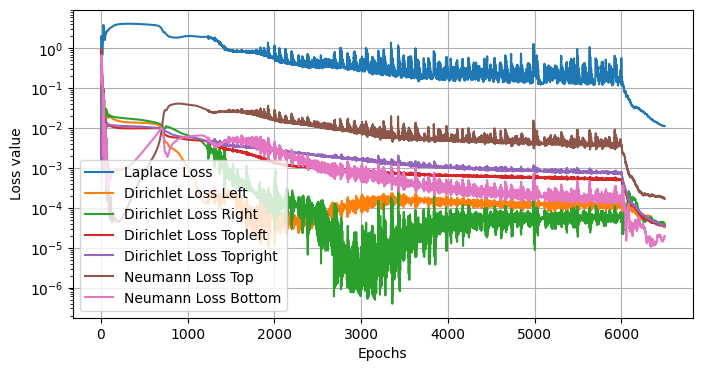

Epoch 6500, Loss: 0.12013794481754303


In [84]:
def set_seed(seed=42):
    random.seed(seed)  # Python random module
    np.random.seed(seed)  # Numpy random module
    torch.manual_seed(seed)  # PyTorch CPU
    torch.cuda.manual_seed(seed)  # PyTorch GPU
    torch.cuda.manual_seed_all(seed)  # All GPUs (if multiple)

# Set the seed
set_seed(123)

# Define the neural network for the Physics-Informed Neural Network (PINN)
class pinn(nn.Module):
    def __init__(self, hidden_size=20, hidden_layers=3):
        super(pinn, self).__init__()
        layers = [nn.Linear(2, hidden_size), nn.Tanh()]  # Change Tanh to GeLU
        for _ in range(hidden_layers):
            layers.append(nn.Linear(hidden_size, hidden_size))
            layers.append(nn.Tanh())  # Change Tanh to GeLU
        layers.append(nn.Linear(hidden_size, 1))
        self.network = nn.Sequential(*layers)
        
    def forward(self, x):
        return self.network(x)

def laplace_residual(model, coords):
    u = model(coords)
    grads = torch.autograd.grad(u, coords, grad_outputs=torch.ones_like(u), create_graph=True)[0]
    u_xx = torch.autograd.grad(grads[:, 0], coords, grad_outputs=torch.ones_like(grads[:, 0]), create_graph=True)[0][:, 0]
    u_yy = torch.autograd.grad(grads[:, 1], coords, grad_outputs=torch.ones_like(grads[:, 1]), create_graph=True)[0][:, 1]
    return torch.mean((u_xx + u_yy) ** 2)

#Boundary conditions:
def loss_dirichlet_boundary(model,boundary_points,boundary_target):
    u_pred = model(boundary_points)
    boundary_residual= u_pred-boundary_target
    return torch.mean((boundary_residual)**2)

def loss_neumann_boundary(model,boundary_points,axis='horizontal'):
    u_pred = model(boundary_points)
    u_grad= torch.autograd.grad(u_pred,boundary_points,grad_outputs=torch.ones_like(u_pred),create_graph=True)[0] #This is the gradient of u 
    if axis=='vertical':
        u_x = u_grad[:,0] # This is the x-component of the gradient of u
        return torch.mean((u_x)**2)
    elif axis=='horizontal':
        u_y = u_grad[:,1] # This is the y-component of the gradient of u
        return torch.mean((u_y)**2)

# Function to create boundary points
def create_boundary_points(axis, place, start, end, num_points, head=None):
    line_points = torch.full((num_points, 1), place)
    place_points = start + (end - start) * torch.rand(num_points, 1)
    
    if axis == 'vertical':
        boundary_points = torch.cat([line_points, place_points], dim=1)
    elif axis == 'horizontal':
        boundary_points = torch.cat([place_points, line_points], dim=1)

    # Only return targets if head value is provided (for Dirichlet conditions)
    if head is not None:
        boundary_targets = torch.full((num_points, 1), head, dtype=torch.float)
        return boundary_points, boundary_targets
    else:
        return boundary_points

def plot_losses(epochs, losses_dict):
    plt.figure(figsize=(8, 4))
    
    for loss_name, loss_values in losses_dict.items():
        plt.plot(epochs, loss_values, label=loss_name)
    plt.gca().yaxis.set_major_locator(LogLocator(base=10.0))
    plt.gca().yaxis.set_major_formatter(FormatStrFormatter('%.1f'))

    plt.yscale('log')
    plt.xlabel("Epochs")
    plt.ylabel("Loss value")
    plt.grid()
    plt.legend()
    plt.show()


def closure():
    optimizer.zero_grad()

    # Compute individual loss terms
    loss_laplace = laplace_residual(model, train_points)
    loss_d_l = loss_dirichlet_boundary(model, boundary_points_dirichlet_left, target_points_dirichlet_left)
    loss_d_r = loss_dirichlet_boundary(model, boundary_points_dirichlet_right, target_points_dirichlet_right)
    loss_d_tl = loss_dirichlet_boundary(model, boundary_points_dirichlet_topleft, target_points_dirichlet_topleft)
    loss_d_tr = loss_dirichlet_boundary(model, boundary_points_dirichlet_topright, target_points_dirichlet_topright)
    loss_n_t = loss_neumann_boundary(model, boundary_points_neumann_top, axis='horizontal')
    loss_n_b = loss_neumann_boundary(model, boundary_points_neumann_bottom, axis='horizontal')
    
    # Combine losses using the updated weights
    loss = (
        loss_weights[0] * loss_laplace +
        loss_weights[1] * loss_d_l +
        loss_weights[2] * loss_d_r +
        loss_weights[3] * loss_d_tl +
        loss_weights[4] * loss_d_tr +
        loss_weights[5] * loss_n_t +
        loss_weights[6] * loss_n_b
    )

    loss.backward()
    
    # Record losses and weights
    laplace_losses.append(loss_laplace.item())
    dirichlet_losses_left.append(loss_d_l.item())
    dirichlet_losses_right.append(loss_d_r.item())
    dirichlet_losses_topleft.append(loss_d_tl.item())
    dirichlet_losses_topright.append(loss_d_tr.item())
    neumann_losses_top.append(loss_n_t.item())
    neumann_losses_bottom.append(loss_n_b.item())
    epochs_recorded.append(epoch)
    loss_recorded.append(loss.item())

    return loss

#_____________________________________________________________________________________________________________

#Domain size:
left, right, bottom, top = 0, 1, 0, 0.2

left_dirichlet,target_left_dirichlet = create_boundary_points('vertical', left, 0, top, 1000, 1)  # Left boundary
boundary_points_dirichlet_left=torch.cat([left_dirichlet],dim=0).requires_grad_(True)  # Concatenate Dirichlet boundary points
target_points_dirichlet_left=torch.cat([target_left_dirichlet],dim=0).requires_grad_(True) # Concatenate Dirichlet boundary targets

right_dirichlet, target_right_dirichlet = create_boundary_points('vertical', right, 0, top, 1000, 0) # Right boundary
boundary_points_dirichlet_right=torch.cat([right_dirichlet],dim=0).requires_grad_(True) # Concatenate Dirichlet boundary points
target_points_dirichlet_right=torch.cat([target_right_dirichlet],dim=0).requires_grad_(True) # Concatenate Dirichlet boundary targets

topleft_dirichlet, target_topleft_dirichlet= create_boundary_points('horizontal', top, 0, 0.3*right, 2000, 1)
boundary_points_dirichlet_topleft=torch.cat([topleft_dirichlet],dim=0).requires_grad_(True)
target_points_dirichlet_topleft=torch.cat([target_topleft_dirichlet],dim=0).requires_grad_(True)

#Extra points to topleft boundary
topleft_dirichlet_extra, target_topleft_dirichlet_extra= create_boundary_points('horizontal', top, 0.2*right, 0.3*right, 1000, 1)
boundary_points_dirichlet_topleft_extra=torch.cat([topleft_dirichlet_extra],dim=0).requires_grad_(True) 
target_points_dirichlet_topleft_extra=torch.cat([target_topleft_dirichlet_extra],dim=0).requires_grad_(True)

boundary_points_dirichlet_topleft = torch.cat([boundary_points_dirichlet_topleft, boundary_points_dirichlet_topleft_extra], dim=0).requires_grad_(True)
target_points_dirichlet_topleft = torch.cat([target_points_dirichlet_topleft, target_topleft_dirichlet_extra], dim=0).requires_grad_(True)


topright_dirichlet,target_topright_dirichlet = create_boundary_points('horizontal', top, 0.7*right, 1*right, 2000, 0)
boundary_points_dirichlet_topright=torch.cat([topright_dirichlet],dim=0).requires_grad_(True)
target_points_dirichlet_topright=torch.cat([target_topright_dirichlet],dim=0).requires_grad_(True)

#Extra points to topright boundary
topright_dirichlet_extra, target_topright_dirichlet_extra= create_boundary_points('horizontal', top, 0.7*right, 0.8*right, 1000, 0)
boundary_points_dirichlet_topright_extra=torch.cat([topright_dirichlet_extra],dim=0).requires_grad_(True)
target_points_dirichlet_topright_extra=torch.cat([target_topright_dirichlet_extra],dim=0).requires_grad_(True)

boundary_points_dirichlet_topright = torch.cat([boundary_points_dirichlet_topright, boundary_points_dirichlet_topright_extra], dim=0).requires_grad_(True)
target_points_dirichlet_topright = torch.cat([target_points_dirichlet_topright, target_topright_dirichlet_extra], dim=0).requires_grad_(True)

top_neumann=create_boundary_points('horizontal', top, 0.3*right, 0.7*right, 3000)
boundary_points_neumann_top=torch.cat([top_neumann],dim=0).requires_grad_(True)

bottom_neumann=create_boundary_points('horizontal', bottom, 0, right, 1000)
boundary_points_neumann_bottom=torch.cat([bottom_neumann],dim=0).requires_grad_(True)


# Creating domain points
num_domain_points=4000
x_points = torch.rand(num_domain_points,1) 
x = (x_points*right).requires_grad_(True)
y_points = torch.rand(num_domain_points,1)
y=(y_points*top).requires_grad_(True)
train_points=torch.cat([x,y],dim=1) 

#add points where the PINN has trouble predicting the solution
num_domain_points=2500
x_points = torch.rand(num_domain_points, 1)  # Random values in [0, 1]
x = (0.2 * right + x_points * (0.8 - 0.2) * right).requires_grad_(True)
y_points = torch.rand(num_domain_points, 1)  # Random values in [0, 1]
y = (0.7 * top + y_points * (1 - 0.7) * top).requires_grad_(True)
train_points = torch.cat([train_points, torch.cat([x, y], dim=1)], dim=0)


# Initialize lists to store losses and plot
laplace_losses = []
dirichlet_losses_left = []
dirichlet_losses_right = []
dirichlet_losses_topleft = []
dirichlet_losses_topright = []
neumann_losses_top = []
neumann_losses_bottom = []
epochs_recorded = []
loss_recorded = []


#Defining hyperparameters:
model=pinn(hidden_size=20, hidden_layers=8) 

epochs=6501

# Initialize the loss weights
lambda_laplace, y_d_l, y_d_r, y_d_tl, y_d_tr, y_n_t, y_n_b = 2,100,100,1000,1000,100,100
loss_weights = (torch.tensor([lambda_laplace, y_d_l, y_d_r, y_d_tl, y_d_tr, y_n_t, y_n_b], 
                            dtype=torch.float, requires_grad=False))

adam_optimizer = torch.optim.Adam(model.parameters(), lr=0.001)
lbfgs_optimizer = torch.optim.LBFGS(model.parameters(), lr=0.1, max_iter=20)

# Initialize the weights and biases of the model
def initialize_weights(m):
    if isinstance(m, nn.Linear):
        nn.init.xavier_normal_(m.weight)  # Use Xavier initialization
        nn.init.zeros_(m.bias)  # Initialize biases to zero
# Apply weight initialization
model.apply(initialize_weights)


#Training loop:
for epoch in range(epochs):
    optimizer = adam_optimizer if epoch < 6001 else lbfgs_optimizer
    optimizer.step(closure) # Update the weights and biases of the model

    # Logging

    if epoch % 500 == 0 and epoch <= 6000:
        losses_dict = {
            "Laplace Loss": laplace_losses,
            "Dirichlet Loss Left": dirichlet_losses_left,
            "Dirichlet Loss Right": dirichlet_losses_right,
            "Dirichlet Loss Topleft": dirichlet_losses_topleft,
            "Dirichlet Loss Topright": dirichlet_losses_topright,
            "Neumann Loss Top": neumann_losses_top,
            "Neumann Loss Bottom": neumann_losses_bottom
        }

        plot_losses(epochs_recorded, losses_dict)
        print(f"Epoch {epoch}, Loss: {loss_recorded[-1]}")
    
    if epoch % 100 == 0 and epoch > 6000:
        losses_dict = {
            "Laplace Loss": laplace_losses,
            "Dirichlet Loss Left": dirichlet_losses_left,
            "Dirichlet Loss Right": dirichlet_losses_right,
            "Dirichlet Loss Topleft": dirichlet_losses_topleft,
            "Dirichlet Loss Topright": dirichlet_losses_topright,
            "Neumann Loss Top": neumann_losses_top,
            "Neumann Loss Bottom": neumann_losses_bottom
        }

        plot_losses(epochs_recorded, losses_dict)
        print(f"Epoch {epoch}, Loss: {loss_recorded[-1]}")

In [85]:
# Assume `model` is your trained instance of the `pinn` class
model_path = "#7.pth"
torch.save(model.state_dict(), model_path)
print(f"Model's state dictionary saved to {model_path}")

Model's state dictionary saved to #7.pth


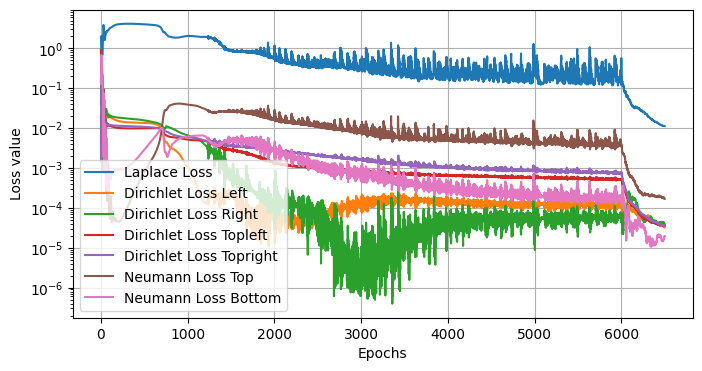

# 8 Gradient enhanced PINNs, (gPINN)

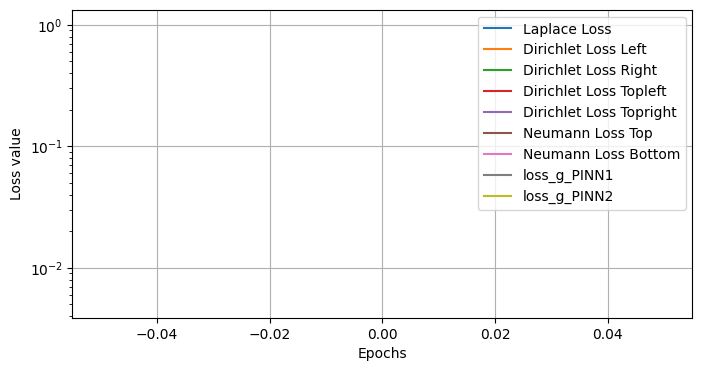

Epoch 0, Loss: 1141.6119384765625


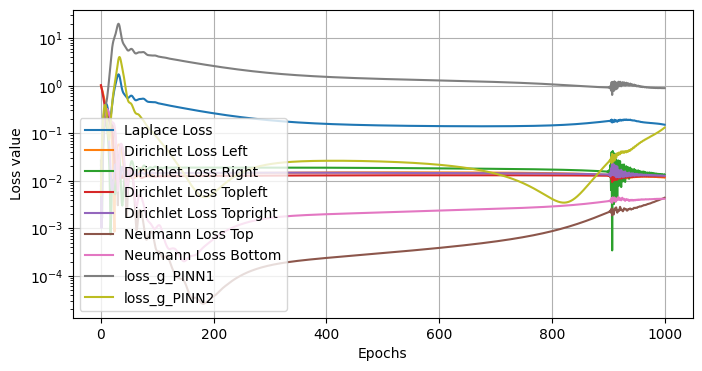

Epoch 1000, Loss: 29.635427474975586


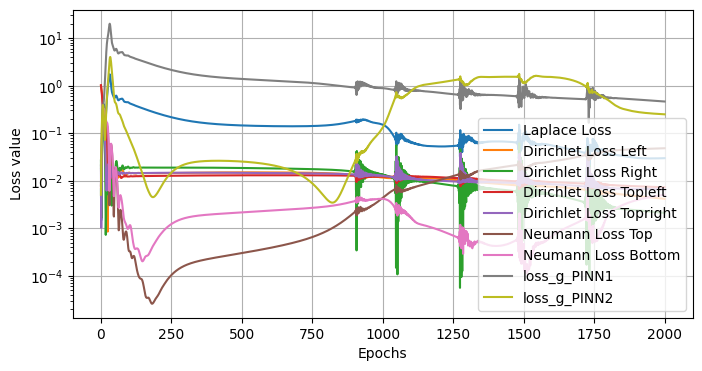

Epoch 2000, Loss: 20.61870574951172


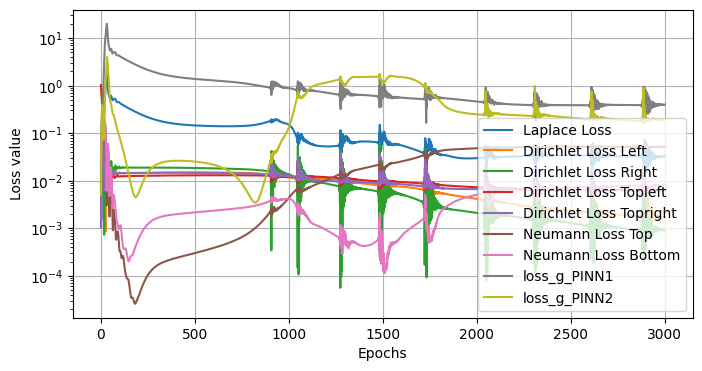

Epoch 3000, Loss: 19.415237426757812


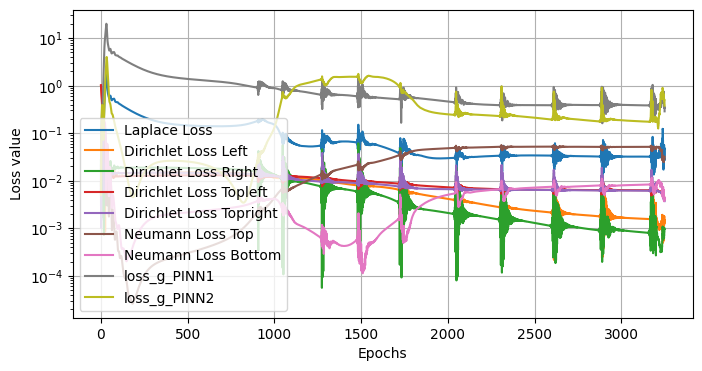

Epoch 3250, Loss: 12.447863578796387


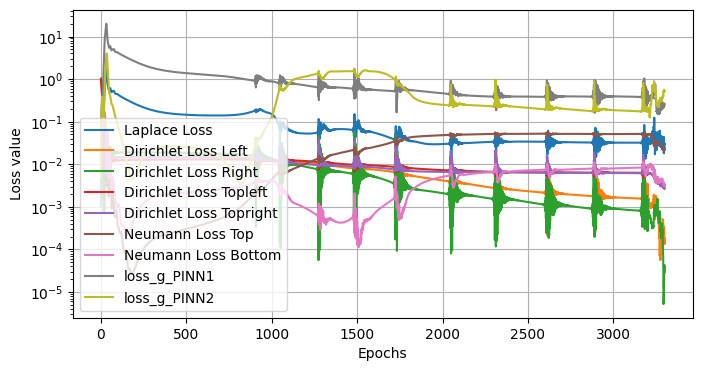

Epoch 3300, Loss: 9.188830375671387


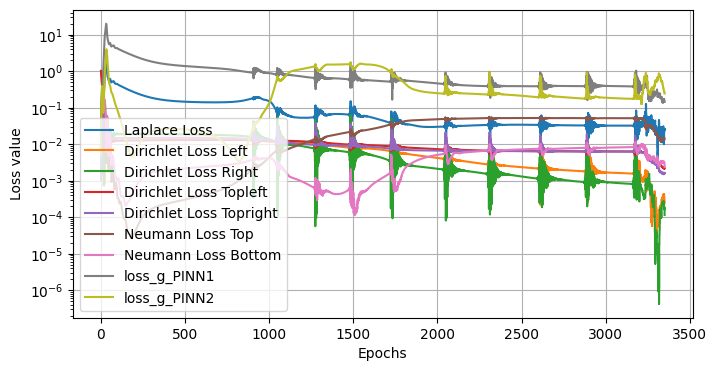

Epoch 3350, Loss: 5.907482624053955


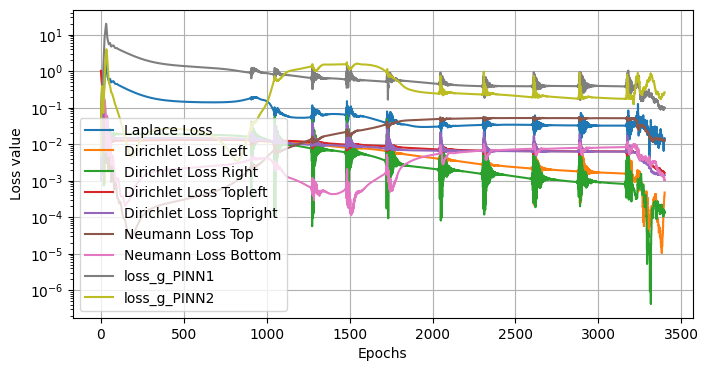

Epoch 3400, Loss: 4.822615146636963


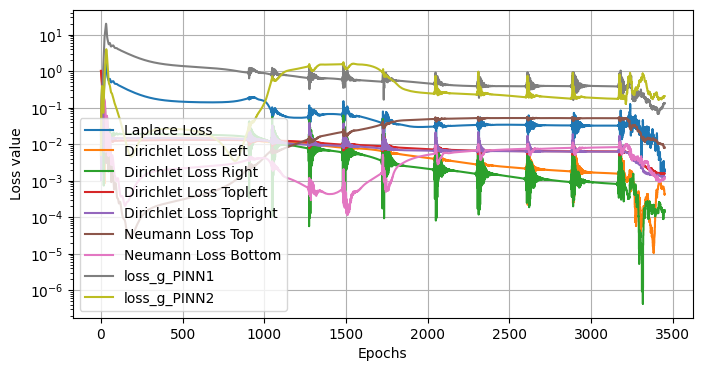

Epoch 3450, Loss: 4.130863189697266


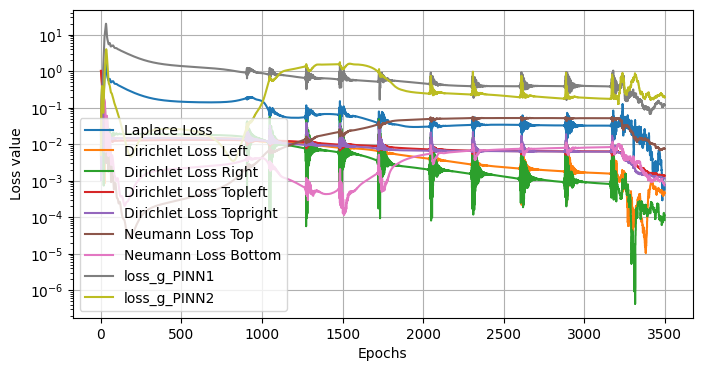

Epoch 3500, Loss: 3.698148250579834


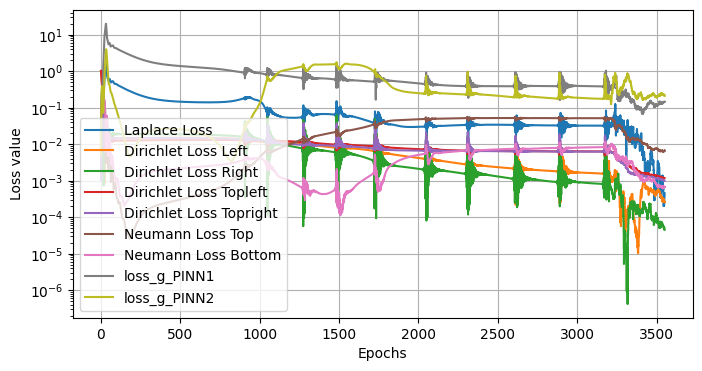

Epoch 3550, Loss: 3.266693592071533


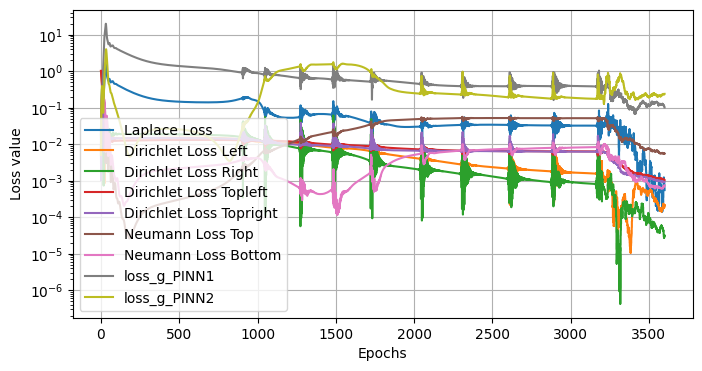

Epoch 3600, Loss: 2.952127695083618


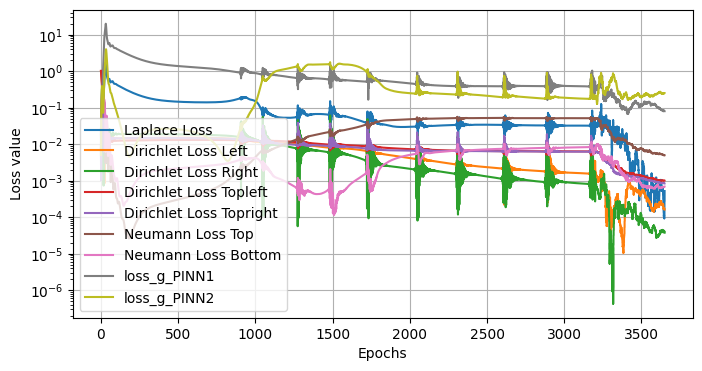

Epoch 3650, Loss: 2.756847858428955


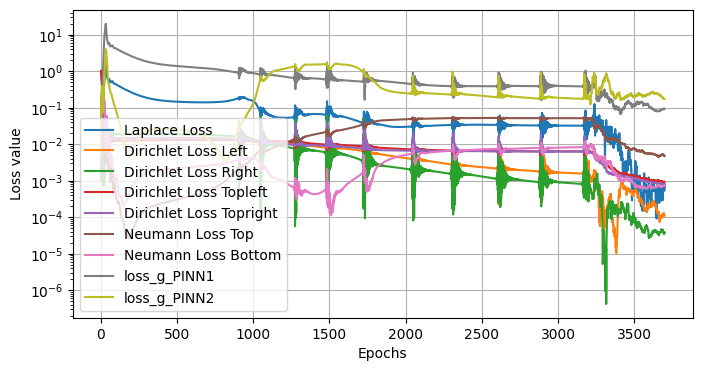

Epoch 3700, Loss: 2.5581610202789307


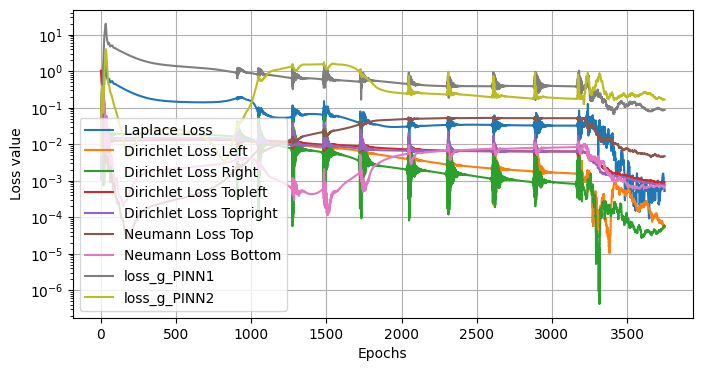

Epoch 3750, Loss: 2.4351885318756104


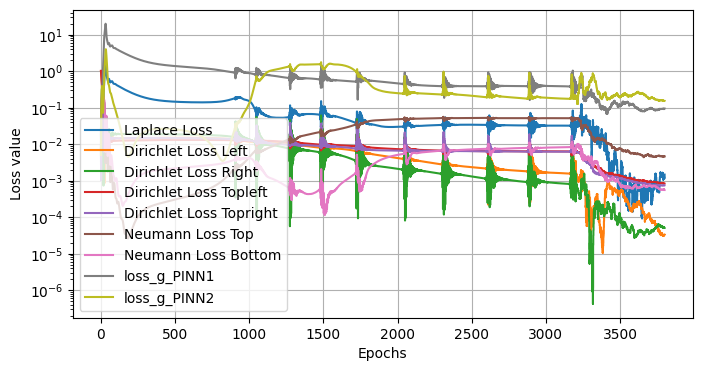

Epoch 3800, Loss: 2.3485512733459473


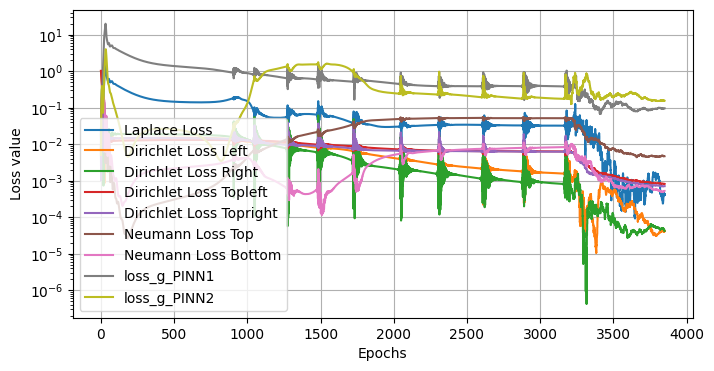

Epoch 3850, Loss: 2.292414426803589


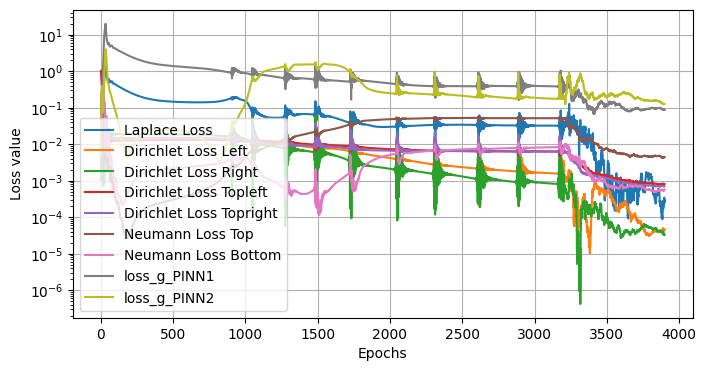

Epoch 3900, Loss: 2.2090227603912354


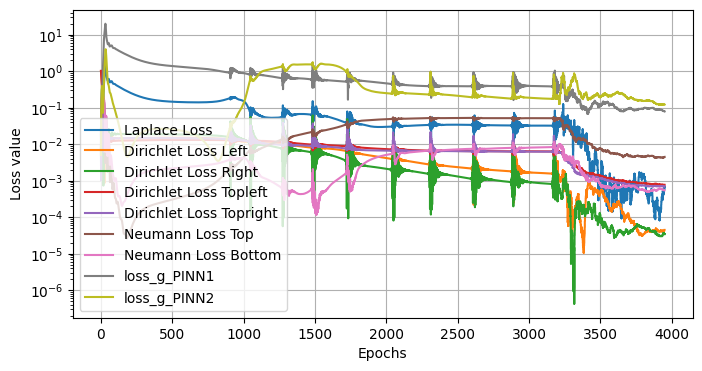

Epoch 3950, Loss: 2.158034563064575


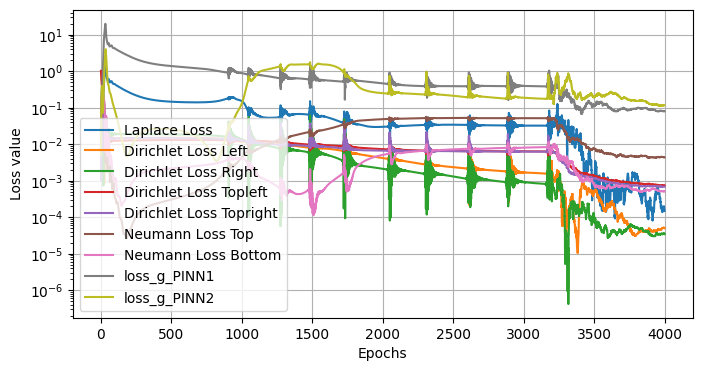

Epoch 4000, Loss: 2.1188085079193115


In [98]:
def set_seed(seed=42):
    random.seed(seed)  # Python random module
    np.random.seed(seed)  # Numpy random module
    torch.manual_seed(seed)  # PyTorch CPU
    torch.cuda.manual_seed(seed)  # PyTorch GPU
    torch.cuda.manual_seed_all(seed)  # All GPUs (if multiple)

# Set the seed
set_seed(123)

# Define the neural network for the Physics-Informed Neural Network (PINN)
class pinn(nn.Module):
    def __init__(self, hidden_size=20, hidden_layers=3):
        super(pinn, self).__init__()
        layers = [nn.Linear(2, hidden_size), nn.Tanh()]  # Change Tanh to GeLU
        for _ in range(hidden_layers):
            layers.append(nn.Linear(hidden_size, hidden_size))
            layers.append(nn.Tanh())  # Change Tanh to GeLU
        layers.append(nn.Linear(hidden_size, 1))
        self.network = nn.Sequential(*layers)
        
    def forward(self, x):
        return self.network(x)

def laplace_residual(model, coords):
    u = model(coords)
    grads = torch.autograd.grad(u, coords, grad_outputs=torch.ones_like(u), create_graph=True)[0]
    u_x = grads[:, 0]
    u_y = grads[:, 1]
    
    # Compute second-order gradients
    u_xx = torch.autograd.grad(u_x, coords, grad_outputs=torch.ones_like(u_x), create_graph=True)[0][:, 0]
    u_yy = torch.autograd.grad(u_y, coords, grad_outputs=torch.ones_like(u_y), create_graph=True)[0][:, 1]
    u_xy = torch.autograd.grad(u_x, coords, grad_outputs=torch.ones_like(u_x), create_graph=True)[0][:, 1]
    
    # Compute third-order gradients
    u_xxx = torch.autograd.grad(u_xx, coords, grad_outputs=torch.ones_like(u_xx), create_graph=True)[0][:, 0]
    u_xxy = torch.autograd.grad(u_xx, coords, grad_outputs=torch.ones_like(u_xx), create_graph=True)[0][:, 1]
    u_xyy = torch.autograd.grad(u_xy, coords, grad_outputs=torch.ones_like(u_xy), create_graph=True)[0][:, 1]
    u_yyy = torch.autograd.grad(u_yy, coords, grad_outputs=torch.ones_like(u_yy), create_graph=True)[0][:, 1]
    

    return torch.mean((u_xx + u_yy) ** 2), torch.mean((u_xxx + u_xyy) ** 2), torch.mean((u_xxy + u_yyy) ** 2)
#Boundary conditions:
def loss_dirichlet_boundary(model,boundary_points,boundary_target):
    u_pred = model(boundary_points)
    boundary_residual= u_pred-boundary_target
    return torch.mean((boundary_residual)**2)

def loss_neumann_boundary(model,boundary_points,axis='horizontal'):
    u_pred = model(boundary_points)
    u_grad= torch.autograd.grad(u_pred,boundary_points,grad_outputs=torch.ones_like(u_pred),create_graph=True)[0] #This is the gradient of u 
    if axis=='vertical':
        u_x = u_grad[:,0] # This is the x-component of the gradient of u
        return torch.mean((u_x)**2)
    elif axis=='horizontal':
        u_y = u_grad[:,1] # This is the y-component of the gradient of u
        return torch.mean((u_y)**2)

# Function to create boundary points
def create_boundary_points(axis, place, start, end, num_points, head=None):
    line_points = torch.full((num_points, 1), place)
    place_points = start + (end - start) * torch.rand(num_points, 1)
    
    if axis == 'vertical':
        boundary_points = torch.cat([line_points, place_points], dim=1)
    elif axis == 'horizontal':
        boundary_points = torch.cat([place_points, line_points], dim=1)

    # Only return targets if head value is provided (for Dirichlet conditions)
    if head is not None:
        boundary_targets = torch.full((num_points, 1), head, dtype=torch.float)
        return boundary_points, boundary_targets
    else:
        return boundary_points

def plot_losses(epochs, losses_dict):
    plt.figure(figsize=(8, 4))
    
    for loss_name, loss_values in losses_dict.items():
        plt.plot(epochs, loss_values, label=loss_name)
    plt.gca().yaxis.set_major_locator(LogLocator(base=10.0))
    plt.gca().yaxis.set_major_formatter(FormatStrFormatter('%.1f'))

    plt.yscale('log')
    plt.xlabel("Epochs")
    plt.ylabel("Loss value")
    plt.grid()
    plt.legend()
    plt.show()


def closure():
    optimizer.zero_grad()

    # Compute individual loss terms
    loss_laplace = laplace_residual(model, train_points)[0]
    loss_g_PINN1=laplace_residual(model, train_points)[1]
    loss_g_PINN2=laplace_residual(model, train_points)[2]
    loss_d_l = loss_dirichlet_boundary(model, boundary_points_dirichlet_left, target_points_dirichlet_left)
    loss_d_r = loss_dirichlet_boundary(model, boundary_points_dirichlet_right, target_points_dirichlet_right)
    loss_d_tl = loss_dirichlet_boundary(model, boundary_points_dirichlet_topleft, target_points_dirichlet_topleft)
    loss_d_tr = loss_dirichlet_boundary(model, boundary_points_dirichlet_topright, target_points_dirichlet_topright)
    loss_n_t = loss_neumann_boundary(model, boundary_points_neumann_top, axis='horizontal')
    loss_n_b = loss_neumann_boundary(model, boundary_points_neumann_bottom, axis='horizontal')
    
    # Combine losses using the updated weights
    loss = (
        loss_weights[0] * loss_laplace +
        loss_weights[1] * loss_d_l +
        loss_weights[2] * loss_d_r +
        loss_weights[3] * loss_d_tl +
        loss_weights[4] * loss_d_tr +
        loss_weights[5] * loss_n_t +
        loss_weights[6] * loss_n_b +
        loss_weights[7] * loss_g_PINN1 +
        loss_weights[8] * loss_g_PINN2
    )

    loss.backward()
    
    # Record losses and weights
    laplace_losses.append(loss_laplace.item())
    dirichlet_losses_left.append(loss_d_l.item())
    dirichlet_losses_right.append(loss_d_r.item())
    dirichlet_losses_topleft.append(loss_d_tl.item())
    dirichlet_losses_topright.append(loss_d_tr.item())
    neumann_losses_top.append(loss_n_t.item())
    neumann_losses_bottom.append(loss_n_b.item())
    epochs_recorded.append(epoch)
    loss_recorded.append(loss.item())
    loss_g_PINN1_recorded.append(loss_g_PINN1.item())
    loss_g_PINN2_recorded.append(loss_g_PINN2.item())

    return loss

#_____________________________________________________________________________________________________________

#Domain size:
left, right, bottom, top = 0, 1, 0, 0.2

left_dirichlet,target_left_dirichlet = create_boundary_points('vertical', left, 0, top, 1000, 1)  # Left boundary
boundary_points_dirichlet_left=torch.cat([left_dirichlet],dim=0).requires_grad_(True)  # Concatenate Dirichlet boundary points
target_points_dirichlet_left=torch.cat([target_left_dirichlet],dim=0).requires_grad_(True) # Concatenate Dirichlet boundary targets

right_dirichlet, target_right_dirichlet = create_boundary_points('vertical', right, 0, top, 1000, 0) # Right boundary
boundary_points_dirichlet_right=torch.cat([right_dirichlet],dim=0).requires_grad_(True) # Concatenate Dirichlet boundary points
target_points_dirichlet_right=torch.cat([target_right_dirichlet],dim=0).requires_grad_(True) # Concatenate Dirichlet boundary targets

topleft_dirichlet, target_topleft_dirichlet= create_boundary_points('horizontal', top, 0, 0.3*right, 3000, 1)
boundary_points_dirichlet_topleft=torch.cat([topleft_dirichlet],dim=0).requires_grad_(True)
target_points_dirichlet_topleft=torch.cat([target_topleft_dirichlet],dim=0).requires_grad_(True)

topright_dirichlet,target_topright_dirichlet = create_boundary_points('horizontal', top, 0.7*right, 1*right, 3000, 0)
boundary_points_dirichlet_topright=torch.cat([topright_dirichlet],dim=0).requires_grad_(True)
target_points_dirichlet_topright=torch.cat([target_topright_dirichlet],dim=0).requires_grad_(True)

top_neumann=create_boundary_points('horizontal', top, 0.3*right, 0.7*right, 3000)
boundary_points_neumann_top=torch.cat([top_neumann],dim=0).requires_grad_(True)

bottom_neumann=create_boundary_points('horizontal', bottom, 0, right, 1000)
boundary_points_neumann_bottom=torch.cat([bottom_neumann],dim=0).requires_grad_(True)


# Creating domain points
num_domain_points=6501
x_points = torch.rand(num_domain_points,1) 
x = (x_points*right).requires_grad_(True)
y_points = torch.rand(num_domain_points,1)
y=(y_points*top).requires_grad_(True)
train_points=torch.cat([x,y],dim=1) 

# Initialize lists to store losses and plot
laplace_losses = []
dirichlet_losses_left = []
dirichlet_losses_right = []
dirichlet_losses_topleft = []
dirichlet_losses_topright = []
neumann_losses_top = []
neumann_losses_bottom = []
epochs_recorded = []
loss_recorded = []
loss_g_PINN1_recorded = []
loss_g_PINN2_recorded = []

#Defining hyperparameters:
model=pinn(hidden_size=20, hidden_layers=8) 

epochs=4001

# Initialize the loss weights
lambda_laplace, y_d_l, y_d_r, y_d_tl, y_d_tr, y_n_t, y_n_b,y_g_1,y_g_2 = 2,100,100,1000,1000,100,100,1,1
loss_weights = (torch.tensor([lambda_laplace, y_d_l, y_d_r, y_d_tl, y_d_tr, y_n_t, y_n_b,y_g_1,y_g_2], 
                            dtype=torch.float, requires_grad=False))

adam_optimizer = torch.optim.Adam(model.parameters(), lr=0.001)
lbfgs_optimizer = torch.optim.LBFGS(model.parameters(), lr=0.1, max_iter=20)

# Initialize the weights and biases of the model
def initialize_weights(m):
    if isinstance(m, nn.Linear):
        nn.init.xavier_normal_(m.weight)  # Use Xavier initialization
        nn.init.zeros_(m.bias)  # Initialize biases to zero
# Apply weight initialization
model.apply(initialize_weights)


#Training loop:
for epoch in range(epochs):
    optimizer = adam_optimizer if epoch < 3200 else lbfgs_optimizer
    optimizer.step(closure) # Update the weights and biases of the model

    # Logging

    if epoch % 1000 == 0 and epoch <= 3200:
        losses_dict = {
            "Laplace Loss": laplace_losses,
            "Dirichlet Loss Left": dirichlet_losses_left,
            "Dirichlet Loss Right": dirichlet_losses_right,
            "Dirichlet Loss Topleft": dirichlet_losses_topleft,
            "Dirichlet Loss Topright": dirichlet_losses_topright,
            "Neumann Loss Top": neumann_losses_top,
            "Neumann Loss Bottom": neumann_losses_bottom,
            "loss_g_PINN1": loss_g_PINN1_recorded,
            "loss_g_PINN2": loss_g_PINN2_recorded
        }

        plot_losses(epochs_recorded, losses_dict)
        print(f"Epoch {epoch}, Loss: {loss_recorded[-1]}")
    
    if epoch % 50 == 0 and epoch > 3200:
        losses_dict = {
            "Laplace Loss": laplace_losses,
            "Dirichlet Loss Left": dirichlet_losses_left,
            "Dirichlet Loss Right": dirichlet_losses_right,
            "Dirichlet Loss Topleft": dirichlet_losses_topleft,
            "Dirichlet Loss Topright": dirichlet_losses_topright,
            "Neumann Loss Top": neumann_losses_top,
            "Neumann Loss Bottom": neumann_losses_bottom,
            "loss_g_PINN1": loss_g_PINN1_recorded,
            "loss_g_PINN2": loss_g_PINN2_recorded
        }

        plot_losses(epochs_recorded, losses_dict)
        print(f"Epoch {epoch}, Loss: {loss_recorded[-1]}")

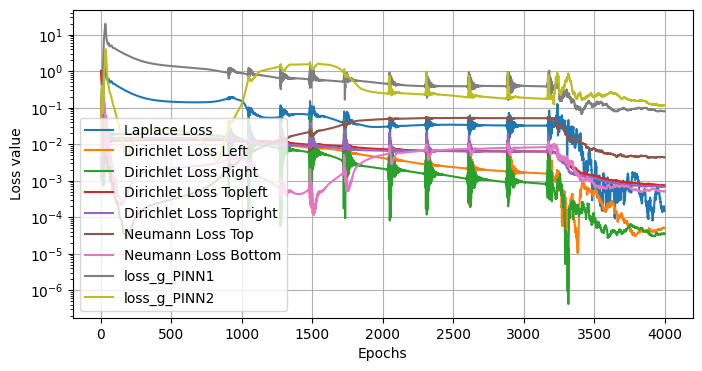

307m 40s


In [ ]:
# Assume `model` is your trained instance of the `pinn` class
model_path = "#8.pth"
torch.save(model.state_dict(), model_path)
print(f"Model's state dictionary saved to {model_path}")

Model's state dictionary saved to #8.pth


## 8.2

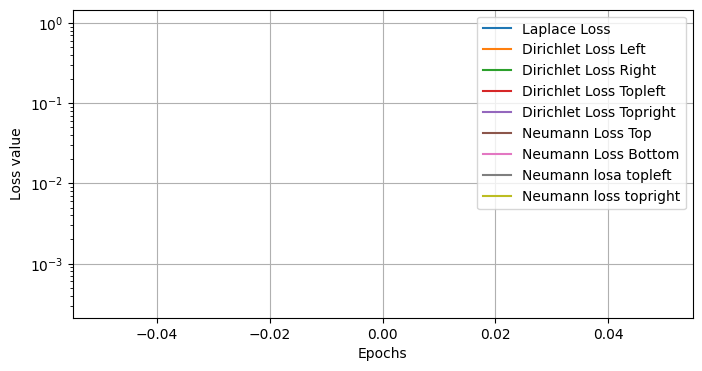

Epoch 0, Loss: 1072.73046875


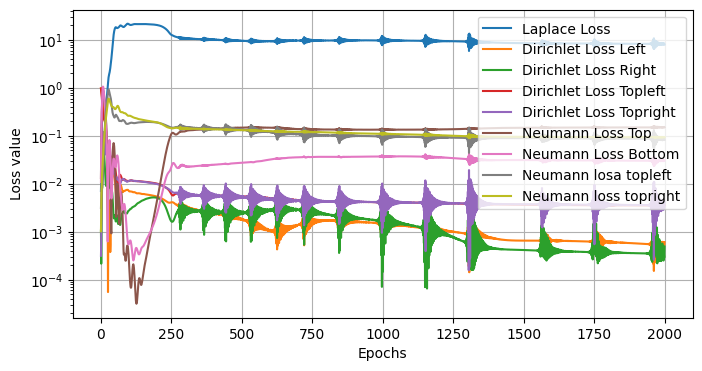

Epoch 2000, Loss: 59.793983459472656


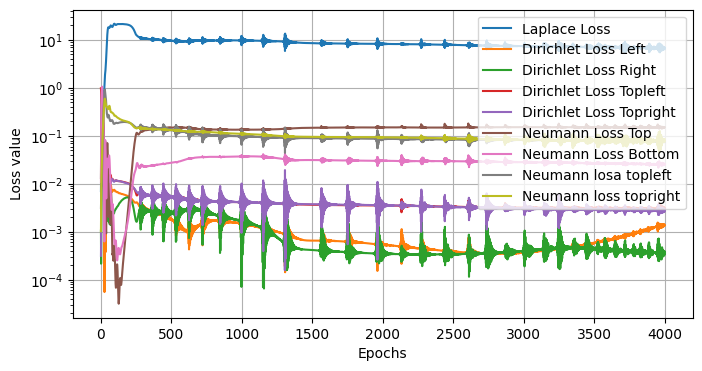

Epoch 4000, Loss: 52.72816848754883


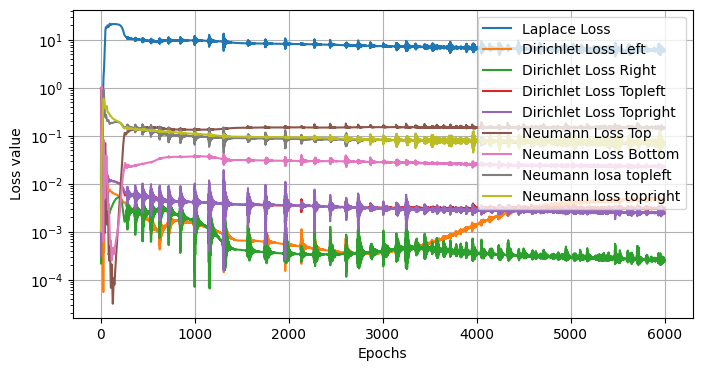

Epoch 6000, Loss: 49.371612548828125


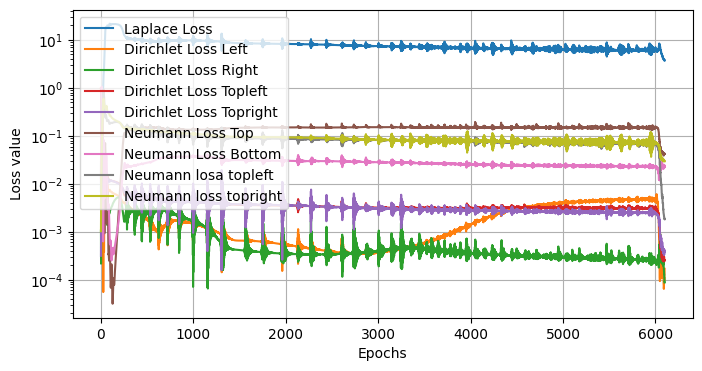

Epoch 6100, Loss: 17.822561264038086


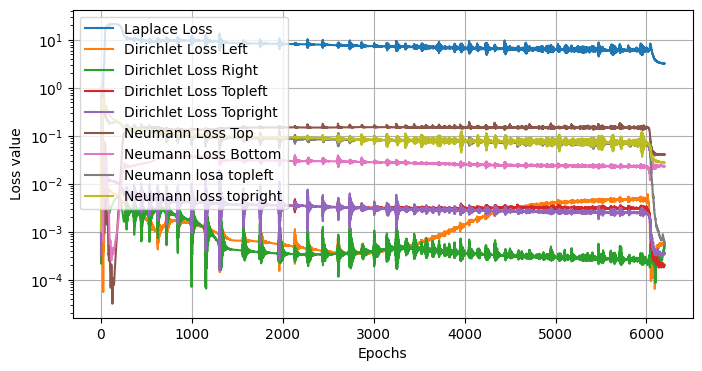

Epoch 6200, Loss: 16.27029037475586


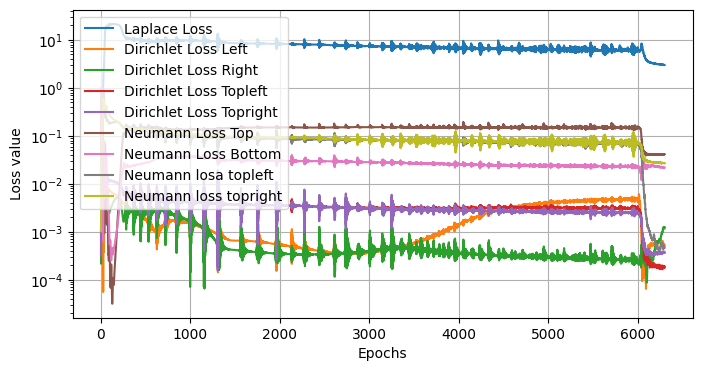

Epoch 6300, Loss: 15.773313522338867


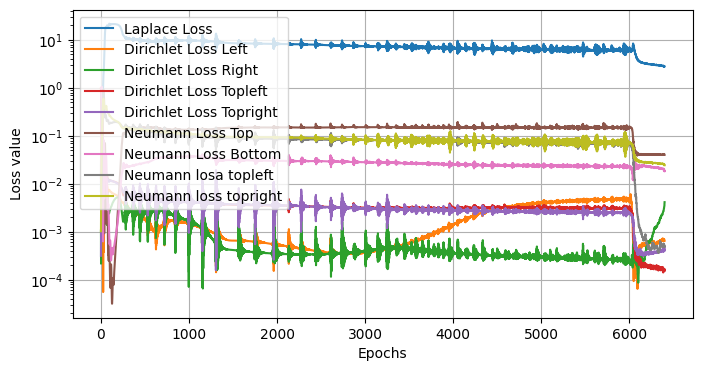

Epoch 6400, Loss: 15.086466789245605


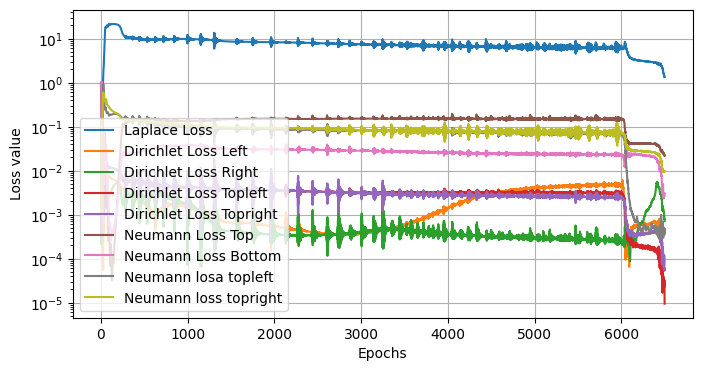

Epoch 6500, Loss: 6.305178642272949


In [100]:
def set_seed(seed=42):
    random.seed(seed)  # Python random module
    np.random.seed(seed)  # Numpy random module
    torch.manual_seed(seed)  # PyTorch CPU
    torch.cuda.manual_seed(seed)  # PyTorch GPU
    torch.cuda.manual_seed_all(seed)  # All GPUs (if multiple)

# Set the seed
set_seed(123)

# Define the neural network for the Physics-Informed Neural Network (PINN)
class pinn(nn.Module):
    def __init__(self, hidden_size=20, hidden_layers=3):
        super(pinn, self).__init__()
        layers = [nn.Linear(2, hidden_size), nn.Tanh()]  # Change Tanh to GeLU
        for _ in range(hidden_layers):
            layers.append(nn.Linear(hidden_size, hidden_size))
            layers.append(nn.Tanh())  # Change Tanh to GeLU
        layers.append(nn.Linear(hidden_size, 1))
        self.network = nn.Sequential(*layers)
        
    def forward(self, x):
        return self.network(x)

def laplace_residual(model, coords):
    u = model(coords)
    grads = torch.autograd.grad(u, coords, grad_outputs=torch.ones_like(u), create_graph=True)[0]
    u_xx = torch.autograd.grad(grads[:, 0], coords, grad_outputs=torch.ones_like(grads[:, 0]), create_graph=True)[0][:, 0]
    u_yy = torch.autograd.grad(grads[:, 1], coords, grad_outputs=torch.ones_like(grads[:, 1]), create_graph=True)[0][:, 1]
    return torch.mean((u_xx + u_yy) ** 2)

#Boundary conditions:
def loss_dirichlet_boundary(model,boundary_points,boundary_target):
    u_pred = model(boundary_points)
    boundary_residual= u_pred-boundary_target
    return torch.mean((boundary_residual)**2)

def loss_neumann_boundary(model,boundary_points,axis='horizontal'):
    u_pred = model(boundary_points)
    u_grad= torch.autograd.grad(u_pred,boundary_points,grad_outputs=torch.ones_like(u_pred),create_graph=True)[0] #This is the gradient of u 
    if axis=='vertical':
        u_x = u_grad[:,0] # This is the x-component of the gradient of u
        return torch.mean((u_x)**2)
    elif axis=='horizontal':
        u_y = u_grad[:,1] # This is the y-component of the gradient of u
        return torch.mean((u_y)**2)

# Function to create boundary points
def create_boundary_points(axis, place, start, end, num_points, head=None):
    line_points = torch.full((num_points, 1), place)
    place_points = start + (end - start) * torch.rand(num_points, 1)
    
    if axis == 'vertical':
        boundary_points = torch.cat([line_points, place_points], dim=1)
    elif axis == 'horizontal':
        boundary_points = torch.cat([place_points, line_points], dim=1)

    # Only return targets if head value is provided (for Dirichlet conditions)
    if head is not None:
        boundary_targets = torch.full((num_points, 1), head, dtype=torch.float)
        return boundary_points, boundary_targets
    else:
        return boundary_points

def plot_losses(epochs, losses_dict):
    plt.figure(figsize=(8, 4))
    
    for loss_name, loss_values in losses_dict.items():
        plt.plot(epochs, loss_values, label=loss_name)
    plt.gca().yaxis.set_major_locator(LogLocator(base=10.0))
    plt.gca().yaxis.set_major_formatter(FormatStrFormatter('%.1f'))

    plt.yscale('log')
    plt.xlabel("Epochs")
    plt.ylabel("Loss value")
    plt.grid()
    plt.legend()
    plt.show()


def closure():
    optimizer.zero_grad()

    # Compute individual loss terms
    loss_laplace = laplace_residual(model, train_points)
    loss_d_l = loss_dirichlet_boundary(model, boundary_points_dirichlet_left, target_points_dirichlet_left)
    loss_d_r = loss_dirichlet_boundary(model, boundary_points_dirichlet_right, target_points_dirichlet_right)
    loss_d_tl = loss_dirichlet_boundary(model, boundary_points_dirichlet_topleft, target_points_dirichlet_topleft)
    loss_d_tr = loss_dirichlet_boundary(model, boundary_points_dirichlet_topright, target_points_dirichlet_topright)
    loss_n_t = loss_neumann_boundary(model, boundary_points_neumann_top, axis='horizontal')
    loss_n_b = loss_neumann_boundary(model, boundary_points_neumann_bottom, axis='horizontal')
    loss_n_tl = loss_neumann_boundary(model, boundary_points_neumann_topleft, axis='vertical')
    loss_n_tr = loss_neumann_boundary(model, boundary_points_neumann_topright, axis='vertical')
    
    # Combine losses using the updated weights
    loss = (
        loss_weights[0] * loss_laplace +
        loss_weights[1] * loss_d_l +
        loss_weights[2] * loss_d_r +
        loss_weights[3] * loss_d_tl +
        loss_weights[4] * loss_d_tr +
        loss_weights[5] * loss_n_t +
        loss_weights[6] * loss_n_b +
        loss_weights[7] * loss_n_tl +
        loss_weights[8] * loss_n_tr
    )

    loss.backward()
    
    # Record losses and weights
    laplace_losses.append(loss_laplace.item())
    dirichlet_losses_left.append(loss_d_l.item())
    dirichlet_losses_right.append(loss_d_r.item())
    dirichlet_losses_topleft.append(loss_d_tl.item())
    dirichlet_losses_topright.append(loss_d_tr.item())
    neumann_losses_top.append(loss_n_t.item())
    neumann_losses_bottom.append(loss_n_b.item())
    epochs_recorded.append(epoch)
    loss_recorded.append(loss.item())
    neumann_losses_topleft.append(loss_n_tl.item())
    neumann_losses_topright.append(loss_n_tr.item())


    return loss

#_____________________________________________________________________________________________________________

#Domain size:
left, right, bottom, top = 0, 1, 0, 0.2

left_dirichlet,target_left_dirichlet = create_boundary_points('vertical', left, 0, top, 1000, 1)  # Left boundary
boundary_points_dirichlet_left=torch.cat([left_dirichlet],dim=0).requires_grad_(True)  # Concatenate Dirichlet boundary points
target_points_dirichlet_left=torch.cat([target_left_dirichlet],dim=0).requires_grad_(True) # Concatenate Dirichlet boundary targets

right_dirichlet, target_right_dirichlet = create_boundary_points('vertical', right, 0, top, 1000, 0) # Right boundary
boundary_points_dirichlet_right=torch.cat([right_dirichlet],dim=0).requires_grad_(True) # Concatenate Dirichlet boundary points
target_points_dirichlet_right=torch.cat([target_right_dirichlet],dim=0).requires_grad_(True) # Concatenate Dirichlet boundary targets

topleft_dirichlet, target_topleft_dirichlet= create_boundary_points('horizontal', top, 0, 0.3*right, 3000, 1)
boundary_points_dirichlet_topleft=torch.cat([topleft_dirichlet],dim=0).requires_grad_(True)
target_points_dirichlet_topleft=torch.cat([target_topleft_dirichlet],dim=0).requires_grad_(True)

topright_dirichlet,target_topright_dirichlet = create_boundary_points('horizontal', top, 0.7*right, 1*right, 3000, 0)
boundary_points_dirichlet_topright=torch.cat([topright_dirichlet],dim=0).requires_grad_(True)
target_points_dirichlet_topright=torch.cat([target_topright_dirichlet],dim=0).requires_grad_(True)

top_neumann=create_boundary_points('horizontal', top, 0.3*right, 0.7*right, 3000)
boundary_points_neumann_top=torch.cat([top_neumann],dim=0).requires_grad_(True)

bottom_neumann=create_boundary_points('horizontal', bottom, 0, right, 1000)
boundary_points_neumann_bottom=torch.cat([bottom_neumann],dim=0).requires_grad_(True)

#Try adding gradient enhanced loss on boundary
topleft_neumann=create_boundary_points('horizontal', top, 0, 0.3*right, 1000)
boundary_points_neumann_topleft=torch.cat([topleft_neumann],dim=0).requires_grad_(True)

topright_neumann=create_boundary_points('horizontal', top, 0.7*right, 1*right, 1000)
boundary_points_neumann_topright=torch.cat([topright_neumann],dim=0).requires_grad_(True)



# Creating domain points
num_domain_points=6501
x_points = torch.rand(num_domain_points,1) 
x = (x_points*right).requires_grad_(True)
y_points = torch.rand(num_domain_points,1)
y=(y_points*top).requires_grad_(True)
train_points=torch.cat([x,y],dim=1) 

# Initialize lists to store losses and plot
laplace_losses = []
dirichlet_losses_left = []
dirichlet_losses_right = []
dirichlet_losses_topleft = []
dirichlet_losses_topright = []
neumann_losses_top = []
neumann_losses_bottom = []
epochs_recorded = []
loss_recorded = []
neumann_losses_topleft = []
neumann_losses_topright = []


#Defining hyperparameters:
model=pinn(hidden_size=20, hidden_layers=8) 

epochs=6501

# Initialize the loss weights
lambda_laplace, y_d_l, y_d_r, y_d_tl, y_d_tr, y_n_t, y_n_b,y_n_tl,y_n_tr = 2,100,100,1000,1000,100,100,100,100
loss_weights = (torch.tensor([lambda_laplace, y_d_l, y_d_r, y_d_tl, y_d_tr, y_n_t, y_n_b, y_n_tl, y_n_tr], 
                            dtype=torch.float, requires_grad=False))

adam_optimizer = torch.optim.Adam(model.parameters(), lr=0.001)
lbfgs_optimizer = torch.optim.LBFGS(model.parameters(), lr=0.1, max_iter=20)

# Initialize the weights and biases of the model
def initialize_weights(m):
    if isinstance(m, nn.Linear):
        nn.init.xavier_normal_(m.weight)  # Use Xavier initialization
        nn.init.zeros_(m.bias)  # Initialize biases to zero
# Apply weight initialization
model.apply(initialize_weights)


#Training loop:
for epoch in range(epochs):
    optimizer = adam_optimizer if epoch < 6001 else lbfgs_optimizer
    optimizer.step(closure) # Update the weights and biases of the model

    # Logging

    if epoch % 2000 == 0 and epoch <= 6000:
        losses_dict = {
            "Laplace Loss": laplace_losses,
            "Dirichlet Loss Left": dirichlet_losses_left,
            "Dirichlet Loss Right": dirichlet_losses_right,
            "Dirichlet Loss Topleft": dirichlet_losses_topleft,
            "Dirichlet Loss Topright": dirichlet_losses_topright,
            "Neumann Loss Top": neumann_losses_top,
            "Neumann Loss Bottom": neumann_losses_bottom,
            "Neumann losa topleft": neumann_losses_topleft,
            "Neumann loss topright": neumann_losses_topright
        }

        plot_losses(epochs_recorded, losses_dict)
        print(f"Epoch {epoch}, Loss: {loss_recorded[-1]}")
    
    if epoch % 100 == 0 and epoch > 6000:
        losses_dict = {
            "Laplace Loss": laplace_losses,
            "Dirichlet Loss Left": dirichlet_losses_left,
            "Dirichlet Loss Right": dirichlet_losses_right,
            "Dirichlet Loss Topleft": dirichlet_losses_topleft,
            "Dirichlet Loss Topright": dirichlet_losses_topright,
            "Neumann Loss Top": neumann_losses_top,
            "Neumann Loss Bottom": neumann_losses_bottom,
            "Neumann losa topleft": neumann_losses_topleft,
            "Neumann loss topright": neumann_losses_topright
        }

        plot_losses(epochs_recorded, losses_dict)
        print(f"Epoch {epoch}, Loss: {loss_recorded[-1]}")

In [ ]:
# Assume `model` is your trained instance of the `pinn` class
model_path = "#8.1.pth"
torch.save(model.state_dict(), model_path)
print(f"Model's state dictionary saved to {model_path}")

Model's state dictionary saved to #8.1.pth


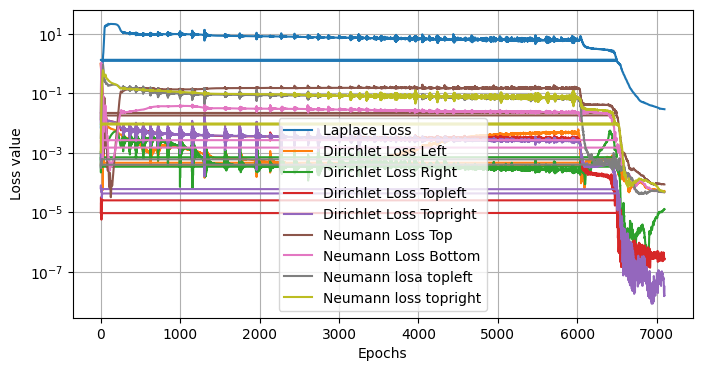

Epoch 7100, Loss: 0.08768247812986374


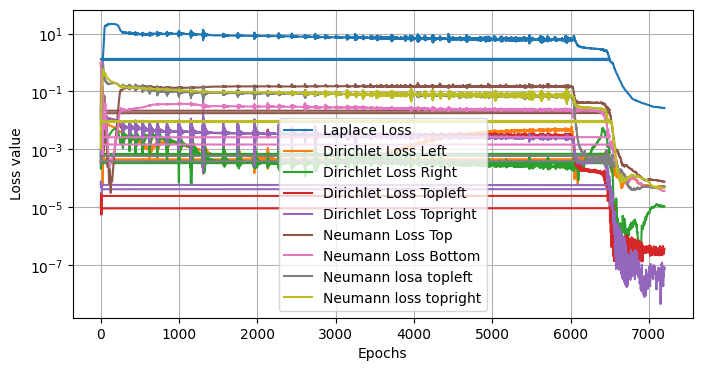

Epoch 7200, Loss: 0.08192575722932816


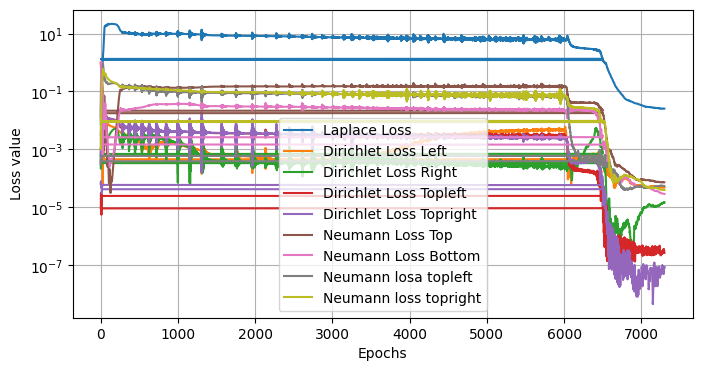

Epoch 7300, Loss: 0.07726389914751053


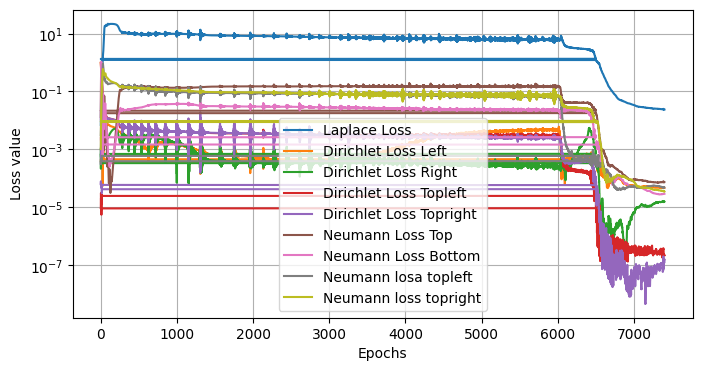

Epoch 7400, Loss: 0.07319357246160507


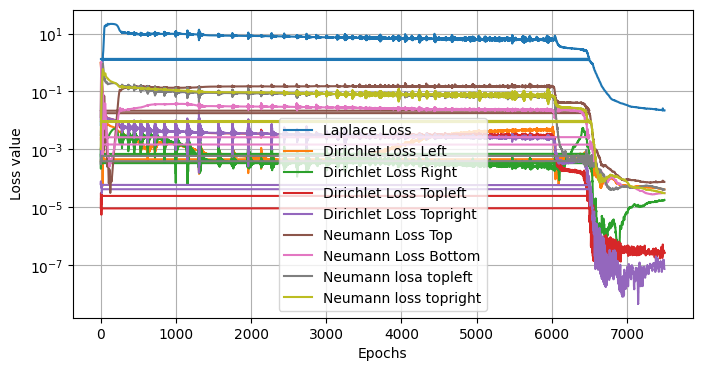

Epoch 7500, Loss: 0.06911196559667587


In [106]:
epochs=7501

#Training loop:
for epoch in range(7001, epochs):
    optimizer = lbfgs_optimizer
    optimizer.step(closure) # Update the weights and biases of the model
    
    if epoch % 100 == 0:
        losses_dict = {
            "Laplace Loss": laplace_losses,
            "Dirichlet Loss Left": dirichlet_losses_left,
            "Dirichlet Loss Right": dirichlet_losses_right,
            "Dirichlet Loss Topleft": dirichlet_losses_topleft,
            "Dirichlet Loss Topright": dirichlet_losses_topright,
            "Neumann Loss Top": neumann_losses_top,
            "Neumann Loss Bottom": neumann_losses_bottom,
            "Neumann losa topleft": neumann_losses_topleft,
            "Neumann loss topright": neumann_losses_topright
        }

        plot_losses(epochs_recorded, losses_dict)
        print(f"Epoch {epoch}, Loss: {loss_recorded[-1]}")

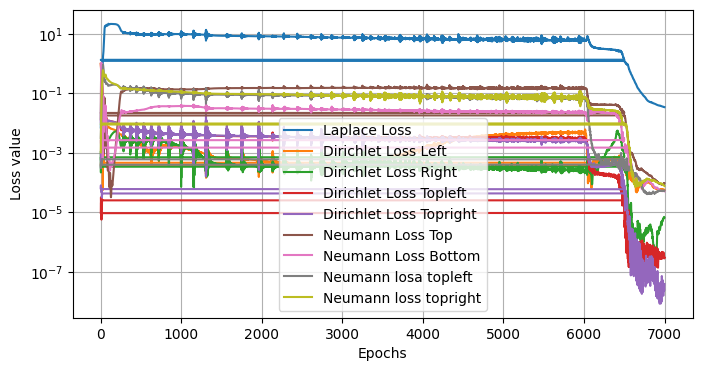

In [104]:
plot_losses(epochs_recorded, losses_dict)

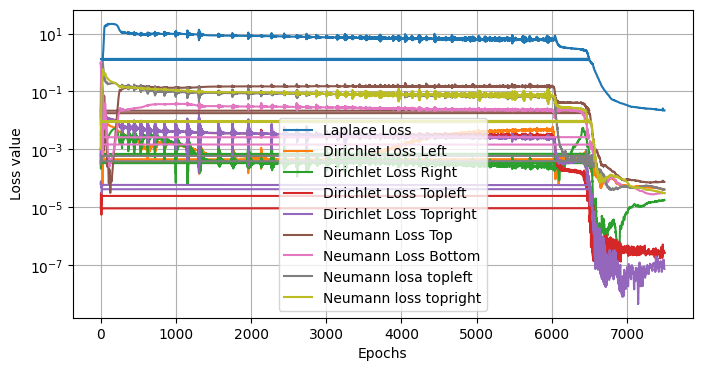

In [107]:
# Assume `model` is your trained instance of the `pinn` class
model_path = "#8.2.2.pth"
torch.save(model.state_dict(), model_path)
print(f"Model's state dictionary saved to {model_path}")

Model's state dictionary saved to #8.2.2.pth


# 9

Using the best from eveywhere!

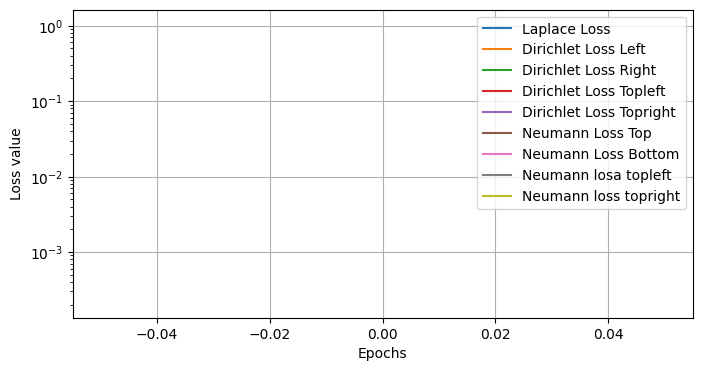

Epoch 0, Loss: 1182.50537109375


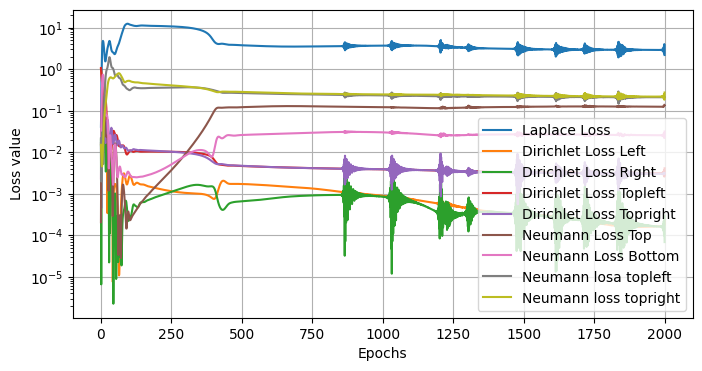

Epoch 2000, Loss: 54.69544219970703


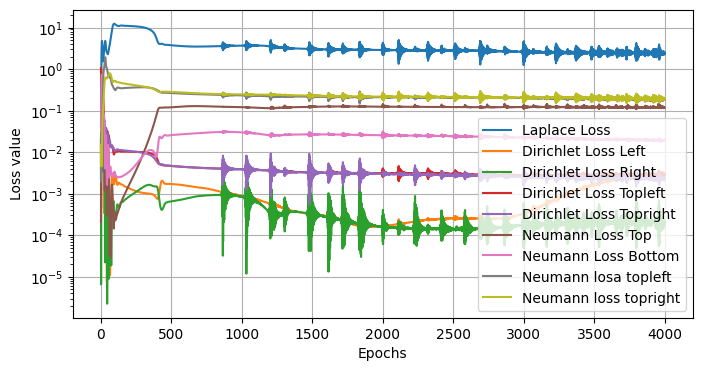

Epoch 4000, Loss: 45.36927795410156


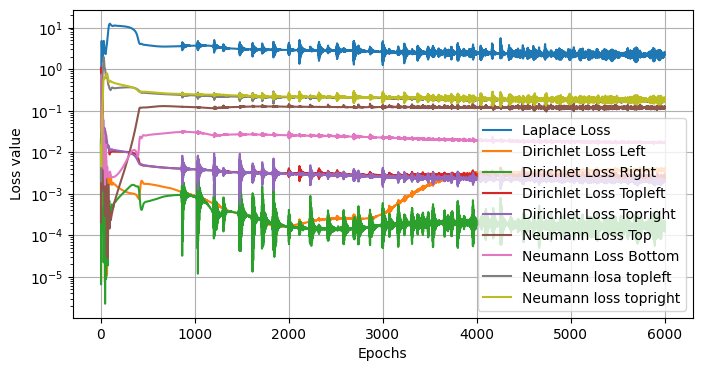

Epoch 6000, Loss: 44.21158218383789


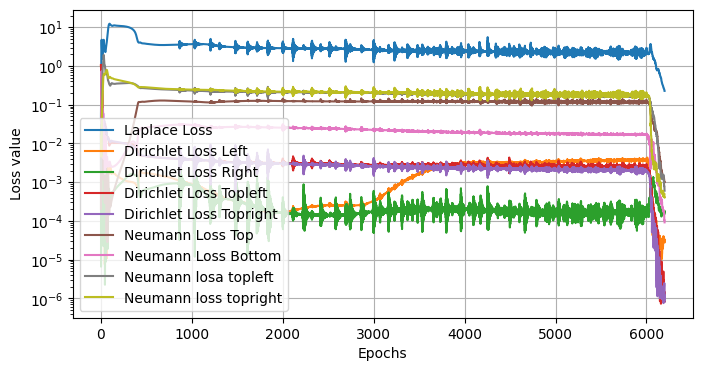

Epoch 6200, Loss: 0.8648686408996582


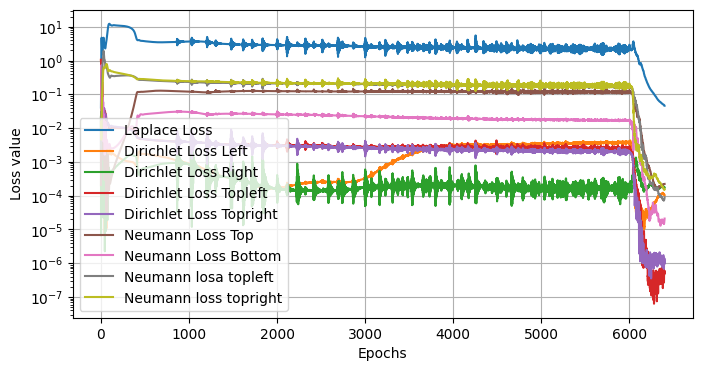

Epoch 6400, Loss: 0.20426857471466064


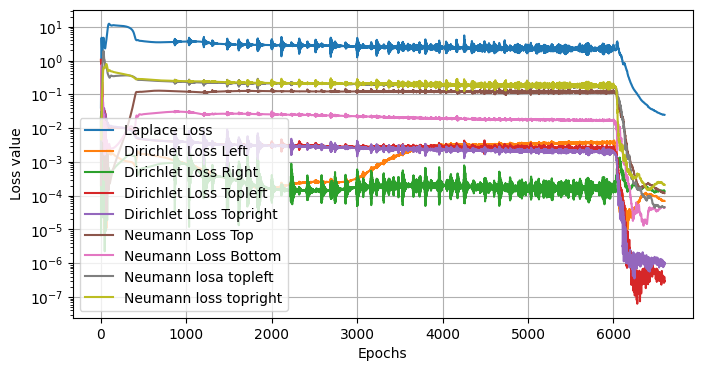

Epoch 6600, Loss: 0.12467293441295624


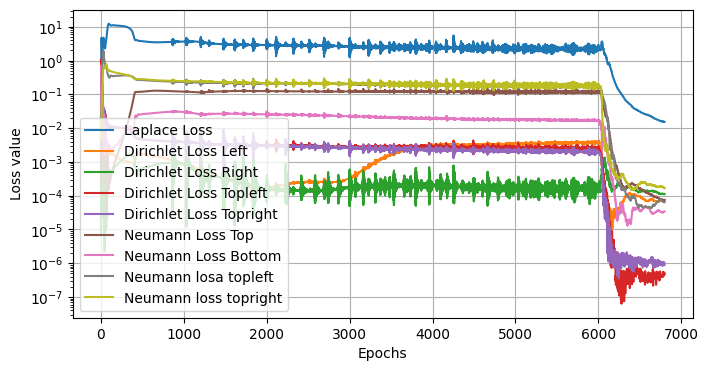

Epoch 6800, Loss: 0.08793365210294724


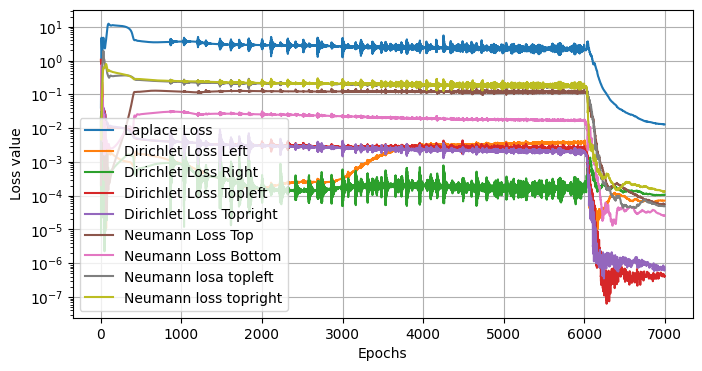

Epoch 7000, Loss: 0.07443241775035858


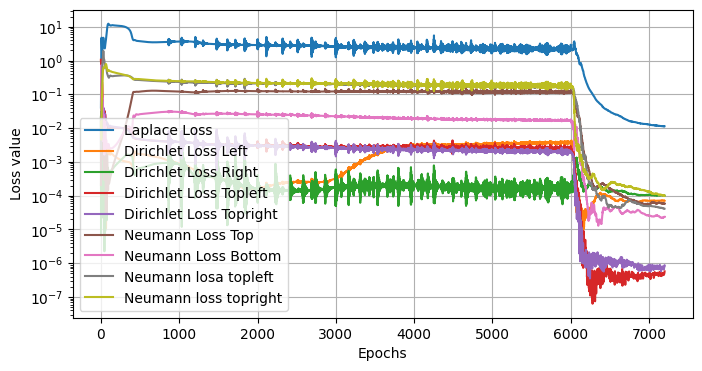

Epoch 7200, Loss: 0.0674380213022232


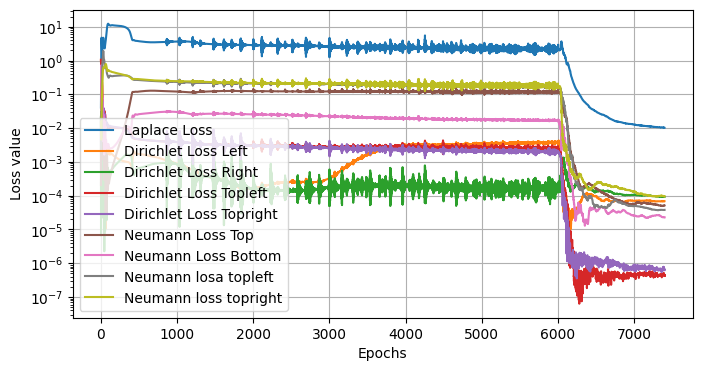

Epoch 7400, Loss: 0.06233817711472511


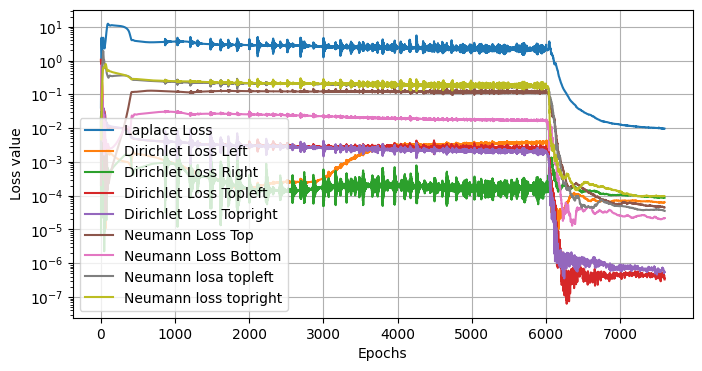

Epoch 7600, Loss: 0.05809196084737778


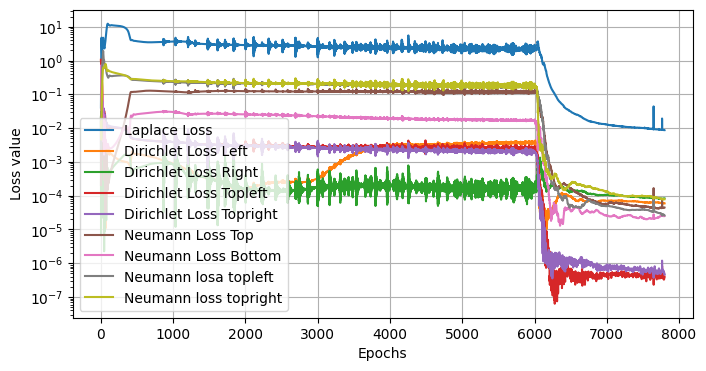

Epoch 7800, Loss: 0.05345704406499863


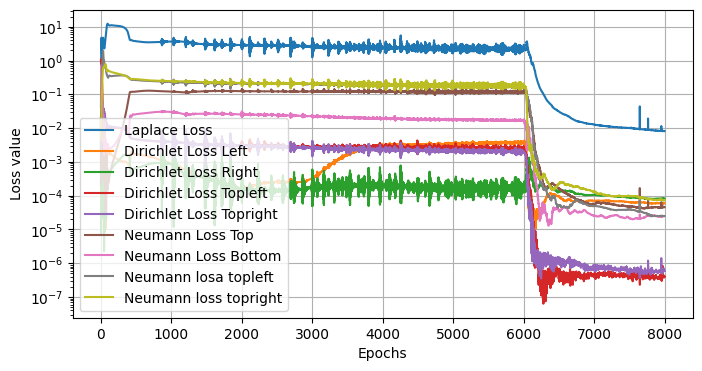

Epoch 8000, Loss: 0.05140198394656181


In [109]:
def set_seed(seed=42):
    random.seed(seed)  # Python random module
    np.random.seed(seed)  # Numpy random module
    torch.manual_seed(seed)  # PyTorch CPU
    torch.cuda.manual_seed(seed)  # PyTorch GPU
    torch.cuda.manual_seed_all(seed)  # All GPUs (if multiple)

# Set the seed
set_seed(123)

# Define the neural network for the Physics-Informed Neural Network (PINN)
class pinn(nn.Module):
    def __init__(self, hidden_size=20, hidden_layers=3):
        super(pinn, self).__init__()
        layers = [nn.Linear(2, hidden_size), nn.Tanh()]  # Change Tanh to GeLU
        for _ in range(hidden_layers):
            layers.append(nn.Linear(hidden_size, hidden_size))
            layers.append(nn.Tanh())  # Change Tanh to GeLU
        layers.append(nn.Linear(hidden_size, 1))
        self.network = nn.Sequential(*layers)
        
    def forward(self, x):
        return self.network(x)

def laplace_residual(model, coords):
    u = model(coords)
    grads = torch.autograd.grad(u, coords, grad_outputs=torch.ones_like(u), create_graph=True)[0]
    u_xx = torch.autograd.grad(grads[:, 0], coords, grad_outputs=torch.ones_like(grads[:, 0]), create_graph=True)[0][:, 0]
    u_yy = torch.autograd.grad(grads[:, 1], coords, grad_outputs=torch.ones_like(grads[:, 1]), create_graph=True)[0][:, 1]
    return torch.mean((u_xx + u_yy) ** 2)

#Boundary conditions:
def loss_dirichlet_boundary(model,boundary_points,boundary_target):
    u_pred = model(boundary_points)
    boundary_residual= u_pred-boundary_target
    return torch.mean((boundary_residual)**2)

def loss_neumann_boundary(model,boundary_points,axis='horizontal'):
    u_pred = model(boundary_points)
    u_grad= torch.autograd.grad(u_pred,boundary_points,grad_outputs=torch.ones_like(u_pred),create_graph=True)[0] #This is the gradient of u 
    if axis=='vertical':
        u_x = u_grad[:,0] # This is the x-component of the gradient of u
        return torch.mean((u_x)**2)
    elif axis=='horizontal':
        u_y = u_grad[:,1] # This is the y-component of the gradient of u
        return torch.mean((u_y)**2)

# Function to create boundary points
def create_boundary_points(axis, place, start, end, num_points, head=None):
    line_points = torch.full((num_points, 1), place)
    place_points = start + (end - start) * torch.rand(num_points, 1)
    
    if axis == 'vertical':
        boundary_points = torch.cat([line_points, place_points], dim=1)
    elif axis == 'horizontal':
        boundary_points = torch.cat([place_points, line_points], dim=1)

    # Only return targets if head value is provided (for Dirichlet conditions)
    if head is not None:
        boundary_targets = torch.full((num_points, 1), head, dtype=torch.float)
        return boundary_points, boundary_targets
    else:
        return boundary_points

def plot_losses(epochs, losses_dict):
    plt.figure(figsize=(8, 4))
    
    for loss_name, loss_values in losses_dict.items():
        plt.plot(epochs, loss_values, label=loss_name)
    plt.gca().yaxis.set_major_locator(LogLocator(base=10.0))
    plt.gca().yaxis.set_major_formatter(FormatStrFormatter('%.1f'))

    plt.yscale('log')
    plt.xlabel("Epochs")
    plt.ylabel("Loss value")
    plt.grid()
    plt.legend()
    plt.show()


def closure():
    optimizer.zero_grad()

    # Compute individual loss terms
    loss_laplace = laplace_residual(model, train_points)
    loss_d_l = loss_dirichlet_boundary(model, boundary_points_dirichlet_left, target_points_dirichlet_left)
    loss_d_r = loss_dirichlet_boundary(model, boundary_points_dirichlet_right, target_points_dirichlet_right)
    loss_d_tl = loss_dirichlet_boundary(model, boundary_points_dirichlet_topleft, target_points_dirichlet_topleft)
    loss_d_tr = loss_dirichlet_boundary(model, boundary_points_dirichlet_topright, target_points_dirichlet_topright)
    loss_n_t = loss_neumann_boundary(model, boundary_points_neumann_top, axis='horizontal')
    loss_n_b = loss_neumann_boundary(model, boundary_points_neumann_bottom, axis='horizontal')
    loss_n_tl = loss_neumann_boundary(model, boundary_points_neumann_topleft, axis='vertical')
    loss_n_tr = loss_neumann_boundary(model, boundary_points_neumann_topright, axis='vertical')
    
    # Combine losses using the updated weights
    loss = (
        loss_weights[0] * loss_laplace +
        loss_weights[1] * loss_d_l +
        loss_weights[2] * loss_d_r +
        loss_weights[3] * loss_d_tl +
        loss_weights[4] * loss_d_tr +
        loss_weights[5] * loss_n_t +
        loss_weights[6] * loss_n_b +
        loss_weights[7] * loss_n_tl +
        loss_weights[8] * loss_n_tr
    )

    loss.backward()
    
    # Record losses and weights
    laplace_losses.append(loss_laplace.item())
    dirichlet_losses_left.append(loss_d_l.item())
    dirichlet_losses_right.append(loss_d_r.item())
    dirichlet_losses_topleft.append(loss_d_tl.item())
    dirichlet_losses_topright.append(loss_d_tr.item())
    neumann_losses_top.append(loss_n_t.item())
    neumann_losses_bottom.append(loss_n_b.item())
    epochs_recorded.append(epoch)
    loss_recorded.append(loss.item())
    neumann_losses_topleft.append(loss_n_tl.item())
    neumann_losses_topright.append(loss_n_tr.item())


    return loss

#_____________________________________________________________________________________________________________

#Domain size:
left, right, bottom, top = 0, 1, 0, 0.2

left_dirichlet,target_left_dirichlet = create_boundary_points('vertical', left, 0, top, 1000, 1)  # Left boundary
boundary_points_dirichlet_left=torch.cat([left_dirichlet],dim=0).requires_grad_(True)  # Concatenate Dirichlet boundary points
target_points_dirichlet_left=torch.cat([target_left_dirichlet],dim=0).requires_grad_(True) # Concatenate Dirichlet boundary targets

right_dirichlet, target_right_dirichlet = create_boundary_points('vertical', right, 0, top, 1000, 0) # Right boundary
boundary_points_dirichlet_right=torch.cat([right_dirichlet],dim=0).requires_grad_(True) # Concatenate Dirichlet boundary points
target_points_dirichlet_right=torch.cat([target_right_dirichlet],dim=0).requires_grad_(True) # Concatenate Dirichlet boundary targets

topleft_dirichlet, target_topleft_dirichlet= create_boundary_points('horizontal', top, 0, 0.3*right, 3000, 1)
boundary_points_dirichlet_topleft=torch.cat([topleft_dirichlet],dim=0).requires_grad_(True)
target_points_dirichlet_topleft=torch.cat([target_topleft_dirichlet],dim=0).requires_grad_(True)

topright_dirichlet,target_topright_dirichlet = create_boundary_points('horizontal', top, 0.7*right, 1*right, 3000, 0)
boundary_points_dirichlet_topright=torch.cat([topright_dirichlet],dim=0).requires_grad_(True)
target_points_dirichlet_topright=torch.cat([target_topright_dirichlet],dim=0).requires_grad_(True)

top_neumann=create_boundary_points('horizontal', top, 0.3*right, 0.7*right, 3000)
boundary_points_neumann_top=torch.cat([top_neumann],dim=0).requires_grad_(True)

bottom_neumann=create_boundary_points('horizontal', bottom, 0, right, 1000)
boundary_points_neumann_bottom=torch.cat([bottom_neumann],dim=0).requires_grad_(True)

#Try adding gradient enhanced loss on boundary
topleft_neumann=create_boundary_points('horizontal', top, 0, 0.3*right, 1000)
boundary_points_neumann_topleft=torch.cat([topleft_neumann],dim=0).requires_grad_(True)

topright_neumann=create_boundary_points('horizontal', top, 0.7*right, 1*right, 1000)
boundary_points_neumann_topright=torch.cat([topright_neumann],dim=0).requires_grad_(True)



# Creating domain points
num_domain_points=8000
x_points = torch.rand(num_domain_points,1) 
x = (x_points*right).requires_grad_(True)
y_points = torch.rand(num_domain_points,1)
y=(y_points*top).requires_grad_(True)
train_points=torch.cat([x,y],dim=1) 

# Initialize lists to store losses and plot
laplace_losses = []
dirichlet_losses_left = []
dirichlet_losses_right = []
dirichlet_losses_topleft = []
dirichlet_losses_topright = []
neumann_losses_top = []
neumann_losses_bottom = []
epochs_recorded = []
loss_recorded = []
neumann_losses_topleft = []
neumann_losses_topright = []


#Defining hyperparameters:
model=pinn(hidden_size=20, hidden_layers=8) 

epochs=8001

# Initialize the loss weights
lambda_laplace, y_d_l, y_d_r, y_d_tl, y_d_tr, y_n_t, y_n_b,y_n_tl,y_n_tr = 3,100,100,1000,1000,100,100,50,50
loss_weights = (torch.tensor([lambda_laplace, y_d_l, y_d_r, y_d_tl, y_d_tr, y_n_t, y_n_b, y_n_tl, y_n_tr], 
                            dtype=torch.float, requires_grad=False))

adam_optimizer = torch.optim.Adam(model.parameters(), lr=0.001)
lbfgs_optimizer = torch.optim.LBFGS(model.parameters(), lr=0.1, max_iter=20)

# Initialize the weights and biases of the model
def initialize_weights(m):
    if isinstance(m, nn.Linear):
        nn.init.xavier_normal_(m.weight)  # Use Xavier initialization
        nn.init.zeros_(m.bias)  # Initialize biases to zero
# Apply weight initialization
model.apply(initialize_weights)


#Training loop:
for epoch in range(epochs):
    optimizer = adam_optimizer if epoch < 6001 else lbfgs_optimizer
    optimizer.step(closure) # Update the weights and biases of the model

    # Logging

    if epoch % 2000 == 0 and epoch <= 6000:
        losses_dict = {
            "Laplace Loss": laplace_losses,
            "Dirichlet Loss Left": dirichlet_losses_left,
            "Dirichlet Loss Right": dirichlet_losses_right,
            "Dirichlet Loss Topleft": dirichlet_losses_topleft,
            "Dirichlet Loss Topright": dirichlet_losses_topright,
            "Neumann Loss Top": neumann_losses_top,
            "Neumann Loss Bottom": neumann_losses_bottom,
            "Neumann Loss topleft": neumann_losses_topleft,
            "Neumann Loss topright": neumann_losses_topright
        }

        plot_losses(epochs_recorded, losses_dict)
        print(f"Epoch {epoch}, Loss: {loss_recorded[-1]}")
    
    if epoch % 200 == 0 and epoch > 6000:
        losses_dict = {
            "Laplace Loss": laplace_losses,
            "Dirichlet Loss Left": dirichlet_losses_left,
            "Dirichlet Loss Right": dirichlet_losses_right,
            "Dirichlet Loss Topleft": dirichlet_losses_topleft,
            "Dirichlet Loss Topright": dirichlet_losses_topright,
            "Neumann Loss Top": neumann_losses_top,
            "Neumann Loss Bottom": neumann_losses_bottom,
            "Neumann Loss topleft": neumann_losses_topleft,
            "Neumann Loss topright": neumann_losses_topright
        }

        plot_losses(epochs_recorded, losses_dict)
        print(f"Epoch {epoch}, Loss: {loss_recorded[-1]}")

In [110]:
# Assume `model` is your trained instance of the `pinn` class
model_path = "#9.pth"
torch.save(model.state_dict(), model_path)
print(f"Model's state dictionary saved to {model_path}")

Model's state dictionary saved to #9.pth


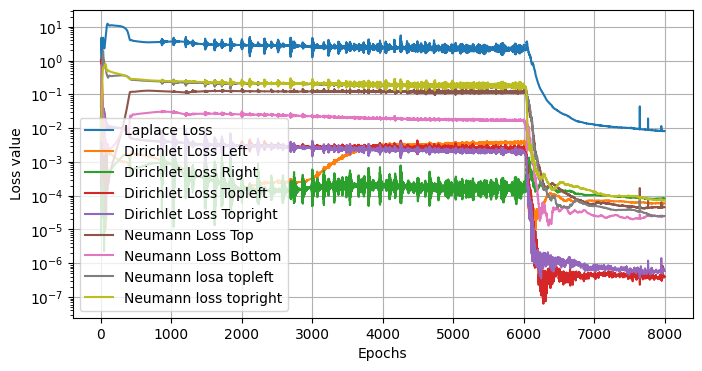

124m 31s

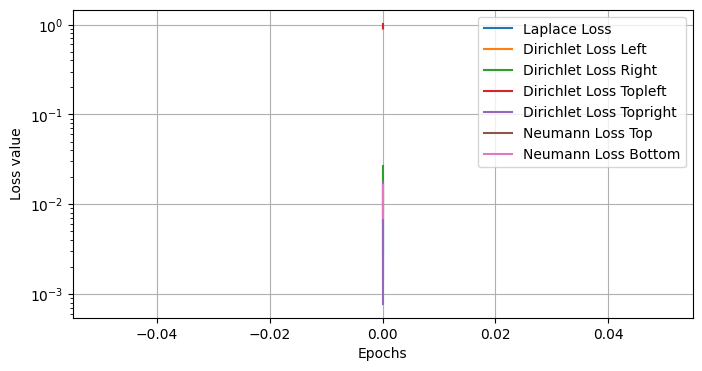

Epoch 0, Loss: 1.845473051071167
Loss Weights: tensor([2.0000, 2.0000, 2.0000, 2.0000, 2.0000, 2.0000, 2.0000],
       requires_grad=True)


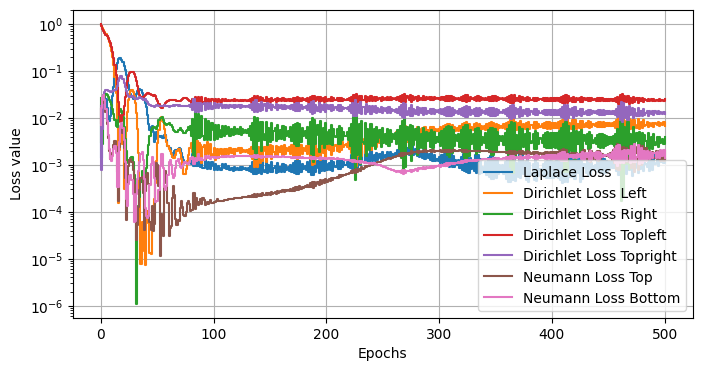

Epoch 500, Loss: 9.479493141174316
Loss Weights: tensor([ 60.1915,  40.6933, 300.9825, 120.8156, 354.5141, 204.6575, 192.4036],
       requires_grad=True)


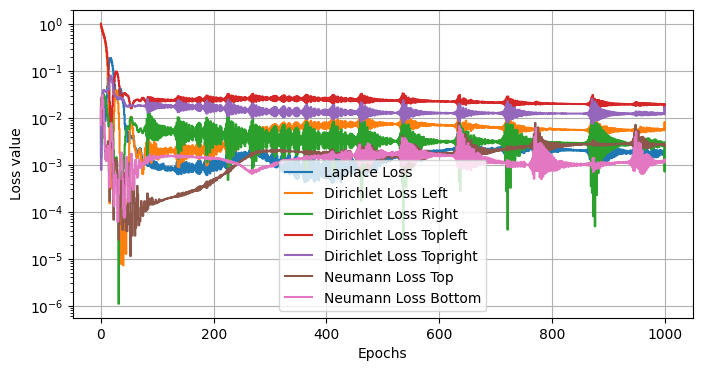

Epoch 1000, Loss: 19.788021087646484
Loss Weights: tensor([129.1220,  91.6852, 619.2401, 285.5941, 748.3181, 707.0175, 493.7418],
       requires_grad=True)


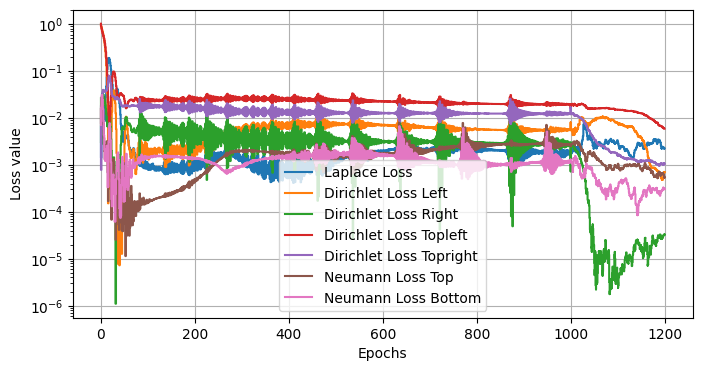

Epoch 1200, Loss: 3.995180130004883
Loss Weights: tensor([176.4883, 119.4585, 637.7268, 344.9033, 800.7474, 814.8939, 545.4337],
       requires_grad=True)


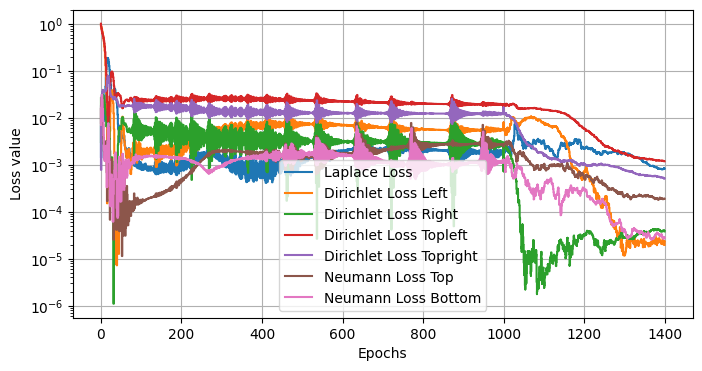

Epoch 1400, Loss: 1.2240086793899536
Loss Weights: tensor([208.4678, 120.2172, 639.4184, 356.2903, 813.9590, 844.4938, 556.6096],
       requires_grad=True)


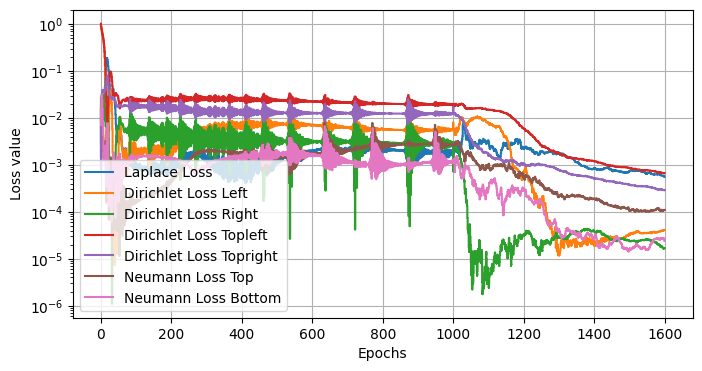

Epoch 1600, Loss: 0.7269713878631592
Loss Weights: tensor([224.8785, 120.3994, 641.1370, 361.0110, 821.4036, 858.2639, 559.5823],
       requires_grad=True)


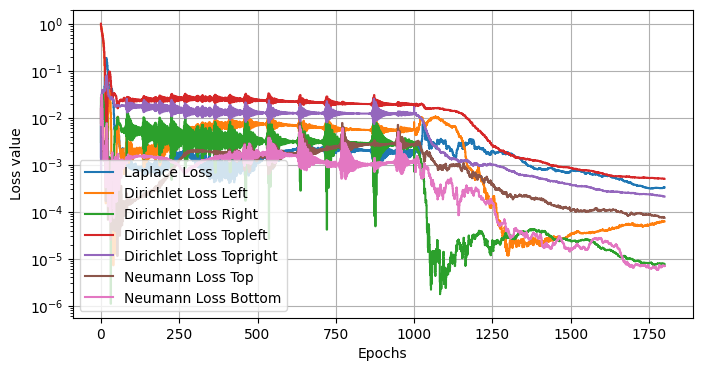

Epoch 1800, Loss: 0.5202880501747131
Loss Weights: tensor([235.7257, 120.7352, 641.9180, 364.3808, 826.7410, 869.7680, 561.4686],
       requires_grad=True)


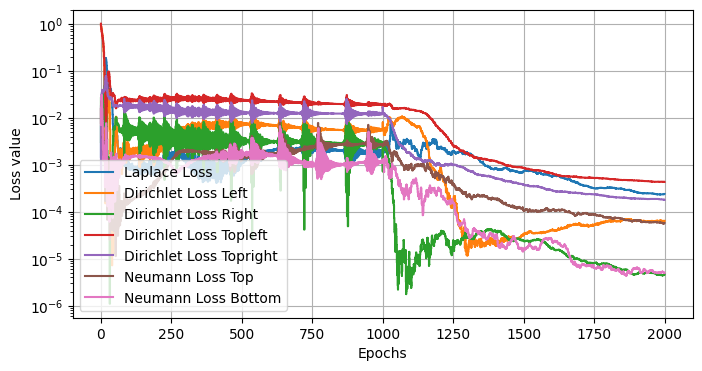

Epoch 2000, Loss: 0.4332985579967499
Loss Weights: tensor([243.6232, 121.2190, 642.3681, 367.5432, 831.4157, 878.8452, 562.4775],
       requires_grad=True)


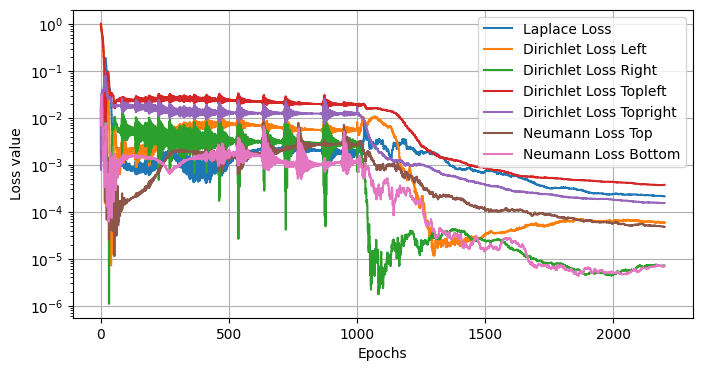

Epoch 2200, Loss: 0.3794716000556946
Loss Weights: tensor([250.9945, 121.7527, 642.9445, 370.5823, 835.8643, 887.0345, 563.6660],
       requires_grad=True)


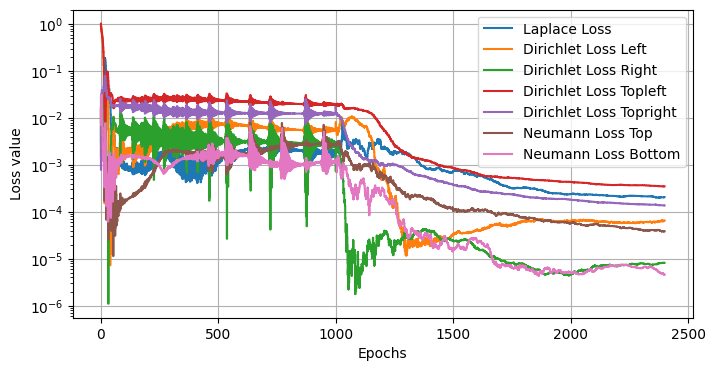

Epoch 2400, Loss: 0.34822914004325867
Loss Weights: tensor([258.6340, 122.3195, 643.7269, 373.6989, 840.2258, 894.4175, 565.1575],
       requires_grad=True)


In [114]:
def set_seed(seed=42):
    random.seed(seed)  # Python random module
    np.random.seed(seed)  # Numpy random module
    torch.manual_seed(seed)  # PyTorch CPU
    torch.cuda.manual_seed(seed)  # PyTorch GPU
    torch.cuda.manual_seed_all(seed)  # All GPUs (if multiple)

# Set the seed
set_seed(123)

# Define the neural network for the Physics-Informed Neural Network (PINN)
class pinn(nn.Module):
    def __init__(self, hidden_size=20, hidden_layers=3):
        super(pinn, self).__init__()
        layers = [nn.Linear(2, hidden_size), nn.Tanh()]  # Change Tanh to GeLU
        for _ in range(hidden_layers):
            layers.append(nn.Linear(hidden_size, hidden_size))
            layers.append(nn.Tanh())  # Change Tanh to GeLU
        layers.append(nn.Linear(hidden_size, 1))
        self.network = nn.Sequential(*layers)
        
    def forward(self, x):
        return self.network(x)

def laplace_residual(model, coords):
    u = model(coords)
    grads = torch.autograd.grad(u, coords, grad_outputs=torch.ones_like(u), create_graph=True)[0]
    u_xx = torch.autograd.grad(grads[:, 0], coords, grad_outputs=torch.ones_like(grads[:, 0]), create_graph=True)[0][:, 0]
    u_yy = torch.autograd.grad(grads[:, 1], coords, grad_outputs=torch.ones_like(grads[:, 1]), create_graph=True)[0][:, 1]
    return torch.mean((u_xx + u_yy) ** 2)

#Boundary conditions:
def loss_dirichlet_boundary(model,boundary_points,boundary_target):
    u_pred = model(boundary_points)
    boundary_residual= u_pred-boundary_target
    return torch.mean((boundary_residual)**2)

def loss_neumann_boundary(model,boundary_points,axis='horizontal'):
    u_pred = model(boundary_points)
    u_grad= torch.autograd.grad(u_pred,boundary_points,grad_outputs=torch.ones_like(u_pred),create_graph=True)[0] #This is the gradient of u 
    if axis=='vertical':
        u_x = u_grad[:,0] # This is the x-component of the gradient of u
        return torch.mean((u_x)**2)
    elif axis=='horizontal':
        u_y = u_grad[:,1] # This is the y-component of the gradient of u
        return torch.mean((u_y)**2)

# Function to create boundary points
def create_boundary_points(axis, place, start, end, num_points, head=None):
    line_points = torch.full((num_points, 1), place)
    place_points = start + (end - start) * torch.rand(num_points, 1)
    
    if axis == 'vertical':
        boundary_points = torch.cat([line_points, place_points], dim=1)
    elif axis == 'horizontal':
        boundary_points = torch.cat([place_points, line_points], dim=1)

    # Only return targets if head value is provided (for Dirichlet conditions)
    if head is not None:
        boundary_targets = torch.full((num_points, 1), head, dtype=torch.float)
        return boundary_points, boundary_targets
    else:
        return boundary_points

def plot_losses(epochs, losses_dict):
    plt.figure(figsize=(8, 4))
    
    for loss_name, loss_values in losses_dict.items():
        plt.plot(epochs, loss_values, label=loss_name)
    plt.gca().yaxis.set_major_locator(LogLocator(base=10.0))
    plt.gca().yaxis.set_major_formatter(FormatStrFormatter('%.1f'))

    plt.yscale('log')
    plt.xlabel("Epochs")
    plt.ylabel("Loss value")
    plt.grid()
    plt.legend()
    plt.show()


def closure():
    
    # Compute individual loss terms
    loss_laplace = laplace_residual(model, train_points)
    loss_d_l = loss_dirichlet_boundary(model, boundary_points_dirichlet_left, target_points_dirichlet_left)
    loss_d_r = loss_dirichlet_boundary(model, boundary_points_dirichlet_right, target_points_dirichlet_right)
    loss_d_tl = loss_dirichlet_boundary(model, boundary_points_dirichlet_topleft, target_points_dirichlet_topleft)
    loss_d_tr = loss_dirichlet_boundary(model, boundary_points_dirichlet_topright, target_points_dirichlet_topright)
    loss_n_t = loss_neumann_boundary(model, boundary_points_neumann_top, axis='horizontal')
    loss_n_b = loss_neumann_boundary(model, boundary_points_neumann_bottom, axis='horizontal')
    
    # Combine losses using the updated weights
    loss = (
        loss_weights[0] * loss_laplace +
        loss_weights[1] * loss_d_l +
        loss_weights[2] * loss_d_r +
        loss_weights[3] * loss_d_tl +
        loss_weights[4] * loss_d_tr +
        loss_weights[5] * loss_n_t +
        loss_weights[6] * loss_n_b
    )
    
    # Record losses and weights
    laplace_losses.append(loss_laplace.item())
    dirichlet_losses_left.append(loss_d_l.item())
    dirichlet_losses_right.append(loss_d_r.item())
    dirichlet_losses_topleft.append(loss_d_tl.item())
    dirichlet_losses_topright.append(loss_d_tr.item())
    neumann_losses_top.append(loss_n_t.item())
    neumann_losses_bottom.append(loss_n_b.item())
    epochs_recorded.append(epoch)
    loss_recorded.append(loss.item())

    return loss

def closure_loss_weights():
    loss_weights_optimizer.zero_grad()  # Clear gradients for loss_weights
    # Reverse the gradient for maximization by negating the loss
    loss = -closure()  # Negate the loss to maximize
    loss.backward()  # Compute the gradients
    return loss

def closure_model():
    optimizer.zero_grad()  # Clear gradients for model
    loss = closure()  # Calculate loss
    loss.backward()  # Retain the graph for reuse
    return loss

#_____________________________________________________________________________________________________________

#Domain size:
left, right, bottom, top = 0, 1, 0, 0.2

left_dirichlet,target_left_dirichlet = create_boundary_points('vertical', left, 0, top, 1000, 1)  # Left boundary
boundary_points_dirichlet_left=torch.cat([left_dirichlet],dim=0).requires_grad_(True)  # Concatenate Dirichlet boundary points
target_points_dirichlet_left=torch.cat([target_left_dirichlet],dim=0).requires_grad_(True) # Concatenate Dirichlet boundary targets

right_dirichlet, target_right_dirichlet = create_boundary_points('vertical', right, 0, top, 1000, 0) # Right boundary
boundary_points_dirichlet_right=torch.cat([right_dirichlet],dim=0).requires_grad_(True) # Concatenate Dirichlet boundary points
target_points_dirichlet_right=torch.cat([target_right_dirichlet],dim=0).requires_grad_(True) # Concatenate Dirichlet boundary targets

topleft_dirichlet, target_topleft_dirichlet= create_boundary_points('horizontal', top, 0, 0.3*right, 3000, 1)
boundary_points_dirichlet_topleft=torch.cat([topleft_dirichlet],dim=0).requires_grad_(True)
target_points_dirichlet_topleft=torch.cat([target_topleft_dirichlet],dim=0).requires_grad_(True)

topright_dirichlet,target_topright_dirichlet = create_boundary_points('horizontal', top, 0.7*right, 1*right, 3000, 0)
boundary_points_dirichlet_topright=torch.cat([topright_dirichlet],dim=0).requires_grad_(True)
target_points_dirichlet_topright=torch.cat([target_topright_dirichlet],dim=0).requires_grad_(True)

top_neumann=create_boundary_points('horizontal', top, 0.3*right, 0.7*right, 3000)
boundary_points_neumann_top=torch.cat([top_neumann],dim=0).requires_grad_(True)

bottom_neumann=create_boundary_points('horizontal', bottom, 0, right, 1000)
boundary_points_neumann_bottom=torch.cat([bottom_neumann],dim=0).requires_grad_(True)


# Creating domain points
num_domain_points=6501
x_points = torch.rand(num_domain_points,1) 
x = (x_points*right).requires_grad_(True)
y_points = torch.rand(num_domain_points,1)
y=(y_points*top).requires_grad_(True)
train_points=torch.cat([x,y],dim=1) 

# Initialize lists to store losses and plot
laplace_losses = []
dirichlet_losses_left = []
dirichlet_losses_right = []
dirichlet_losses_topleft = []
dirichlet_losses_topright = []
neumann_losses_top = []
neumann_losses_bottom = []
epochs_recorded = []
loss_recorded = []


#Defining hyperparameters:
model=pinn(hidden_size=20, hidden_layers=8) 

epochs=2500

# Initialize the loss weights
lambda_laplace, y_d_l, y_d_r, y_d_tl, y_d_tr, y_n_t, y_n_b = 1,1,1,1,1,1,1
loss_weights = (torch.tensor([lambda_laplace, y_d_l, y_d_r, y_d_tl, y_d_tr, y_n_t, y_n_b], 
                            dtype=torch.float, requires_grad=True))

adam_optimizer = torch.optim.Adam(model.parameters(), lr=0.001)
lbfgs_optimizer = torch.optim.LBFGS(model.parameters(), lr=0.1, max_iter=20)
loss_weights_optimizer = torch.optim.Adam([loss_weights], lr=1)  # Smaller learning rate for stability

# Initialize the weights and biases of the model
def initialize_weights(m):
    if isinstance(m, nn.Linear):
        nn.init.xavier_normal_(m.weight)  # Use Xavier initialization
        nn.init.zeros_(m.bias)  # Initialize biases to zero
# Apply weight initialization
model.apply(initialize_weights)

#Training loop:
for epoch in range(epochs):
    optimizer = adam_optimizer if epoch < 1000 else lbfgs_optimizer

    optimizer.step(closure_model) # Update the weights and biases of the model
    loss_weights_optimizer.step(closure_loss_weights)

    # Logging

    if epoch % 500 == 0 and epoch <= 1000:
        losses_dict = {
            "Laplace Loss": laplace_losses,
            "Dirichlet Loss Left": dirichlet_losses_left,
            "Dirichlet Loss Right": dirichlet_losses_right,
            "Dirichlet Loss Topleft": dirichlet_losses_topleft,
            "Dirichlet Loss Topright": dirichlet_losses_topright,
            "Neumann Loss Top": neumann_losses_top,
            "Neumann Loss Bottom": neumann_losses_bottom
        }

        plot_losses(epochs_recorded, losses_dict)
        print(f"Epoch {epoch}, Loss: {loss_recorded[-1]}")
        print(f"Loss Weights: {loss_weights}")
    
    if epoch % 200 == 0 and epoch > 1000:
        losses_dict = {
            "Laplace Loss": laplace_losses,
            "Dirichlet Loss Left": dirichlet_losses_left,
            "Dirichlet Loss Right": dirichlet_losses_right,
            "Dirichlet Loss Topleft": dirichlet_losses_topleft,
            "Dirichlet Loss Topright": dirichlet_losses_topright,
            "Neumann Loss Top": neumann_losses_top,
            "Neumann Loss Bottom": neumann_losses_bottom
        }

        plot_losses(epochs_recorded, losses_dict)
        print(f"Epoch {epoch}, Loss: {loss_recorded[-1]}")
        print(f"Loss Weights: {loss_weights}")

In [115]:
# Assume `model` is your trained instance of the `pinn` class
model_path = "#9.2.pth"
torch.save(model.state_dict(), model_path)
print(f"Model's state dictionary saved to {model_path}")

Model's state dictionary saved to #9.2.pth


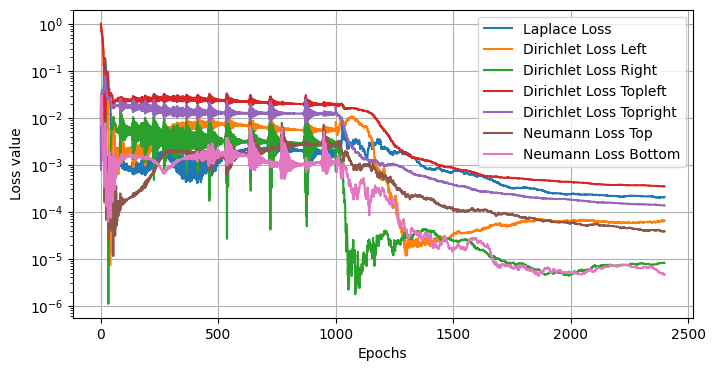

70m 27s

## 9.3 
no extra, just ADAM + LBFGS.
8000 domain poins and 8000 epochs.

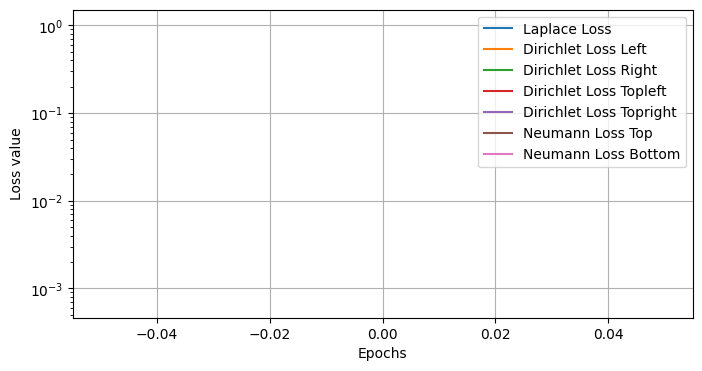

Epoch 0, Loss: 1155.4783935546875


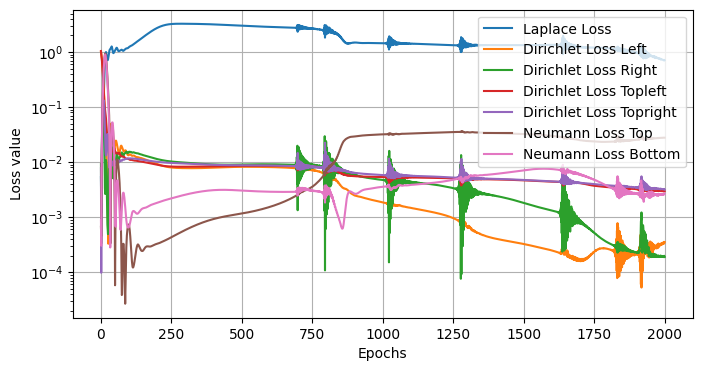

Epoch 2000, Loss: 10.702887535095215


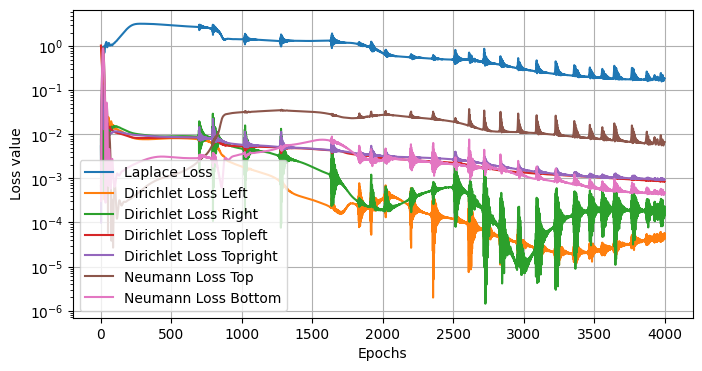

Epoch 4000, Loss: 2.9279227256774902


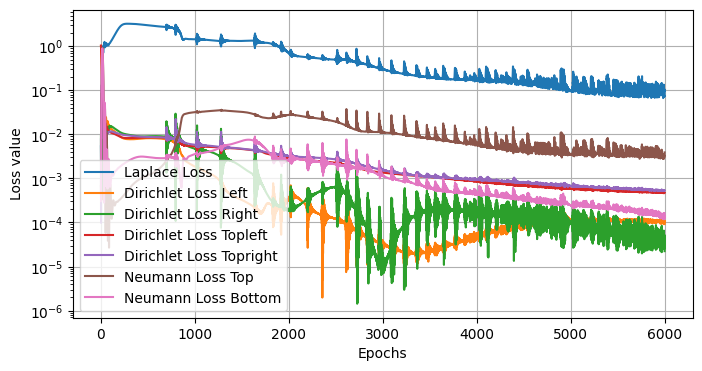

Epoch 6000, Loss: 1.62215256690979


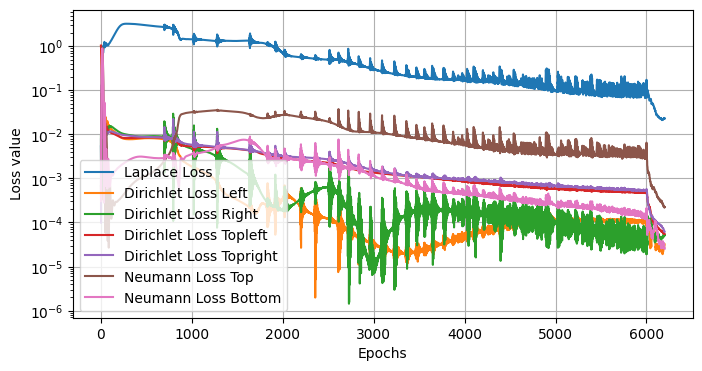

Epoch 6200, Loss: 0.19569747149944305


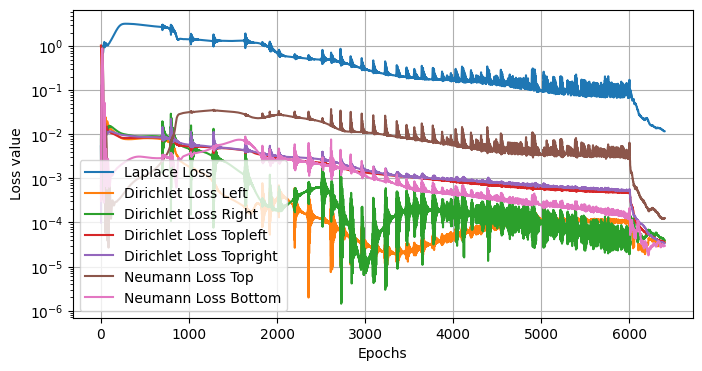

Epoch 6400, Loss: 0.11507368087768555


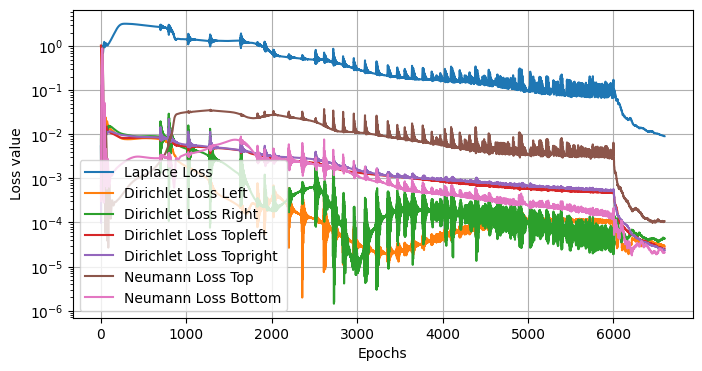

Epoch 6600, Loss: 0.08732949942350388


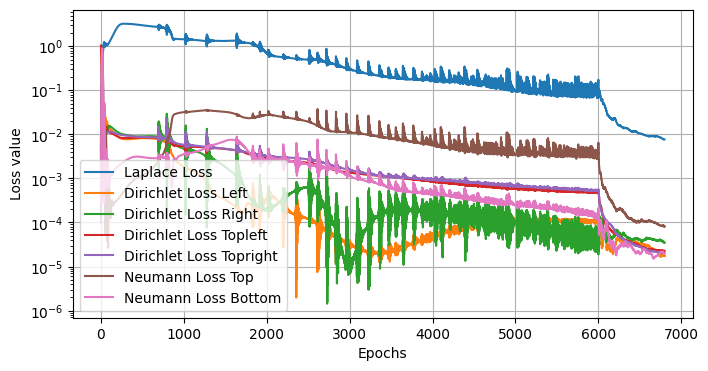

Epoch 6800, Loss: 0.07370984554290771


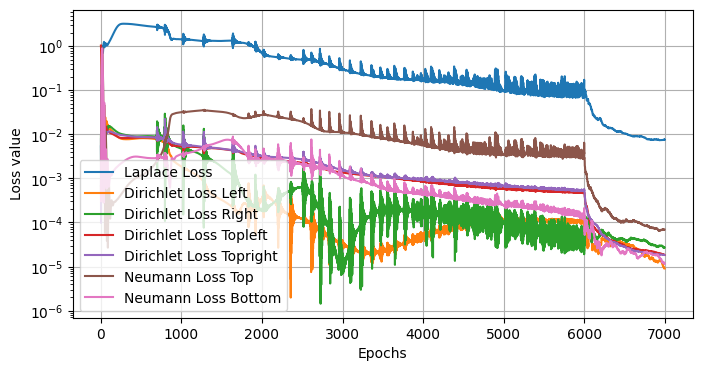

Epoch 7000, Loss: 0.06348276883363724


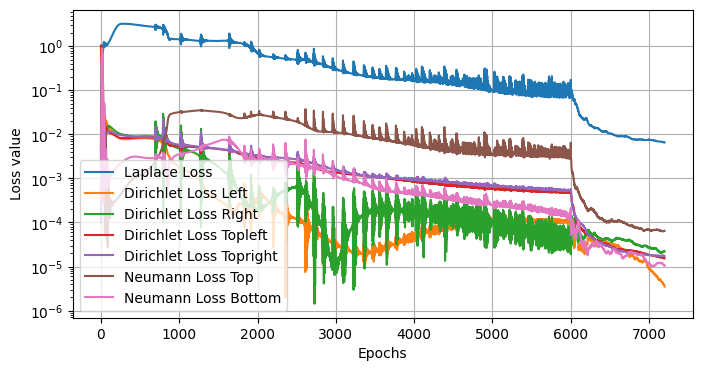

Epoch 7200, Loss: 0.05599944293498993


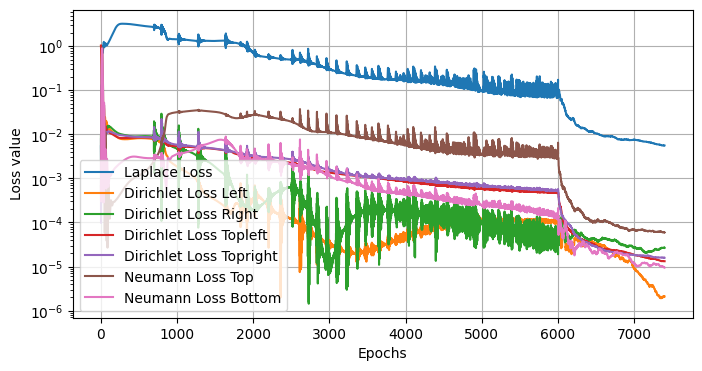

Epoch 7400, Loss: 0.04998629540205002


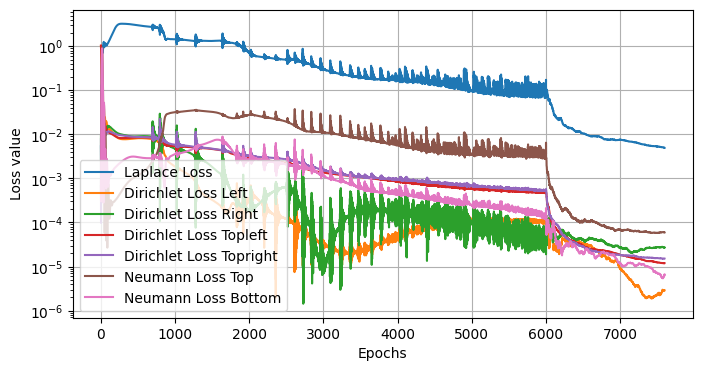

Epoch 7600, Loss: 0.046454429626464844


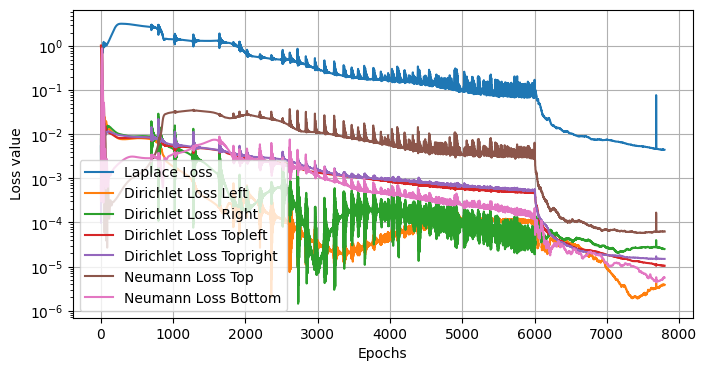

Epoch 7800, Loss: 0.043850377202034


In [116]:
def set_seed(seed=42):
    random.seed(seed)  # Python random module
    np.random.seed(seed)  # Numpy random module
    torch.manual_seed(seed)  # PyTorch CPU
    torch.cuda.manual_seed(seed)  # PyTorch GPU
    torch.cuda.manual_seed_all(seed)  # All GPUs (if multiple)

# Set the seed
set_seed(123)

# Define the neural network for the Physics-Informed Neural Network (PINN)
class pinn(nn.Module):
    def __init__(self, hidden_size=20, hidden_layers=3):
        super(pinn, self).__init__()
        layers = [nn.Linear(2, hidden_size), nn.Tanh()]  # Change Tanh to GeLU
        for _ in range(hidden_layers):
            layers.append(nn.Linear(hidden_size, hidden_size))
            layers.append(nn.Tanh())  # Change Tanh to GeLU
        layers.append(nn.Linear(hidden_size, 1))
        self.network = nn.Sequential(*layers)
        
    def forward(self, x):
        return self.network(x)

def laplace_residual(model, coords):
    u = model(coords)
    grads = torch.autograd.grad(u, coords, grad_outputs=torch.ones_like(u), create_graph=True)[0]
    u_xx = torch.autograd.grad(grads[:, 0], coords, grad_outputs=torch.ones_like(grads[:, 0]), create_graph=True)[0][:, 0]
    u_yy = torch.autograd.grad(grads[:, 1], coords, grad_outputs=torch.ones_like(grads[:, 1]), create_graph=True)[0][:, 1]
    return torch.mean((u_xx + u_yy) ** 2)

#Boundary conditions:
def loss_dirichlet_boundary(model,boundary_points,boundary_target):
    u_pred = model(boundary_points)
    boundary_residual= u_pred-boundary_target
    return torch.mean((boundary_residual)**2)

def loss_neumann_boundary(model,boundary_points,axis='horizontal'):
    u_pred = model(boundary_points)
    u_grad= torch.autograd.grad(u_pred,boundary_points,grad_outputs=torch.ones_like(u_pred),create_graph=True)[0] #This is the gradient of u 
    if axis=='vertical':
        u_x = u_grad[:,0] # This is the x-component of the gradient of u
        return torch.mean((u_x)**2)
    elif axis=='horizontal':
        u_y = u_grad[:,1] # This is the y-component of the gradient of u
        return torch.mean((u_y)**2)

# Function to create boundary points
def create_boundary_points(axis, place, start, end, num_points, head=None):
    line_points = torch.full((num_points, 1), place)
    place_points = start + (end - start) * torch.rand(num_points, 1)
    
    if axis == 'vertical':
        boundary_points = torch.cat([line_points, place_points], dim=1)
    elif axis == 'horizontal':
        boundary_points = torch.cat([place_points, line_points], dim=1)

    # Only return targets if head value is provided (for Dirichlet conditions)
    if head is not None:
        boundary_targets = torch.full((num_points, 1), head, dtype=torch.float)
        return boundary_points, boundary_targets
    else:
        return boundary_points

def plot_losses(epochs, losses_dict):
    plt.figure(figsize=(8, 4))
    
    for loss_name, loss_values in losses_dict.items():
        plt.plot(epochs, loss_values, label=loss_name)
    plt.gca().yaxis.set_major_locator(LogLocator(base=10.0))
    plt.gca().yaxis.set_major_formatter(FormatStrFormatter('%.1f'))

    plt.yscale('log')
    plt.xlabel("Epochs")
    plt.ylabel("Loss value")
    plt.grid()
    plt.legend()
    plt.show()


def closure():
    optimizer.zero_grad()

    # Compute individual loss terms
    loss_laplace = laplace_residual(model, train_points)
    loss_d_l = loss_dirichlet_boundary(model, boundary_points_dirichlet_left, target_points_dirichlet_left)
    loss_d_r = loss_dirichlet_boundary(model, boundary_points_dirichlet_right, target_points_dirichlet_right)
    loss_d_tl = loss_dirichlet_boundary(model, boundary_points_dirichlet_topleft, target_points_dirichlet_topleft)
    loss_d_tr = loss_dirichlet_boundary(model, boundary_points_dirichlet_topright, target_points_dirichlet_topright)
    loss_n_t = loss_neumann_boundary(model, boundary_points_neumann_top, axis='horizontal')
    loss_n_b = loss_neumann_boundary(model, boundary_points_neumann_bottom, axis='horizontal')
    
    # Combine losses using the updated weights
    loss = (
        loss_weights[0] * loss_laplace +
        loss_weights[1] * loss_d_l +
        loss_weights[2] * loss_d_r +
        loss_weights[3] * loss_d_tl +
        loss_weights[4] * loss_d_tr +
        loss_weights[5] * loss_n_t +
        loss_weights[6] * loss_n_b
    )

    loss.backward()
    
    # Record losses and weights
    laplace_losses.append(loss_laplace.item())
    dirichlet_losses_left.append(loss_d_l.item())
    dirichlet_losses_right.append(loss_d_r.item())
    dirichlet_losses_topleft.append(loss_d_tl.item())
    dirichlet_losses_topright.append(loss_d_tr.item())
    neumann_losses_top.append(loss_n_t.item())
    neumann_losses_bottom.append(loss_n_b.item())
    epochs_recorded.append(epoch)
    loss_recorded.append(loss.item())

    return loss

#_____________________________________________________________________________________________________________

#Domain size:
left, right, bottom, top = 0, 1, 0, 0.2

left_dirichlet,target_left_dirichlet = create_boundary_points('vertical', left, 0, top, 1000, 1)  # Left boundary
boundary_points_dirichlet_left=torch.cat([left_dirichlet],dim=0).requires_grad_(True)  # Concatenate Dirichlet boundary points
target_points_dirichlet_left=torch.cat([target_left_dirichlet],dim=0).requires_grad_(True) # Concatenate Dirichlet boundary targets

right_dirichlet, target_right_dirichlet = create_boundary_points('vertical', right, 0, top, 1000, 0) # Right boundary
boundary_points_dirichlet_right=torch.cat([right_dirichlet],dim=0).requires_grad_(True) # Concatenate Dirichlet boundary points
target_points_dirichlet_right=torch.cat([target_right_dirichlet],dim=0).requires_grad_(True) # Concatenate Dirichlet boundary targets

topleft_dirichlet, target_topleft_dirichlet= create_boundary_points('horizontal', top, 0, 0.3*right, 3000, 1)
boundary_points_dirichlet_topleft=torch.cat([topleft_dirichlet],dim=0).requires_grad_(True)
target_points_dirichlet_topleft=torch.cat([target_topleft_dirichlet],dim=0).requires_grad_(True)

topright_dirichlet,target_topright_dirichlet = create_boundary_points('horizontal', top, 0.7*right, 1*right, 3000, 0)
boundary_points_dirichlet_topright=torch.cat([topright_dirichlet],dim=0).requires_grad_(True)
target_points_dirichlet_topright=torch.cat([target_topright_dirichlet],dim=0).requires_grad_(True)

top_neumann=create_boundary_points('horizontal', top, 0.3*right, 0.7*right, 3000)
boundary_points_neumann_top=torch.cat([top_neumann],dim=0).requires_grad_(True)

bottom_neumann=create_boundary_points('horizontal', bottom, 0, right, 1000)
boundary_points_neumann_bottom=torch.cat([bottom_neumann],dim=0).requires_grad_(True)


# Creating domain points
num_domain_points=8001
x_points = torch.rand(num_domain_points,1) 
x = (x_points*right).requires_grad_(True)
y_points = torch.rand(num_domain_points,1)
y=(y_points*top).requires_grad_(True)
train_points=torch.cat([x,y],dim=1) 

# Initialize lists to store losses and plot
laplace_losses = []
dirichlet_losses_left = []
dirichlet_losses_right = []
dirichlet_losses_topleft = []
dirichlet_losses_topright = []
neumann_losses_top = []
neumann_losses_bottom = []
epochs_recorded = []
loss_recorded = []


#Defining hyperparameters:
model=pinn(hidden_size=20, hidden_layers=8) 

epochs=8000

# Initialize the loss weights
lambda_laplace, y_d_l, y_d_r, y_d_tl, y_d_tr, y_n_t, y_n_b = 2,100,100,1000,1000,100,100
loss_weights = (torch.tensor([lambda_laplace, y_d_l, y_d_r, y_d_tl, y_d_tr, y_n_t, y_n_b], 
                            dtype=torch.float, requires_grad=False))

adam_optimizer = torch.optim.Adam(model.parameters(), lr=0.001)
lbfgs_optimizer = torch.optim.LBFGS(model.parameters(), lr=0.1, max_iter=20)

# Initialize the weights and biases of the model
def initialize_weights(m):
    if isinstance(m, nn.Linear):
        nn.init.xavier_normal_(m.weight)  # Use Xavier initialization
        nn.init.zeros_(m.bias)  # Initialize biases to zero
# Apply weight initialization
model.apply(initialize_weights)


#Training loop:
for epoch in range(epochs):
    optimizer = adam_optimizer if epoch < 6001 else lbfgs_optimizer
    optimizer.step(closure) # Update the weights and biases of the model

    # Logging

    if epoch % 2000 == 0 and epoch <= 6000:
        losses_dict = {
            "Laplace Loss": laplace_losses,
            "Dirichlet Loss Left": dirichlet_losses_left,
            "Dirichlet Loss Right": dirichlet_losses_right,
            "Dirichlet Loss Topleft": dirichlet_losses_topleft,
            "Dirichlet Loss Topright": dirichlet_losses_topright,
            "Neumann Loss Top": neumann_losses_top,
            "Neumann Loss Bottom": neumann_losses_bottom
        }

        plot_losses(epochs_recorded, losses_dict)
        print(f"Epoch {epoch}, Loss: {loss_recorded[-1]}")
    
    if epoch % 200 == 0 and epoch > 6000:
        losses_dict = {
            "Laplace Loss": laplace_losses,
            "Dirichlet Loss Left": dirichlet_losses_left,
            "Dirichlet Loss Right": dirichlet_losses_right,
            "Dirichlet Loss Topleft": dirichlet_losses_topleft,
            "Dirichlet Loss Topright": dirichlet_losses_topright,
            "Neumann Loss Top": neumann_losses_top,
            "Neumann Loss Bottom": neumann_losses_bottom
        }

        plot_losses(epochs_recorded, losses_dict)
        print(f"Epoch {epoch}, Loss: {loss_recorded[-1]}")

In [118]:
# Assume `model` is your trained instance of the `pinn` class
model_path = "#9.3.pth"
torch.save(model.state_dict(), model_path)
print(f"Model's state dictionary saved to {model_path}")

Model's state dictionary saved to #9.3.pth


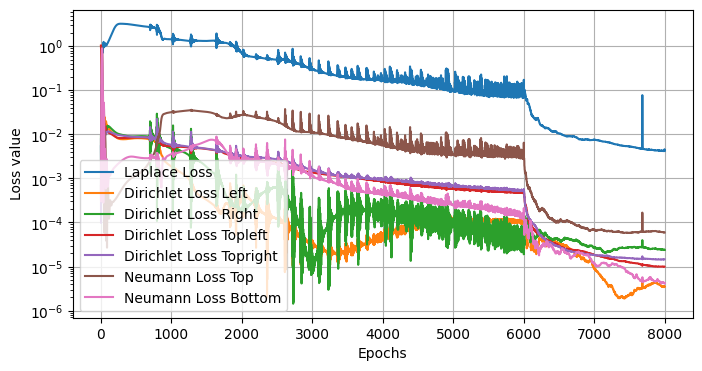

118m 23s

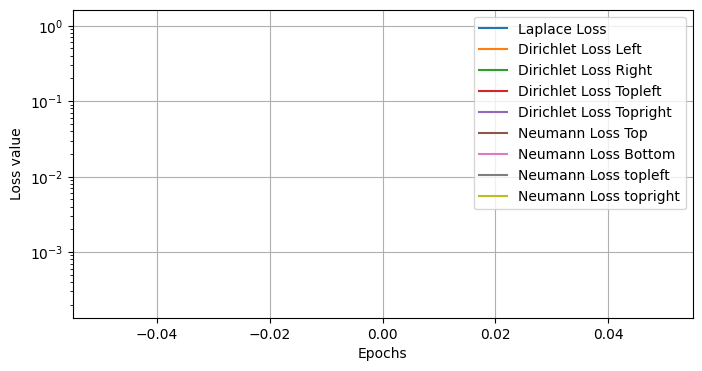

Epoch 0, Loss: 1180.665771484375


In [ ]:
def set_seed(seed=42):
    random.seed(seed)  # Python random module
    np.random.seed(seed)  # Numpy random module
    torch.manual_seed(seed)  # PyTorch CPU
    torch.cuda.manual_seed(seed)  # PyTorch GPU
    torch.cuda.manual_seed_all(seed)  # All GPUs (if multiple)

# Set the seed
set_seed(123)

# Define the neural network for the Physics-Informed Neural Network (PINN)
class pinn(nn.Module):
    def __init__(self, hidden_size=20, hidden_layers=3):
        super(pinn, self).__init__()
        layers = [nn.Linear(2, hidden_size), nn.Tanh()]  # Change Tanh to GeLU
        for _ in range(hidden_layers):
            layers.append(nn.Linear(hidden_size, hidden_size))
            layers.append(nn.Tanh())  # Change Tanh to GeLU
        layers.append(nn.Linear(hidden_size, 1))
        self.network = nn.Sequential(*layers)
        
    def forward(self, x):
        return self.network(x)

def laplace_residual(model, coords):
    u = model(coords)
    grads = torch.autograd.grad(u, coords, grad_outputs=torch.ones_like(u), create_graph=True)[0]
    u_xx = torch.autograd.grad(grads[:, 0], coords, grad_outputs=torch.ones_like(grads[:, 0]), create_graph=True)[0][:, 0]
    u_yy = torch.autograd.grad(grads[:, 1], coords, grad_outputs=torch.ones_like(grads[:, 1]), create_graph=True)[0][:, 1]
    return torch.mean((u_xx + u_yy) ** 2)

#Boundary conditions:
def loss_dirichlet_boundary(model,boundary_points,boundary_target):
    u_pred = model(boundary_points)
    boundary_residual= u_pred-boundary_target
    return torch.mean((boundary_residual)**2)

def loss_neumann_boundary(model,boundary_points,axis='horizontal'):
    u_pred = model(boundary_points)
    u_grad= torch.autograd.grad(u_pred,boundary_points,grad_outputs=torch.ones_like(u_pred),create_graph=True)[0] #This is the gradient of u 
    if axis=='vertical':
        u_x = u_grad[:,0] # This is the x-component of the gradient of u
        return torch.mean((u_x)**2)
    elif axis=='horizontal':
        u_y = u_grad[:,1] # This is the y-component of the gradient of u
        return torch.mean((u_y)**2)

# Function to create boundary points
def create_boundary_points(axis, place, start, end, num_points, head=None):
    line_points = torch.full((num_points, 1), place)
    place_points = start + (end - start) * torch.rand(num_points, 1)
    
    if axis == 'vertical':
        boundary_points = torch.cat([line_points, place_points], dim=1)
    elif axis == 'horizontal':
        boundary_points = torch.cat([place_points, line_points], dim=1)

    # Only return targets if head value is provided (for Dirichlet conditions)
    if head is not None:
        boundary_targets = torch.full((num_points, 1), head, dtype=torch.float)
        return boundary_points, boundary_targets
    else:
        return boundary_points

def plot_losses(epochs, losses_dict):
    plt.figure(figsize=(8, 4))
    
    for loss_name, loss_values in losses_dict.items():
        plt.plot(epochs, loss_values, label=loss_name)
    plt.gca().yaxis.set_major_locator(LogLocator(base=10.0))
    plt.gca().yaxis.set_major_formatter(FormatStrFormatter('%.1f'))

    plt.yscale('log')
    plt.xlabel("Epochs")
    plt.ylabel("Loss value")
    plt.grid()
    plt.legend()
    plt.show()


def closure():
    optimizer.zero_grad()

    # Compute individual loss terms
    loss_laplace = laplace_residual(model, train_points)
    loss_d_l = loss_dirichlet_boundary(model, boundary_points_dirichlet_left, target_points_dirichlet_left)
    loss_d_r = loss_dirichlet_boundary(model, boundary_points_dirichlet_right, target_points_dirichlet_right)
    loss_d_tl = loss_dirichlet_boundary(model, boundary_points_dirichlet_topleft, target_points_dirichlet_topleft)
    loss_d_tr = loss_dirichlet_boundary(model, boundary_points_dirichlet_topright, target_points_dirichlet_topright)
    loss_n_t = loss_neumann_boundary(model, boundary_points_neumann_top, axis='horizontal')
    loss_n_b = loss_neumann_boundary(model, boundary_points_neumann_bottom, axis='horizontal')
    loss_n_tl = loss_neumann_boundary(model, boundary_points_neumann_topleft, axis='vertical')
    loss_n_tr = loss_neumann_boundary(model, boundary_points_neumann_topright, axis='vertical')
    
    # Combine losses using the updated weights
    loss = (
        loss_weights[0] * loss_laplace +
        loss_weights[1] * loss_d_l +
        loss_weights[2] * loss_d_r +
        loss_weights[3] * loss_d_tl +
        loss_weights[4] * loss_d_tr +
        loss_weights[5] * loss_n_t +
        loss_weights[6] * loss_n_b +
        loss_weights[7] * loss_n_tl +
        loss_weights[8] * loss_n_tr
    )

    loss.backward()
    
    # Record losses and weights
    laplace_losses.append(loss_laplace.item())
    dirichlet_losses_left.append(loss_d_l.item())
    dirichlet_losses_right.append(loss_d_r.item())
    dirichlet_losses_topleft.append(loss_d_tl.item())
    dirichlet_losses_topright.append(loss_d_tr.item())
    neumann_losses_top.append(loss_n_t.item())
    neumann_losses_bottom.append(loss_n_b.item())
    epochs_recorded.append(epoch)
    loss_recorded.append(loss.item())
    neumann_losses_topleft.append(loss_n_tl.item())
    neumann_losses_topright.append(loss_n_tr.item())


    return loss

#_____________________________________________________________________________________________________________

#Domain size:
left, right, bottom, top = 0, 1, 0, 0.2

left_dirichlet,target_left_dirichlet = create_boundary_points('vertical', left, 0, top, 1000, 1)  # Left boundary
boundary_points_dirichlet_left=torch.cat([left_dirichlet],dim=0).requires_grad_(True)  # Concatenate Dirichlet boundary points
target_points_dirichlet_left=torch.cat([target_left_dirichlet],dim=0).requires_grad_(True) # Concatenate Dirichlet boundary targets

right_dirichlet, target_right_dirichlet = create_boundary_points('vertical', right, 0, top, 1000, 0) # Right boundary
boundary_points_dirichlet_right=torch.cat([right_dirichlet],dim=0).requires_grad_(True) # Concatenate Dirichlet boundary points
target_points_dirichlet_right=torch.cat([target_right_dirichlet],dim=0).requires_grad_(True) # Concatenate Dirichlet boundary targets

topleft_dirichlet, target_topleft_dirichlet= create_boundary_points('horizontal', top, 0, 0.3*right, 3000, 1)
boundary_points_dirichlet_topleft=torch.cat([topleft_dirichlet],dim=0).requires_grad_(True)
target_points_dirichlet_topleft=torch.cat([target_topleft_dirichlet],dim=0).requires_grad_(True)

topright_dirichlet,target_topright_dirichlet = create_boundary_points('horizontal', top, 0.7*right, 1*right, 3000, 0)
boundary_points_dirichlet_topright=torch.cat([topright_dirichlet],dim=0).requires_grad_(True)
target_points_dirichlet_topright=torch.cat([target_topright_dirichlet],dim=0).requires_grad_(True)

top_neumann=create_boundary_points('horizontal', top, 0.3*right, 0.7*right, 3000)
boundary_points_neumann_top=torch.cat([top_neumann],dim=0).requires_grad_(True)

bottom_neumann=create_boundary_points('horizontal', bottom, 0, right, 1000)
boundary_points_neumann_bottom=torch.cat([bottom_neumann],dim=0).requires_grad_(True)

#Try adding gradient enhanced loss on boundary
topleft_neumann=create_boundary_points('horizontal', top, 0, 0.3*right, 1000)
boundary_points_neumann_topleft=torch.cat([topleft_neumann],dim=0).requires_grad_(True)

topright_neumann=create_boundary_points('horizontal', top, 0.7*right, 1*right, 1000)
boundary_points_neumann_topright=torch.cat([topright_neumann],dim=0).requires_grad_(True)



# Creating domain points
num_domain_points=8000
x_points = torch.rand(num_domain_points,1) 
x = (x_points*right).requires_grad_(True)
y_points = torch.rand(num_domain_points,1)
y=(y_points*top).requires_grad_(True)
train_points=torch.cat([x,y],dim=1) 

# Initialize lists to store losses and plot
laplace_losses = []
dirichlet_losses_left = []
dirichlet_losses_right = []
dirichlet_losses_topleft = []
dirichlet_losses_topright = []
neumann_losses_top = []
neumann_losses_bottom = []
epochs_recorded = []
loss_recorded = []
neumann_losses_topleft = []
neumann_losses_topright = []


#Defining hyperparameters:
model=pinn(hidden_size=20, hidden_layers=8) 

epochs=8001

# Initialize the loss weights
lambda_laplace, y_d_l, y_d_r, y_d_tl, y_d_tr, y_n_t, y_n_b,y_n_tl,y_n_tr = 2,100,100,1000,1000,100,100,1,1
loss_weights = (torch.tensor([lambda_laplace, y_d_l, y_d_r, y_d_tl, y_d_tr, y_n_t, y_n_b, y_n_tl, y_n_tr], 
                            dtype=torch.float, requires_grad=False))

adam_optimizer = torch.optim.Adam(model.parameters(), lr=0.001)
lbfgs_optimizer = torch.optim.LBFGS(model.parameters(), lr=0.1, max_iter=20)

# Initialize the weights and biases of the model
def initialize_weights(m):
    if isinstance(m, nn.Linear):
        nn.init.xavier_normal_(m.weight)  # Use Xavier initialization
        nn.init.zeros_(m.bias)  # Initialize biases to zero
# Apply weight initialization
model.apply(initialize_weights)


#Training loop:
for epoch in range(epochs):
    optimizer = adam_optimizer if epoch < 6001 else lbfgs_optimizer
    optimizer.step(closure) # Update the weights and biases of the model

    # Logging

    if epoch % 2000 == 0 and epoch <= 6000:
        losses_dict = {
            "Laplace Loss": laplace_losses,
            "Dirichlet Loss Left": dirichlet_losses_left,
            "Dirichlet Loss Right": dirichlet_losses_right,
            "Dirichlet Loss Topleft": dirichlet_losses_topleft,
            "Dirichlet Loss Topright": dirichlet_losses_topright,
            "Neumann Loss Top": neumann_losses_top,
            "Neumann Loss Bottom": neumann_losses_bottom,
            "Neumann Loss topleft": neumann_losses_topleft,
            "Neumann Loss topright": neumann_losses_topright
        }

        plot_losses(epochs_recorded, losses_dict)
        print(f"Epoch {epoch}, Loss: {loss_recorded[-1]}")
    
    if epoch % 200 == 0 and epoch > 6000:
        losses_dict = {
            "Laplace Loss": laplace_losses,
            "Dirichlet Loss Left": dirichlet_losses_left,
            "Dirichlet Loss Right": dirichlet_losses_right,
            "Dirichlet Loss Topleft": dirichlet_losses_topleft,
            "Dirichlet Loss Topright": dirichlet_losses_topright,
            "Neumann Loss Top": neumann_losses_top,
            "Neumann Loss Bottom": neumann_losses_bottom,
            "Neumann Loss topleft": neumann_losses_topleft,
            "Neumann Loss topright": neumann_losses_topright
        }

        plot_losses(epochs_recorded, losses_dict)
        print(f"Epoch {epoch}, Loss: {loss_recorded[-1]}")